## IMPORTING

In [1]:
import astropy
import warnings
import numpy as np
import pandas as pd
from matplotlib import pyplot as plt
from sklearn.model_selection import GridSearchCV,cross_val_score,train_test_split,KFold
from sklearn.ensemble import RandomForestClassifier
from sklearn.svm import SVC
from sklearn.neighbors import KNeighborsClassifier
from sklearn.linear_model import Lasso, LogisticRegression
from sklearn.naive_bayes import GaussianNB
from sklearn.datasets import make_classification
from sklearn.preprocessing import StandardScaler,MinMaxScaler
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import accuracy_score
from sklearn.ensemble import AdaBoostClassifier, GradientBoostingClassifier
from xgboost import XGBClassifier
from sklearn.model_selection import cross_val_predict
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score
from sklearn.datasets import make_classification
import seaborn as sns
import matplotlib.pyplot as plt
warnings.filterwarnings("ignore")

# SUPERVISED LEARNING

## LOADING DATA SETS

In [54]:
galaxy=pd.read_csv('/kaggle/input/astronomical-data/galaxy.csv')
star=pd.read_csv('/kaggle/input/astronomical-data/star.csv')

## ON GALAXY DATA

## DATA DESCRIPTION

1. **ra (Right Ascension)**: This column represents the right ascension coordinates of the galaxies. Right ascension is a celestial coordinate similar to longitude on Earth, measured in degrees.

2. **dec (Declination)**: Declination is another celestial coordinate, akin to latitude on Earth, measured in degrees. It indicates how far north or south a celestial object is from the celestial equator.

3. **run**: This column might represent some identifier or code associated with observational runs or surveys.

4. **rExtSFD**: This could be an extinction correction factor for the r-band magnitude measurements. Extinction correction is used to correct for the dimming effect of interstellar dust.

5. **uRaw, gRaw, rRaw, iRaw, zRaw**: These columns represent raw magnitude measurements in different filters (u, g, r, i, z) of the electromagnetic spectrum. Magnitude is a measure of the brightness of celestial objects.

6. **uErr, gErr, rErr, iErr, zErr**: These columns represent the errors or uncertainties associated with the corresponding magnitude measurements in each filter.

7. **uRawPSF, gRawPSF, rRawPSF, iRawPSF, zRawPSF**: These columns represent raw PSF (Point Spread Function) magnitude measurements in different filters. PSF magnitudes are measurements that have been corrected for the blurring effects of the telescope's optics.

8. **upsfErr, gpsfErr, rpsfErr, ipsfErr, zpsfErr**: These columns represent the errors or uncertainties associated with the corresponding PSF magnitude measurements in each filter.

9. **type**: This column might represent some classification or categorical type associated with the galaxies, possibly indicating their morphology or some other characteristic.

10. **ISOLATED**: This is the target variable indicating whether a galaxy is isolated (1) or not (0).

This metadata provides a brief description of each column in the dataset, outlining what each feature represents or measures. It's essential for understanding the context and interpretation of the data during exploratory data analysis and modeling.

In [3]:
galaxy.head(10)

,ra,dec,run,rExtSFD,uRaw,gRaw,rRaw,iRaw,zRaw,uErr,...,rRawPSF,iRawPSF,zRawPSF,upsfErr,gpsfErr,rpsfErr,ipsfErr,zpsfErr,type,ISOLATED
0,0.358174,-0.508718,2728,0.103,23.255,22.633,22.459,21.911,21.211,0.487,...,22.563,22.039,21.240,0.378,0.164,0.140,0.125,0.248,3,1
1,0.357898,-0.570892,2728,0.109,23.025,22.317,21.350,21.057,20.890,0.670,...,22.260,21.932,21.797,0.611,0.148,0.111,0.115,0.379,3,1
2,0.358881,-0.505625,2728,0.103,23.495,24.024,21.378,20.504,20.117,0.697,...,21.802,20.957,20.384,0.613,0.330,0.075,0.054,0.123,3,0
3,0.162688,-0.590807,2728,0.117,25.415,22.606,21.748,21.440,20.861,1.098,...,22.473,22.167,21.498,0.678,0.181,0.134,0.144,0.306,3,1
4,0.142353,-0.613267,2728,0.117,24.530,23.264,20.734,20.029,19.588,1.285,...,21.357,20.670,20.145,0.849,0.257,0.053,0.044,0.100,3,0


In [4]:
np.shape(galaxy)

(248750, 26)

In [5]:
galaxy.describe()

,ra,dec,run,rExtSFD,uRaw,gRaw,rRaw,iRaw,zRaw,uErr,...,rRawPSF,iRawPSF,zRawPSF,upsfErr,gpsfErr,rpsfErr,ipsfErr,zpsfErr,type,ISOLATED
count,248750.000000,248750.000000,248750.000000,248750.000000,248750.000000,248750.000000,248750.000000,248750.000000,248750.000000,248750.000000,...,248750.000000,248750.000000,248750.000000,248750.000000,248750.000000,248750.000000,248750.000000,248750.000000,248750.0,248750.000000
mean,5.099068,0.019974,3694.893053,0.077702,23.424375,22.376347,21.272304,20.909496,20.642582,0.682959,...,22.088934,21.669561,21.208476,0.523204,0.201234,0.130577,0.144146,0.290469,3.0,0.715409
std,2.879502,0.571835,907.876052,0.027291,1.392765,1.255145,1.073504,1.252473,1.322380,0.550004,...,0.901779,0.997956,1.003459,0.324920,0.378432,0.403671,1.007970,0.307409,0.0,0.451220
min,0.000002,-0.999983,2649.000000,0.042000,12.896000,13.194000,12.380000,11.906000,11.599000,0.006000,...,14.353000,14.112000,14.072000,0.011000,0.011000,0.007000,0.010000,0.011000,3.0,0.000000
25%,2.595911,-0.467268,2728.000000,0.061000,22.581000,21.777000,20.776000,20.283000,19.921000,0.380000,...,21.641000,21.133000,20.606000,0.354000,0.101000,0.068000,0.064000,0.148000,3.0,0.000000
50%,5.249634,0.038394,4145.000000,0.071000,23.343000,22.531000,21.565000,21.075000,20.728000,0.609000,...,22.301000,21.794000,21.314000,0.510000,0.162000,0.115000,0.108000,0.263000,3.0,1.000000
75%,7.554812,0.511105,4263.000000,0.084000,24.298000,23.120000,22.072000,21.668000,21.435000,0.886000,...,22.702000,22.285000,21.895000,0.662000,0.253000,0.160000,0.161000,0.396000,3.0,1.000000
max,9.999948,0.999996,7674.000000,0.277000,32.220000,32.933000,22.500000,32.937000,30.068000,41.224000,...,25.990000,26.258000,24.404000,44.971000,66.511000,123.189000,233.043000,70.666000,3.0,1.000000


## CLEANING

In [6]:
galaxy.isna().sum()

ra          0
dec         0
run         0
rExtSFD     0
uRaw        0
gRaw        0
rRaw        0
iRaw        0
zRaw        0
uErr        0
gErr        0
rErr        0
iErr        0
zErr        0
uRawPSF     0
gRawPSF     0
rRawPSF     0
iRawPSF     0
zRawPSF     0
upsfErr     0
gpsfErr     0
rpsfErr     0
ipsfErr     0
zpsfErr     0
type        0
ISOLATED    0
dtype: int64

In [7]:
# df_class_0 = galaxy[galaxy['ISOLATED'] == 0].sample(1400, random_state=42)
# df_class_1 = galaxy[galaxy['ISOLATED'] == 1].sample(1400, random_state=42)

# # Concatenate the downsampled DataFrames
# galaxy = pd.concat([df_class_0, df_class_1], ignore_index=True)

In [8]:
galaxy.head()

,ra,dec,run,rExtSFD,uRaw,gRaw,rRaw,iRaw,zRaw,uErr,...,rRawPSF,iRawPSF,zRawPSF,upsfErr,gpsfErr,rpsfErr,ipsfErr,zpsfErr,type,ISOLATED
0,0.358174,-0.508718,2728,0.103,23.255,22.633,22.459,21.911,21.211,0.487,...,22.563,22.039,21.240,0.378,0.164,0.140,0.125,0.248,3,1
1,0.357898,-0.570892,2728,0.109,23.025,22.317,21.350,21.057,20.890,0.670,...,22.260,21.932,21.797,0.611,0.148,0.111,0.115,0.379,3,1
2,0.358881,-0.505625,2728,0.103,23.495,24.024,21.378,20.504,20.117,0.697,...,21.802,20.957,20.384,0.613,0.330,0.075,0.054,0.123,3,0
3,0.162688,-0.590807,2728,0.117,25.415,22.606,21.748,21.440,20.861,1.098,...,22.473,22.167,21.498,0.678,0.181,0.134,0.144,0.306,3,1
4,0.142353,-0.613267,2728,0.117,24.530,23.264,20.734,20.029,19.588,1.285,...,21.357,20.670,20.145,0.849,0.257,0.053,0.044,0.100,3,0


## EXPLORATORY DATA ANALYSIS (EDA)

**Histogram of Extinction Correction Factor (rExtSFD)**:
   - This histogram shows the distribution of extinction correction factors for the r-band magnitude measurements.
   - The x-axis represents the values of the extinction correction factor (rExtSFD), and the y-axis represents the frequency of occurrence.
   - It provides insights into the range and distribution of extinction correction factors in the dataset.


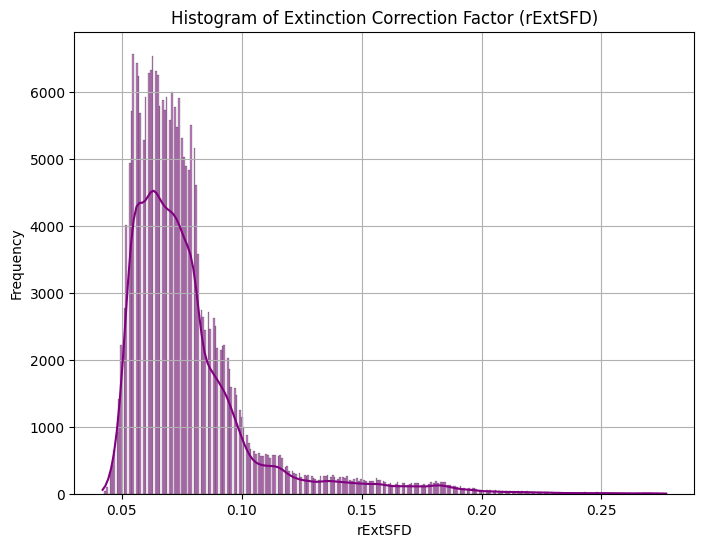

In [20]:
# Histogram of Extinction Correction Factor (rExtSFD)
plt.figure(figsize=(8, 6))
sns.histplot(galaxy['rExtSFD'], kde=True, color='purple')
plt.title('Histogram of Extinction Correction Factor (rExtSFD)')
plt.xlabel('rExtSFD')
plt.ylabel('Frequency')
plt.grid(True)
plt.show()

### INFERENCE:
The histogram of the Extinction Correction Factor (rExtSFD) provides insights into the distribution of extinction correction values among galaxies. Here's a detailed interpretation:

1. **x-axis (rExtSFD)**:
   - The x-axis represents the values of the extinction correction factor (rExtSFD).
   - Each bin on the x-axis represents a range of extinction correction values, and the histogram displays the frequency or count of galaxies falling within each bin.

2. **y-axis (Frequency)**:
   - The y-axis represents the frequency of galaxies within each bin of the extinction correction values.
   - It indicates how many galaxies fall within each range of extinction correction values.

3. **Histogram Shape**:
   - The shape of the histogram shows the distribution of extinction correction factors among galaxies.
   - If the histogram is symmetric and bell-shaped, it indicates a normal distribution of extinction correction values. A skewed distribution (to the left or right) suggests an asymmetric distribution.
   - In some cases, the histogram may exhibit multiple peaks, indicating the presence of subpopulations with different extinction correction values.

4. **KDE (Kernel Density Estimation)**:
   - The KDE curve provides a smooth estimate of the probability density function of the extinction correction values.
   - It helps visualize the overall trend or pattern in the distribution of extinction correction factors, especially in regions where the histogram bins might be sparse.

5. **Interpretation**:
   - The histogram shows the prevalence of different extinction correction values among galaxies.
   - Peaks or clusters in the histogram indicate concentrations of galaxies with similar extinction correction factors. which is at (0.05 to 0.10 )rExtSFD and 6000 frequency.
   - The spread or width of the distribution indicates the variability of extinction correction factors across galaxies.
   - Understanding the distribution of extinction correction factors is crucial for accurately correcting for the dimming effect of interstellar dust in astronomical observations.
   
Overall, the histogram of the Extinction Correction Factor provides a summary of the distribution of extinction correction values among galaxies, offering insights into their characteristics and aiding in the interpretation of astronomical data.

**Scatter Plot of g vs. r Raw Magnitude Measurements**:
   - This scatter plot visualizes the relationship between raw magnitude measurements in the g and r filters.
   - The x-axis represents the g-band raw magnitude measurements, and the y-axis represents the r-band raw magnitude measurements.
   - Each point on the plot corresponds to a galaxy, and its position indicates its brightness in the g and r filters.

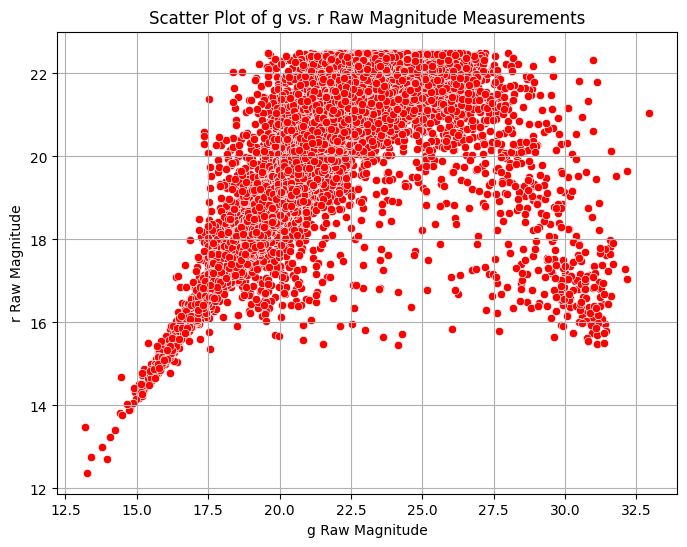

In [10]:
# Scatter plot of Raw Magnitude Measurements: g vs. r
plt.figure(figsize=(8, 6))
sns.scatterplot(x='gRaw', y='rRaw', data=galaxy, color='red')
plt.title('Scatter Plot of g vs. r Raw Magnitude Measurements')
plt.xlabel('g Raw Magnitude')
plt.ylabel('r Raw Magnitude')
plt.grid(True)
plt.show()

### INFERENCE
The scatter plot of raw magnitude measurements (g vs. r) provides insights into the relationship between the brightness of galaxies in two different filters. Here's a detailed interpretation:

1. **x-axis (g Raw Magnitude)**:
   - The x-axis represents the raw magnitude measurements in the g-filter of the electromagnetic spectrum.
   - Each point on the x-axis corresponds to the brightness of a galaxy measured in the g-filter.

2. **y-axis (r Raw Magnitude)**:
   - The y-axis represents the raw magnitude measurements in the r-filter of the electromagnetic spectrum.
   - Each point on the y-axis corresponds to the brightness of a galaxy measured in the r-filter.

3. **Data Points**:
   - Each data point on the scatter plot represents a galaxy from the dataset.
   - The position of the data point indicates the brightness of the galaxy in both the g and r filters.
   - Galaxies with brighter magnitudes in the g-filter will have higher x-coordinate values, while galaxies with brighter magnitudes in the r-filter will have higher y-coordinate values.

4. **Trend or Pattern**:
   - The overall pattern or trend of the data points on the scatter plot reveals the relationship between the brightness of galaxies in the g and r filters.
   - If there's a strong positive correlation between the two filters, the data points will tend to form a diagonal line sloping upwards from left to right.
   - Conversely, if there's a weak or no correlation, the data points will be scattered randomly across the plot.

5. **Interpretation**:
   - A tight cluster of data points along a diagonal line indicates a strong positive correlation between the brightness of galaxies in the g and r filters.
   - A wider dispersion of data points suggests a weaker correlation or the presence of other factors influencing the brightness measurements in each filter.
   - Outliers, i.e., data points that lie far from the main cluster, may indicate unusual or interesting galaxies that require further investigation.

6. **Applications**:
   - This plot is valuable for studying the color properties of galaxies, as the relative brightness in different filters provides information about their spectral energy distributions.
   - It is also useful for identifying potential anomalies or outliers in the dataset that may require attention or follow-up observations.



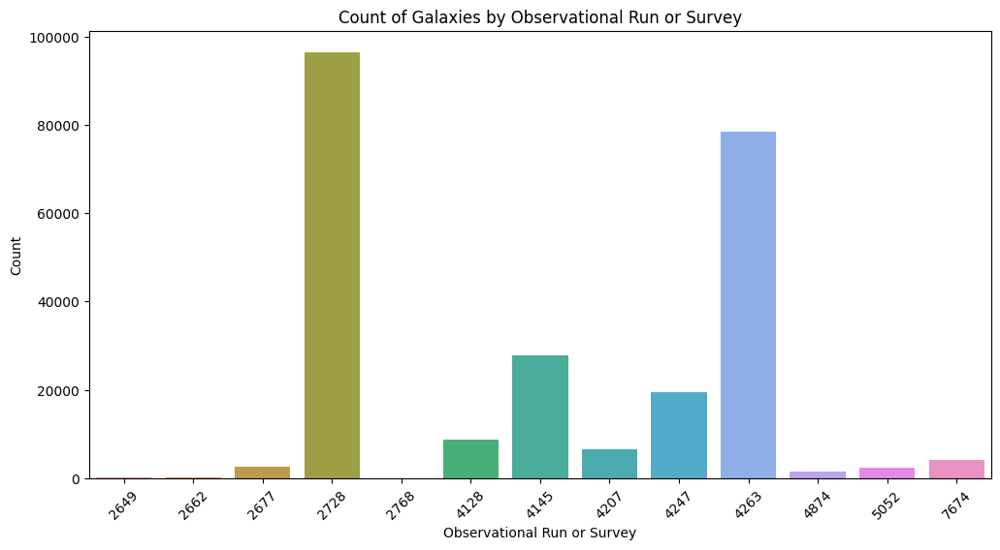

In [22]:
# Count plot of observational runs or surveys
plt.figure(figsize=(12, 6))
sns.countplot(x='run', data=galaxy)
plt.title('Count of Galaxies by Observational Run or Survey')
plt.xlabel('Observational Run or Survey')
plt.ylabel('Count')
plt.xticks(rotation=45)  # Rotate x-axis labels for better readability
plt.show()


### INFERENCE
The count plot of observational runs or surveys provides insights into the distribution of galaxies across different observational runs or surveys. Here's a detailed interpretation:

1. **x-axis (Observational Run or Survey)**:
   - The x-axis represents the observational runs or surveys conducted to collect the galaxy data.
   - Each bar on the x-axis corresponds to a specific observational run or survey.

2. **y-axis (Count)**:
   - The y-axis represents the count of galaxies observed in each observational run or survey.
   - It indicates how many galaxies were recorded during each observational run or survey.

3. **Bars**:
   - Each bar in the plot represents a different observational run or survey.
   - The height of each bar corresponds to the number of galaxies observed in that particular run or survey.

4. **Interpretation**:
   - Bars with higher heights indicate observational runs or surveys that recorded a larger number of galaxies. (2728)
   - Comparing the heights of the bars allows us to identify which observational runs or surveys yielded the most significant number of galaxy observations.
   - Variations in the heights of the bars may suggest differences in the duration, scope, or efficiency of different observational runs or surveys.

5. **Applications**:
   - This plot helps astronomers understand the distribution of galaxy observations across different observational programs or surveys.
   - It assists in assessing the effectiveness of various observational strategies and identifying potential biases in the dataset based on observational runs or surveys.

6. **Rotation of x-axis labels**:
   - The x-axis labels are rotated by 45 degrees for better readability, especially when dealing with long or overlapping labels.
   - Rotating the labels prevents them from overlapping and makes it easier to identify each observational run or survey.

In summary, the count plot of observational runs or surveys provides a visual summary of the distribution of galaxies across different observational programs or surveys, aiding in the analysis and interpretation of astronomical data.

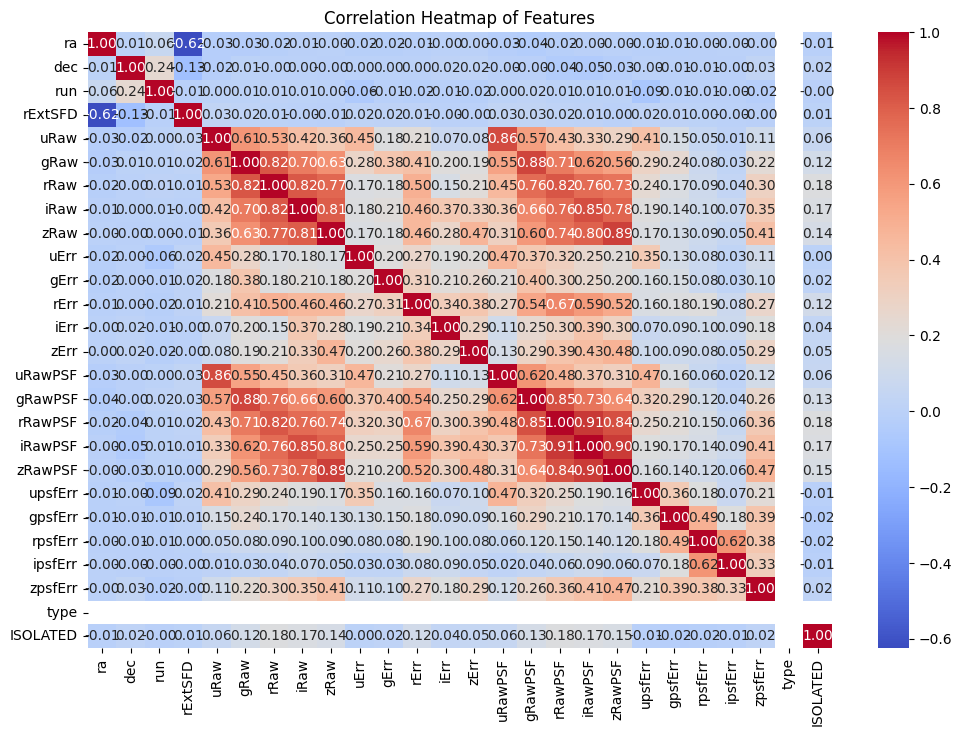

In [24]:
# Heatmap of Correlations between Features
plt.figure(figsize=(12, 8))
corr = galaxy.corr()
sns.heatmap(corr, annot=True, cmap='coolwarm', fmt=".2f")
plt.title('Correlation Heatmap of Features')
plt.show()


### INFERENCE
The heatmap of correlations between features provides insights into the pairwise relationships and strength of correlations among different features in the dataset. Here's a detailed interpretation:

1. **Color Gradient**:
   - The heatmap uses a color gradient to represent the correlation values between pairs of features.
   - Positive correlations are indicated by warmer colors (shades of red), while negative correlations are represented by cooler colors (shades of blue).
   - The intensity of the color reflects the strength of the correlation, with darker shades indicating stronger correlations.

2. **Annotation**:
   - Each cell in the heatmap is annotated with the correlation coefficient value.
   - The correlation coefficient ranges from -1 to 1, where -1 indicates a perfect negative correlation, 1 indicates a perfect positive correlation, and 0 indicates no correlation.
   - The annotation provides a quantitative measure of the correlation strength between each pair of features.

3. **Diagonal Line**:
   - The diagonal line from the top-left to the bottom-right of the heatmap represents the correlation of each feature with itself, which is always 1.0.
   - These values are always equal to 1 because they represent the correlation of a feature with itself, which is perfect.

4. **Interpretation**:
   - Strong positive correlations (close to 1.0) between features suggest that changes in one feature are associated with corresponding changes in the other feature in the same direction.
   - Strong negative correlations (close to -1.0) indicate that changes in one feature are associated with changes in the other feature in the opposite direction.
   - Weak correlations (close to 0.0) suggest little to no linear relationship between the features.
   - Understanding the correlations between features is essential for identifying redundant or highly correlated features and for selecting the most informative features for modeling purposes.

5. **Applications**:
   - The heatmap helps in identifying patterns and relationships between features in the dataset, aiding feature selection and dimensionality reduction.
   - It assists in determining which features may have the most significant impact on the target variable in predictive modeling tasks.

In summary, the heatmap of correlations provides a visual representation of the relationships between features, facilitating exploratory data analysis and informing subsequent modeling decisions.

**Scatter Plots of Raw Magnitudes vs. Extinction Correction Factor**:
   - These scatter plots help us understand the relationship between raw magnitudes in different filters (u, g, z,r,i) and the extinction correction factor (rExtSFD).
   - Each point on the scatter plot represents a galaxy, where the x-axis represents the extinction correction factor, and the y-axis represents the raw magnitude in a specific filter.
   - By examining the scatter plots, we can observe any patterns or trends in how the extinction correction factor varies with raw magnitudes. For example, we might observe if there's a correlation between the extinction correction factor and the brightness of galaxies in certain filters.
these visualizations help us explore the relationships between raw magnitudes and the extinction correction factor, as well as understand the distribution of brightness among galaxies in different filters. They provide valuable insights into the characteristics of the data and can inform further analysis or interpretation.

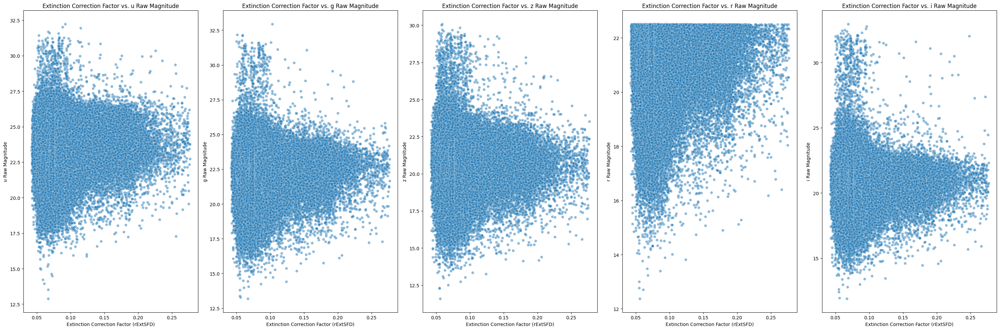

In [36]:
# Scatter Plot of Raw Magnitudes vs. Extinction Correction Factor
plt.figure(figsize=(30, 10))
plt.subplot(1, 5, 1)
sns.scatterplot(x='rExtSFD', y='uRaw', data=galaxy, alpha=0.5)
plt.title('Extinction Correction Factor vs. u Raw Magnitude')
plt.xlabel('Extinction Correction Factor (rExtSFD)')
plt.ylabel('u Raw Magnitude')

plt.subplot(1, 5, 2)
sns.scatterplot(x='rExtSFD', y='gRaw', data=galaxy, alpha=0.5)
plt.title('Extinction Correction Factor vs. g Raw Magnitude')
plt.xlabel('Extinction Correction Factor (rExtSFD)')
plt.ylabel('g Raw Magnitude')

plt.subplot(1, 5, 3)
sns.scatterplot(x='rExtSFD', y='zRaw', data=galaxy, alpha=0.5)
plt.title('Extinction Correction Factor vs. z Raw Magnitude')
plt.xlabel('Extinction Correction Factor (rExtSFD)')
plt.ylabel('z Raw Magnitude')

plt.subplot(1, 5, 4)
sns.scatterplot(x='rExtSFD', y='rRaw', data=galaxy, alpha=0.5)
plt.title('Extinction Correction Factor vs. r Raw Magnitude')
plt.xlabel('Extinction Correction Factor (rExtSFD)')
plt.ylabel('r Raw Magnitude')

plt.subplot(1, 5, 5)
sns.scatterplot(x='rExtSFD', y='iRaw', data=galaxy, alpha=0.5)
plt.title('Extinction Correction Factor vs. i Raw Magnitude')
plt.xlabel('Extinction Correction Factor (rExtSFD)')
plt.ylabel('i Raw Magnitude')

plt.tight_layout()
plt.show()

### INFERENCE
This set of scatter plots depicts the relationship between the extinction correction factor (rExtSFD) and raw magnitudes measured in different filters (u, g, r, i, z) of the electromagnetic spectrum. Here's a breakdown of each subplot:

1. **Extinction Correction Factor vs. u Raw Magnitude**:
   - The first subplot shows the scatter plot of the extinction correction factor (rExtSFD) against the raw magnitude measured in the u-filter.
   - Each data point represents a galaxy, with its position indicating the corresponding values of rExtSFD and uRaw.
   - The plot allows us to observe any trends or patterns in the relationship between the extinction correction factor and u Raw Magnitude.

2. **Extinction Correction Factor vs. g Raw Magnitude**:
   - The second subplot displays the scatter plot of the extinction correction factor (rExtSFD) versus the raw magnitude measured in the g-filter.
   - Similar to the previous subplot, each data point represents a galaxy, and its position reflects the values of rExtSFD and gRaw.
   - This plot enables us to examine the association between the extinction correction factor and g Raw Magnitude.

3. **Extinction Correction Factor vs. z Raw Magnitude**:
   - In the third subplot, the scatter plot illustrates the relationship between the extinction correction factor (rExtSFD) and the raw magnitude measured in the z-filter.
   - Each data point corresponds to a galaxy, with its location indicating the values of rExtSFD and zRaw.
   - This subplot facilitates the investigation of the correlation between the extinction correction factor and z Raw Magnitude.

4. **Extinction Correction Factor vs. r Raw Magnitude**:
   - The fourth subplot exhibits the scatter plot of the extinction correction factor (rExtSFD) against the raw magnitude measured in the r-filter.
   - Similar to the previous subplots, each data point represents a galaxy, and its coordinates represent the values of rExtSFD and rRaw.
   - This plot assists in analyzing the connection between the extinction correction factor and r Raw Magnitude.

5. **Extinction Correction Factor vs. i Raw Magnitude**:
   - Finally, the fifth subplot demonstrates the scatter plot of the extinction correction factor (rExtSFD) versus the raw magnitude measured in the i-filter.
   - Each data point depicts a galaxy, with its position denoting the values of rExtSFD and iRaw.
   - This subplot aids in exploring the correlation between the extinction correction factor and i Raw Magnitude.

Overall, this series of scatter plots provides a comprehensive visualization of the relationship between the extinction correction factor and raw magnitudes across different filters, offering insights into the impact of extinction correction on the observed brightness of galaxies in various spectral bands.

**Distribution Plots of Magnitudes**:
   - These distribution plots show the distribution of raw magnitudes in each filter (u, g, r, i, z).
   - Each histogram represents the frequency distribution of raw magnitudes in a specific filter, with the x-axis representing the raw magnitude and the y-axis representing the frequency of occurrence.
   - By examining the distribution plots, we can gain insights into the brightness distribution of galaxies in different filters. We can observe the central tendency, spread, and shape of the distributions, which can provide information about the overall brightness characteristics of galaxies in each filter.


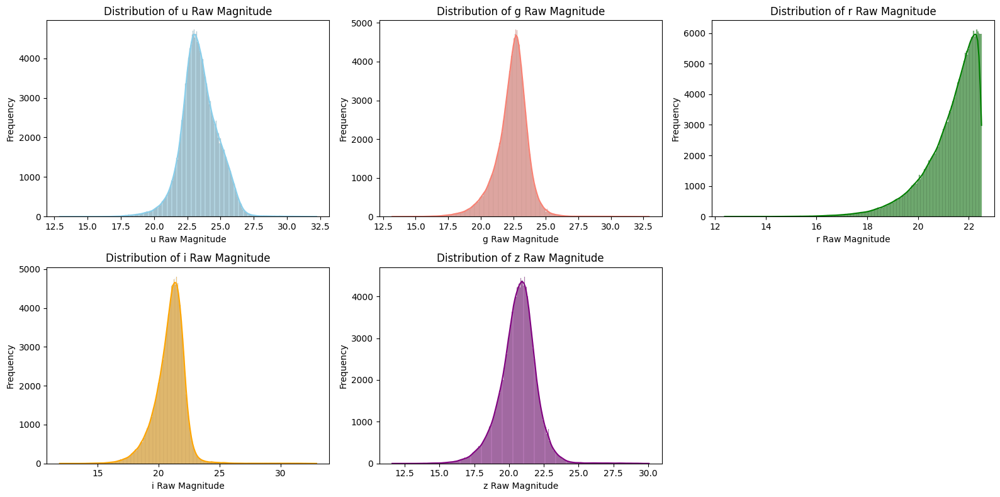

In [37]:
# Distribution of Magnitudes
plt.figure(figsize=(16, 8))

plt.subplot(2, 3, 1)
sns.histplot(galaxy['uRaw'], kde=True, color='skyblue')
plt.title('Distribution of u Raw Magnitude')
plt.xlabel('u Raw Magnitude')
plt.ylabel('Frequency')

plt.subplot(2, 3, 2)
sns.histplot(galaxy['gRaw'], kde=True, color='salmon')
plt.title('Distribution of g Raw Magnitude')
plt.xlabel('g Raw Magnitude')
plt.ylabel('Frequency')

plt.subplot(2, 3, 3)
sns.histplot(galaxy['rRaw'], kde=True, color='green')
plt.title('Distribution of r Raw Magnitude')
plt.xlabel('r Raw Magnitude')
plt.ylabel('Frequency')

plt.subplot(2, 3, 4)
sns.histplot(galaxy['iRaw'], kde=True, color='orange')
plt.title('Distribution of i Raw Magnitude')
plt.xlabel('i Raw Magnitude')
plt.ylabel('Frequency')

plt.subplot(2, 3, 5)
sns.histplot(galaxy['zRaw'], kde=True, color='purple')
plt.title('Distribution of z Raw Magnitude')
plt.xlabel('z Raw Magnitude')
plt.ylabel('Frequency')

plt.tight_layout()
plt.show()

### INFERENCE
These histograms display the distribution of raw magnitudes measured in different filters (u, g, r, i, z) of the electromagnetic spectrum. Here's a breakdown of each subplot:

1. **Distribution of u Raw Magnitude**:
   - The first subplot shows the distribution of raw magnitudes measured in the u-filter.
   - The histogram represents the frequency of galaxies observed at various u Raw Magnitude levels.
   - The density curve (KDE) provides a smooth estimate of the underlying probability density function.

2. **Distribution of g Raw Magnitude**:
   - The second subplot illustrates the distribution of raw magnitudes measured in the g-filter.
   - Similar to the previous subplot, it depicts the frequency of galaxies across different g Raw Magnitude values, along with the density curve.

3. **Distribution of r Raw Magnitude**:
   - The third subplot presents the distribution of raw magnitudes measured in the r-filter.
   - It showcases the frequency distribution of galaxies based on their r Raw Magnitude, accompanied by the density curve.

4. **Distribution of i Raw Magnitude**:
   - In the fourth subplot, the distribution of raw magnitudes measured in the i-filter is depicted.
   - It visualizes the frequency distribution of galaxies at various i Raw Magnitude levels, along with the density curve.

5. **Distribution of z Raw Magnitude**:
   - Lastly, the fifth subplot displays the distribution of raw magnitudes measured in the z-filter.
   - It demonstrates the frequency distribution of galaxies across different z Raw Magnitude values, accompanied by the density curve.

Overall, these histograms provide insights into the brightness distribution of galaxies in each filter, allowing us to observe the variation in raw magnitude values and their respective frequencies. Analyzing these distributions can help astronomers understand the brightness characteristics of galaxies observed in different spectral bands.

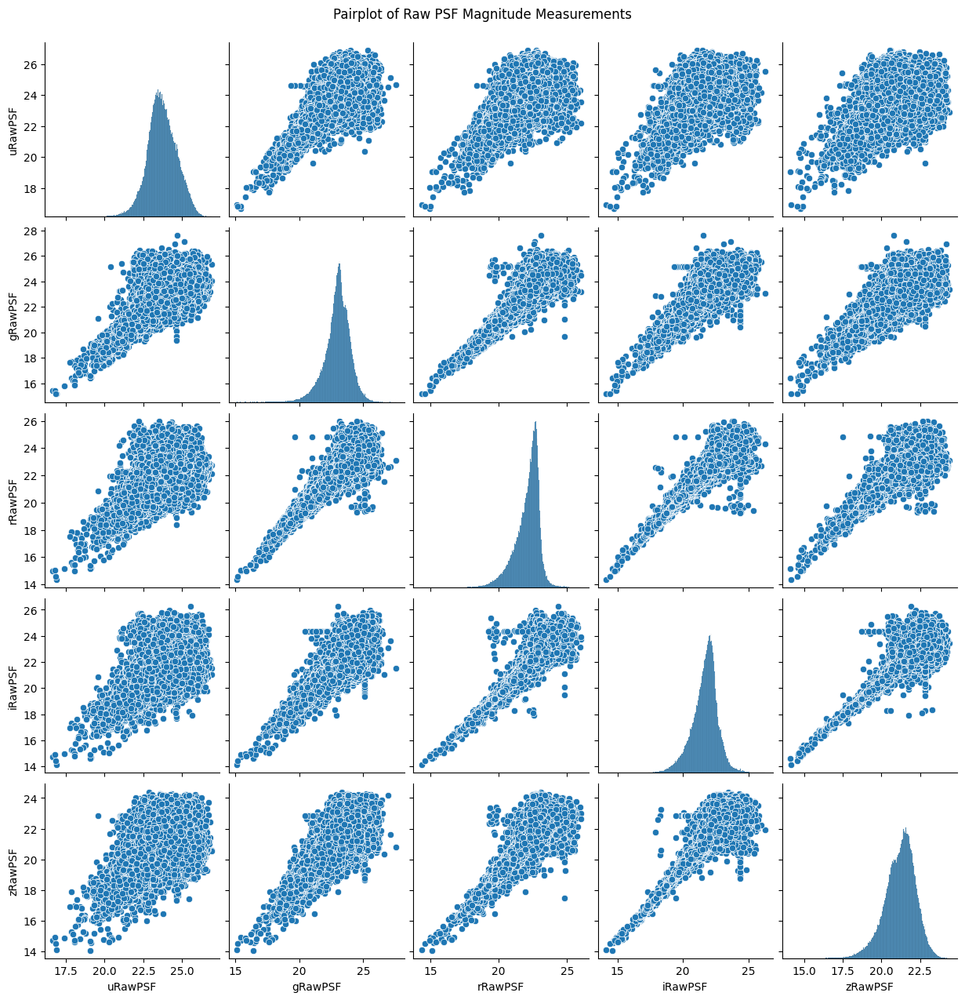

In [21]:
# Pairplot of Raw PSF Magnitude Measurements
sns.pairplot(data=galaxy[['uRawPSF', 'gRawPSF', 'rRawPSF', 'iRawPSF', 'zRawPSF']])
plt.suptitle('Pairplot of Raw PSF Magnitude Measurements', y=1.02)
plt.show()

### INFERENCE
The pairplot of raw PSF (Point Spread Function) magnitude measurements provides a comprehensive visualization of the pairwise relationships between the PSF magnitudes measured in different filters (u, g, r, i, z) of the electromagnetic spectrum. Here's a detailed interpretation of the pairplot:

1. **Diagonal Subplots**:
   - Along the diagonal of the pairplot, histograms or kernel density estimation (KDE) plots are displayed for each PSF magnitude measurement.
   - These diagonal subplots show the distribution of PSF magnitudes in each filter independently, allowing us to examine the spread and shape of the distributions.

2. **Off-diagonal Subplots**:
   - Off-diagonal subplots present scatter plots of PSF magnitudes against each other.
   - Each subplot represents a pairwise comparison between two PSF magnitude measurements.
   - The scatter plots allow us to visualize the relationships and potential correlations between PSF magnitudes in different filters.

3. **Scatter Plot Interpretation**:
   - Positive correlations: If points in the scatter plot exhibit a clear upward trend, it suggests a positive correlation between the two PSF magnitudes. This indicates that as one PSF magnitude increases, the other tends to increase as well. Here we have positive and and complete correlation
   - Negative correlations: Conversely, if points in the scatter plot show a downward trend, it indicates a negative correlation between the two PSF magnitudes. This implies that as one PSF magnitude increases, the other tends to decrease.
   - No correlation: If points in the scatter plot appear randomly distributed with no discernible trend, it suggests little to no correlation between the two PSF magnitudes.

4. **Overall Patterns**:
   - By examining all off-diagonal subplots collectively, we can identify overall patterns and correlations among PSF magnitudes measured in different filters.
   - Consistent trends across multiple scatter plots may indicate systematic relationships between PSF magnitudes across filters.

5. **Title**:
   - The title "Pairplot of Raw PSF Magnitude Measurements" provides a clear indication of the content and purpose of the pairplot.

In summary, the pairplot offers a visual summary of the relationships between raw PSF magnitude measurements in various filters, enabling astronomers to identify correlations and patterns in the data, which can inform further analysis and interpretation.

**Boxplot of Errors for PSF Magnitude Measurements**:
   - This boxplot visualizes the distribution of errors associated with PSF magnitude measurements in each filter.
   - The x-axis represents the filters (u, g, r, i, z), and the y-axis represents the error values.
   - It provides insights into the spread and variability of errors in PSF magnitude measurements across different filters.

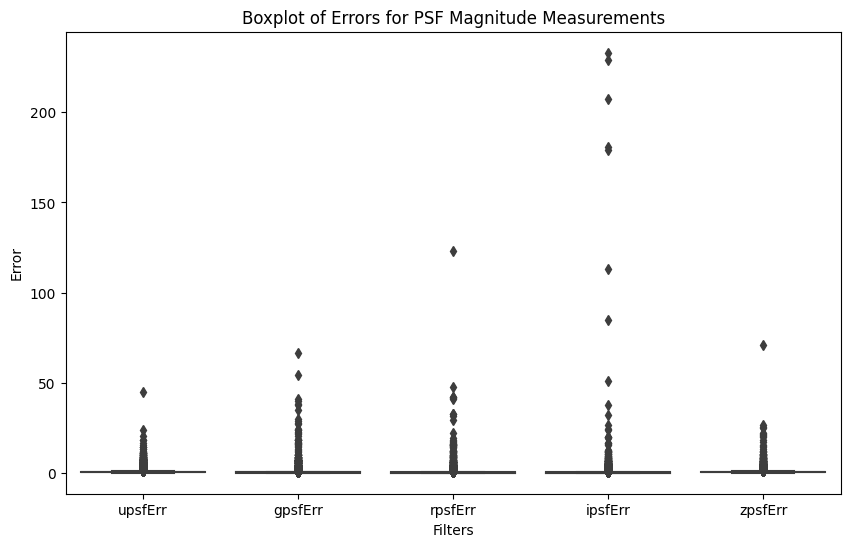

In [55]:
# Boxplot of Errors for PSF Magnitude Measurements
plt.figure(figsize=(10, 6))
sns.boxplot(data=galaxy[['upsfErr', 'gpsfErr', 'rpsfErr', 'ipsfErr', 'zpsfErr']])
plt.title('Boxplot of Errors for PSF Magnitude Measurements')
plt.xlabel('Filters')
plt.ylabel('Error')
plt.show()

## INFERENCE
The boxplot of errors for PSF (Point Spread Function) magnitude measurements provides a visual representation of the distribution of errors associated with PSF magnitudes in different filters (u, g, r, i, z) of the electromagnetic spectrum. Here's an interpretation of the boxplot:

1. **Boxplot Components**:
   - **Box**: The box in each subplot represents the interquartile range (IQR), which contains the middle 50% of the data. The length of the box indicates the spread of the data, while the position of the median line within the box represents the central tendency.
   - **Whiskers**: The whiskers extend from the edges of the box to show the range of the data. By default, the whiskers extend up to 1.5 times the IQR from the edges of the box. Data points beyond the whiskers are considered outliers and are plotted individually.
   - **Outliers**: Individual data points outside the whiskers are plotted as individual points, indicating potential outliers.

2. **Interpretation**:
   - **Error Distribution**: The boxplot visually depicts the distribution of errors for PSF magnitude measurements in each filter.
   - **Variability**: The height of the box (IQR) and the length of the whiskers provide information about the variability of errors across different filters.
   - **Median Error**: The position of the median line within each box gives an estimate of the central tendency of errors for each filter.
   - **Outliers**: Outliers, if present, are indicated by individual data points beyond the whiskers and may warrant further investigation.

3. **Comparison Across Filters**:
   - By comparing the boxplots across different filters, astronomers can assess the variability and distribution of errors in PSF magnitude measurements.
   - Differences in the spread, median, and presence of outliers between filters may indicate variations in the accuracy or precision of measurements across filters.

4. **Title and Axes**:
   - The title "Boxplot of Errors for PSF Magnitude Measurements" clearly describes the content of the plot.
   - The x-axis represents the filters (u, g, r, i, z), while the y-axis represents the error associated with PSF magnitude measurements.

Overall, the boxplot provides a concise summary of the distribution of errors for PSF magnitude measurements, aiding astronomers in assessing the reliability and consistency of measurements across different filters.

 ### Isolated or not
    scatter plot where galaxies are plotted based on their RA and DEC coordinates, and each point is colored according to whether it is isolated or not

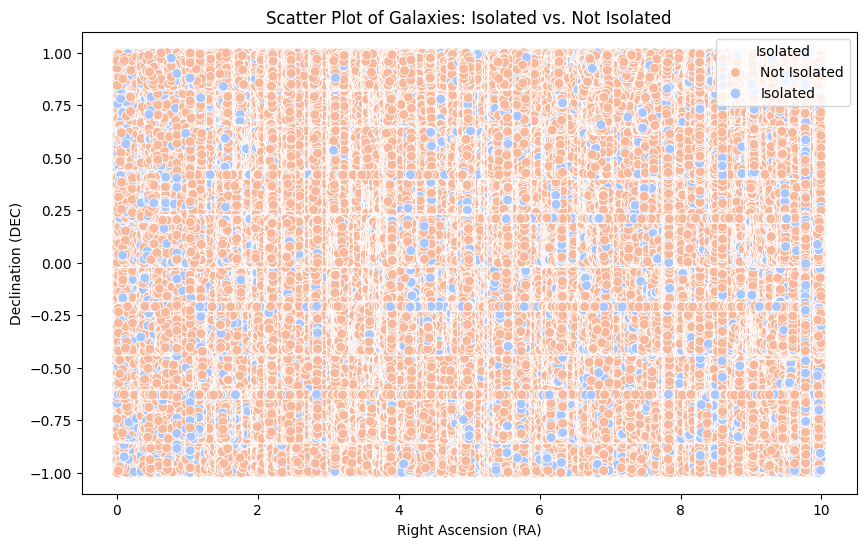

In [7]:
# Assuming your dataframe is named 'galaxies_df'
plt.figure(figsize=(10, 6))
sns.scatterplot(x='ra', y='dec', hue='ISOLATED', data=galaxy, palette='coolwarm', s=50)
plt.title('Scatter Plot of Galaxies: Isolated vs. Not Isolated')
plt.xlabel('Right Ascension (RA)')
plt.ylabel('Declination (DEC)')
plt.legend(title='Isolated', loc='upper right', labels=['Not Isolated', 'Isolated'])
plt.show()


### INFERENCE
The scatter plot visualizes the distribution of galaxies in the celestial sphere, with the x-axis representing the Right Ascension (RA) and the y-axis representing the Declination (DEC). Here's an interpretation of the plot:

1. **Data Distribution**:
   - Each point in the scatter plot represents a galaxy, with its position determined by its RA and DEC coordinates.
   - The distribution of galaxies across the plot provides insights into their spatial distribution in the sky.

2. **Color Encoding**:
   - Galaxies are color-coded based on whether they are classified as isolated or not.
   - The 'coolwarm' color palette is used, where galaxies classified as isolated are typically represented by one color (e.g., blue), while galaxies classified as not isolated are represented by another color (e.g., red).
   - This color encoding allows for easy visual differentiation between isolated and non-isolated galaxies.

3. **Legend**:
   - The legend positioned in the upper right corner indicates the color mapping for isolated and non-isolated galaxies.
   - It provides a clear key for interpreting the colors used in the plot, with labels indicating 'Not Isolated' and 'Isolated'.

4. **Interpretation**:
   - By observing the spatial distribution of galaxies in the plot, astronomers can discern any clustering or patterns based on their isolation status.
   - Differences in the spatial distribution of isolated and non-isolated galaxies may indicate variations in their environments or formation processes.

5. **Title and Axes**:
   - The title "Scatter Plot of Galaxies: Isolated vs. Not Isolated" succinctly describes the content of the plot.
   - The x-axis label "Right Ascension (RA)" and the y-axis label "Declination (DEC)" provide context for the celestial coordinates represented in the plot.

Overall, the scatter plot effectively visualizes the spatial distribution of galaxies based on their isolation status, facilitating exploration and analysis of their clustering and environmental characteristics in the celestial sphere.

### Density of Galaies in magnitude space
rRaw (raw r-band magnitude) and iRaw (raw i-band magnitude) columns, which represent brightness measurements in different filters. We'll visualize the density of galaxies in this magnitude space, with different contours representing different density levels.

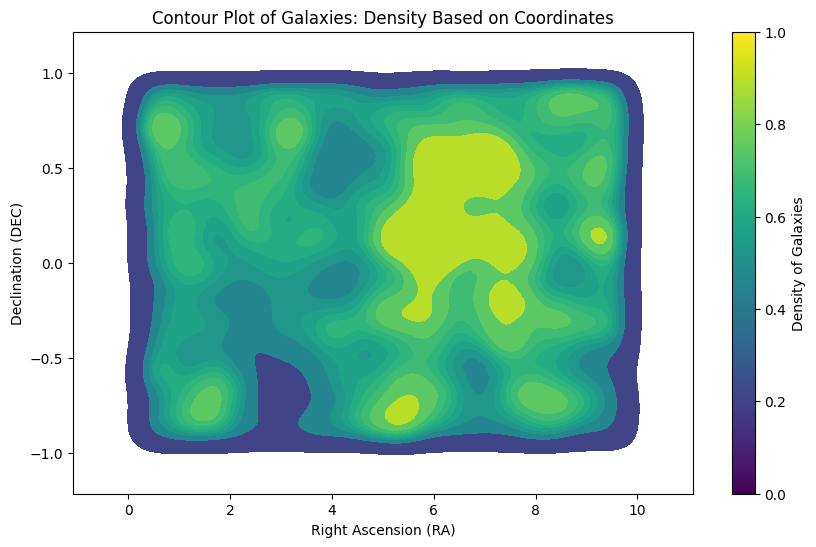

In [8]:
plt.figure(figsize=(10, 6))
contour = sns.kdeplot(x='ra', y='dec', data=galaxy, fill=True, cmap='viridis', levels=10)
plt.title('Contour Plot of Galaxies: Density Based on Coordinates')
plt.xlabel('Right Ascension (RA)')
plt.ylabel('Declination (DEC)')
# Add color bar using the contour set
cb = plt.colorbar(contour.collections[0], label='Density')
cb.set_label('Density of Galaxies')
plt.show()


### INFERENCE
The contour plot visualizes the density distribution of galaxies in the celestial sphere, with the x-axis representing the Right Ascension (RA) and the y-axis representing the Declination (DEC). Here's an interpretation of the plot:

1. **Density Representation**:
   - The contour lines represent regions of equal galaxy density in the plot.
   - Areas with denser concentrations of galaxies are depicted by darker shades or thicker contour lines, while regions with lower galaxy density are represented by lighter shades or thinner contour lines.

2. **Color Map**:
   - The 'viridis' colormap is used to encode the density levels, where darker colors indicate higher galaxy density and lighter colors represent lower density.
   - This colormap ensures perceptually uniform shading, facilitating accurate interpretation of the density variations across the plot.

3. **Density Levels**:
   - The contour lines are drawn at specific density levels, with the number of levels determined by the parameter 'levels=10'.
   - Each contour line corresponds to a particular density threshold, with higher levels indicating denser regions of galaxies.

4. **Color Bar**:
   - A color bar is added to the plot to provide a visual reference for interpreting the density levels represented by the colormap.
   - The color bar displays the range of densities encoded by the colormap, with labels indicating the density values.

5. **Title and Axes**:
   - The title "Contour Plot of Galaxies: Density Based on Coordinates" describes the content of the plot, highlighting that the density distribution is based on the spatial coordinates (RA and DEC) of galaxies.
   - The x-axis label "Right Ascension (RA)" and the y-axis label "Declination (DEC)" provide context for the celestial coordinates represented in the plot.

Overall, the contour plot offers a visually informative representation of the spatial density distribution of galaxies, allowing astronomers to identify regions of high and low galaxy density across the celestial sphere.

### Brightness Pair plot
This type of plot allows us to visualize pairwise relationships between different brightness features (e.g., uRaw, gRaw, rRaw, iRaw, zRaw) in a grid of subplots.

<Figure size 1200x1000 with 0 Axes>

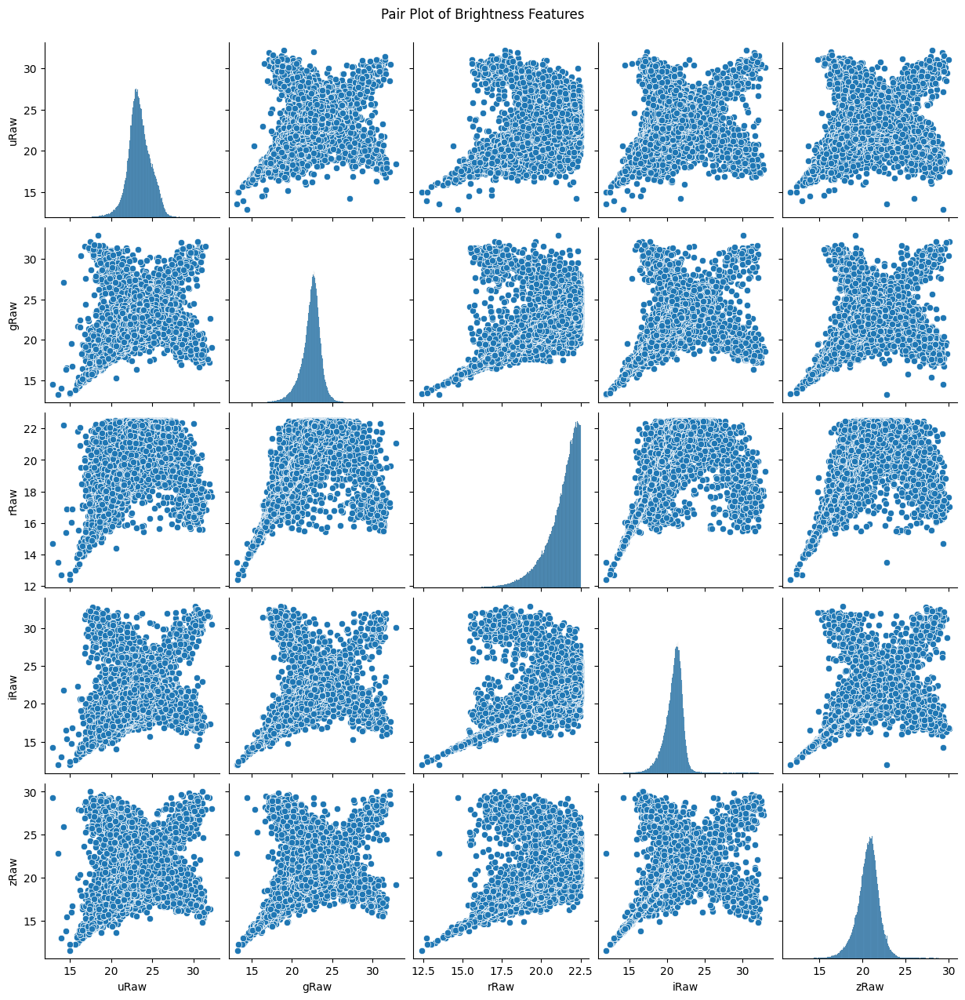

In [9]:

# Selecting relevant brightness features
brightness_features = ['uRaw', 'gRaw', 'rRaw', 'iRaw', 'zRaw']

# Creating a pair plot
plt.figure(figsize=(12, 10))
sns.pairplot(galaxy[brightness_features])
plt.suptitle('Pair Plot of Brightness Features', y=1.02)
plt.show()


### INFERENCE
The pair plot visualizes pairwise relationships between the selected brightness features ('uRaw', 'gRaw', 'rRaw', 'iRaw', 'zRaw') in the dataset. Here's an interpretation of the plot:

1. **Diagonal Plots**:
   - The diagonal plots display the distribution of each brightness feature along the diagonal of the pair plot.
   - These histograms or kernel density estimation (KDE) plots show the univariate distribution of each feature.

2. **Off-diagonal Plots**:
   - The off-diagonal plots show the pairwise relationships between brightness features.
   - Each scatter plot illustrates how the brightness of one feature (on the x-axis) correlates with the brightness of another feature (on the y-axis).

3. **Correlation**:
   - Patterns in the scatter plots reveal the degree and direction of correlation between brightness features.
   - Positive correlation: If points in the scatter plot form a roughly upward-sloping pattern, it indicates a positive correlation between the two features.
   - Negative correlation: Conversely, a downward-sloping pattern suggests a negative correlation between the features.
   - No correlation: If points appear randomly scattered, it suggests little to no correlation between the features.

4. **Main Diagonal**:
   - The main diagonal of the pair plot consists of histograms or KDE plots of each brightness feature.
   - These plots provide insights into the distribution and spread of brightness values for each feature individually.

5. **Title**:
   - The title "Pair Plot of Brightness Features" describes the content of the plot, highlighting that it focuses on the relationships between brightness measurements.

Overall, the pair plot is a valuable tool for exploratory data analysis, enabling astronomers to quickly assess the relationships and distributions of brightness features in the dataset. It helps identify potential correlations and patterns, guiding further investigation and analysis.

1. **Pairwise Scatter Plot Matrix**:
   - This part of the code creates a matrix of scatter plots showing pairwise relationships between the PSF magnitude measurements (`uRawPSF`, `gRawPSF`, `rRawPSF`, `iRawPSF`, `zRawPSF`) and their corresponding errors (`upsfErr`, `gpsfErr`, `rpsfErr`, `ipsfErr`, `zpsfErr`). Each scatter plot in the matrix represents the relationship between two variables.

2. **Error vs. Magnitude Scatter Plot**:
   - This part of the code creates four scatter plots, each showing the relationship between a PSF magnitude measurement and its corresponding error for one filter (`u`, `g`, `r`, `i`). For example, the first subplot (`uRawPSF` vs. `upsfErr`) shows how the error in the `u`-band magnitude measurement (`upsfErr`) varies with the `u`-band PSF magnitude (`uRawPSF`). Similarly, other subplots depict similar relationships for other filters.

3. **Error Distribution Histograms**:
   - This part of the code creates histograms to visualize the distribution of errors (`upsfErr`, `gpsfErr`, `rpsfErr`, `ipsfErr`, `zpsfErr`) for each filter (`u`, `g`, `r`, `i`, `z`). Each subplot represents the histogram of errors for a specific filter. For example, the first subplot (`Histogram of upsfErr`) shows the distribution of errors (`upsfErr`) in the `u`-band magnitude measurements.

These plots help in understanding the relationships between PSF magnitude measurements and their errors, as well as the distribution of errors across different filters. They provide insights into the quality and reliability of the magnitude measurements in your dataset.

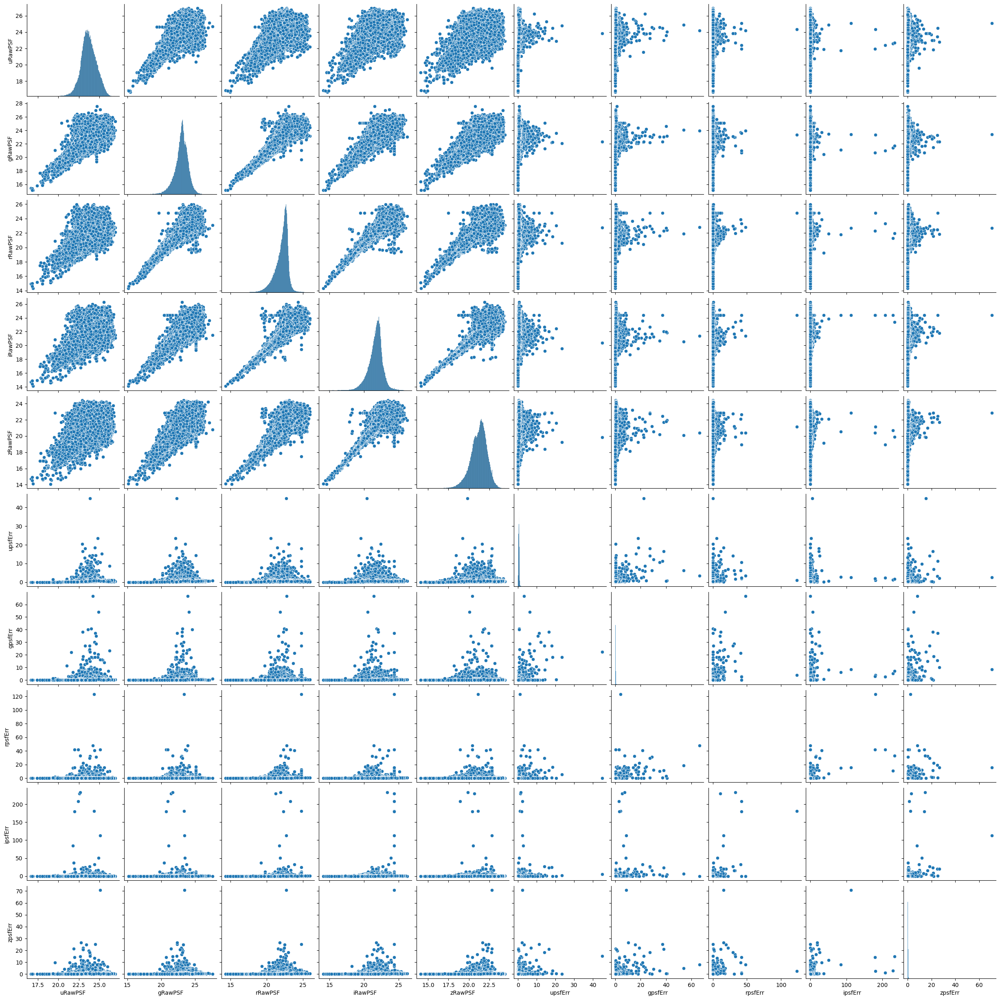

In [10]:
# Pairwise Scatter Plot Matrix
sns.pairplot(galaxy[['uRawPSF', 'gRawPSF', 'rRawPSF', 'iRawPSF', 'zRawPSF', 'upsfErr', 'gpsfErr', 'rpsfErr', 'ipsfErr', 'zpsfErr']])

### INFERENCE
The pairwise scatter plot matrix visualizes the relationships between the selected features in the dataset, including raw PSF magnitudes ('uRawPSF', 'gRawPSF', 'rRawPSF', 'iRawPSF', 'zRawPSF') and their associated errors ('upsfErr', 'gpsfErr', 'rpsfErr', 'ipsfErr', 'zpsfErr'). Here's an interpretation of the plot:

1. **Scatter Plots**:
   - Each cell in the matrix represents a scatter plot between two features.
   - The scatter plots illustrate how the values of one feature (on the x-axis) relate to the values of another feature (on the y-axis).

2. **Diagonal Plots**:
   - Along the diagonal of the matrix, histograms or kernel density estimation (KDE) plots are displayed for each feature.
   - These plots show the univariate distribution of each feature, providing insights into their spread and variability.

3. **Correlation**:
   - Patterns in the scatter plots reveal the degree and direction of correlation between features.
   - Positive correlation: If points in the scatter plot form a roughly upward-sloping pattern, it indicates a positive correlation between the two features.
   - Negative correlation: Conversely, a downward-sloping pattern suggests a negative correlation between the features.
   - No correlation: If points appear randomly scattered, it suggests little to no correlation between the features.

4. **Main Diagonal**:
   - The main diagonal of the matrix consists of histograms or KDE plots of each feature.
   - These plots provide insights into the distribution and spread of feature values for each variable individually.

5. **Title**:
   - As there's no explicit title provided, the content of the plot is described by the data being visualized: a pairwise scatter plot matrix of the selected features.

Overall, the pairwise scatter plot matrix is a comprehensive visualization tool that allows astronomers to examine the relationships between multiple features simultaneously, aiding in exploratory data analysis and pattern recognition.

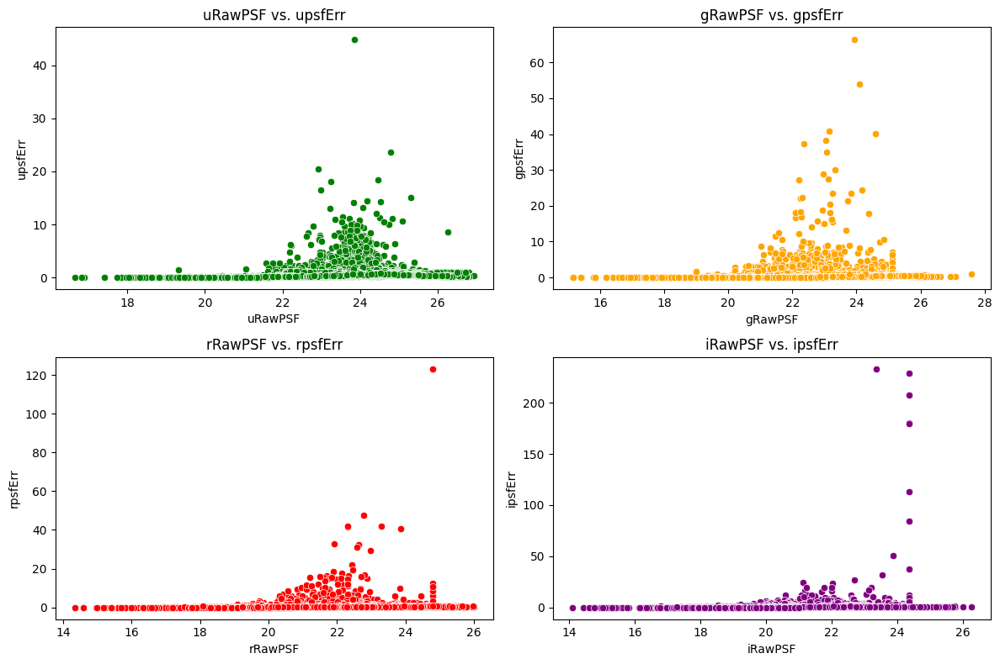

In [11]:
# Error vs. Magnitude Scatter Plot
plt.figure(figsize=(12, 8))
plt.subplot(2, 2, 1)
sns.scatterplot(x='uRawPSF', y='upsfErr', data=galaxy, color='green')
plt.xlabel('uRawPSF')
plt.ylabel('upsfErr')
plt.title('uRawPSF vs. upsfErr')
plt.subplot(2, 2, 2)
sns.scatterplot(x='gRawPSF', y='gpsfErr', data=galaxy, color='orange')
plt.xlabel('gRawPSF')
plt.ylabel('gpsfErr')
plt.title('gRawPSF vs. gpsfErr')

plt.subplot(2, 2, 3)
sns.scatterplot(x='rRawPSF', y='rpsfErr', data=galaxy, color='red')
plt.xlabel('rRawPSF')
plt.ylabel('rpsfErr')
plt.title('rRawPSF vs. rpsfErr')

plt.subplot(2, 2, 4)
sns.scatterplot(x='iRawPSF', y='ipsfErr', data=galaxy, color='purple')
plt.xlabel('iRawPSF')
plt.ylabel('ipsfErr')
plt.title('iRawPSF vs. ipsfErr')

plt.tight_layout()
plt.show()

### INFERENCE
The scatter plots above visualize the relationship between raw PSF magnitudes and their associated errors for different filters (u, g, r, i). Here's an interpretation of each plot:

1. **uRawPSF vs. upsfErr**:
   - The scatter plot shows the relationship between the raw PSF magnitude in the u-filter ('uRawPSF') and the associated error ('upsfErr').
   - Each point represents a galaxy, with its position indicating the magnitude and error values.
   - The plot helps assess the variability or uncertainty in the u-filter magnitude measurements.

2. **gRawPSF vs. gpsfErr**:
   - This plot depicts the relationship between the raw PSF magnitude in the g-filter ('gRawPSF') and its associated error ('gpsfErr').
   - Similar to the previous plot, each point represents a galaxy, allowing astronomers to examine the magnitude and error values in the g-filter.

3. **rRawPSF vs. rpsfErr**:
   - The scatter plot illustrates the relationship between the raw PSF magnitude in the r-filter ('rRawPSF') and its associated error ('rpsfErr').
   - By analyzing the distribution of points, astronomers can evaluate the consistency and reliability of r-filter magnitude measurements.

4. **iRawPSF vs. ipsfErr**:
   - This plot shows the relationship between the raw PSF magnitude in the i-filter ('iRawPSF') and its associated error ('ipsfErr').
   - Understanding the relationship between magnitude and error in the i-filter is crucial for assessing the quality of photometric measurements in that band.

Overall, these scatter plots provide insights into the uncertainties associated with PSF magnitude measurements in different filters, aiding astronomers in evaluating the reliability and accuracy of photometric data.

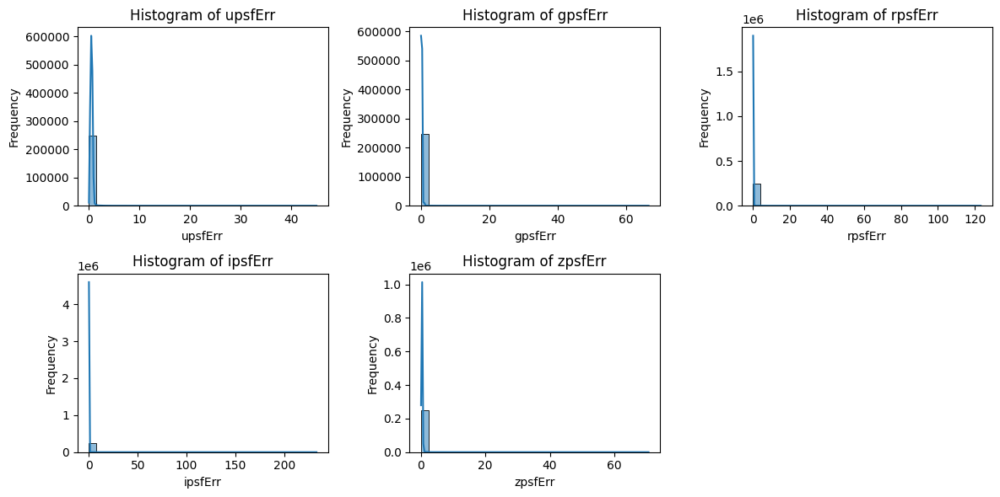

In [12]:
# Error Distribution Histograms
plt.figure(figsize=(12, 6))
plt.subplot(2, 3, 1)
sns.histplot(data=galaxy, x='upsfErr', bins=30, kde=True)
plt.xlabel('upsfErr')
plt.ylabel('Frequency')
plt.title('Histogram of upsfErr')

plt.subplot(2, 3, 2)
sns.histplot(data=galaxy, x='gpsfErr', bins=30, kde=True)
plt.xlabel('gpsfErr')
plt.ylabel('Frequency')
plt.title('Histogram of gpsfErr')

plt.subplot(2, 3, 3)
sns.histplot(data=galaxy, x='rpsfErr', bins=30, kde=True)
plt.xlabel('rpsfErr')
plt.ylabel('Frequency')
plt.title('Histogram of rpsfErr')

plt.subplot(2, 3, 4)
sns.histplot(data=galaxy, x='ipsfErr', bins=30, kde=True)
plt.xlabel('ipsfErr')
plt.ylabel('Frequency')
plt.title('Histogram of ipsfErr')

plt.subplot(2, 3, 5)
sns.histplot(data=galaxy, x='zpsfErr', bins=30, kde=True)
plt.xlabel('zpsfErr')
plt.ylabel('Frequency')
plt.title('Histogram of zpsfErr')

plt.tight_layout()
plt.show()

### INFERENCE
The histograms above illustrate the distribution of errors associated with PSF magnitude measurements in different filters (u, g, r, i, z). Here's an interpretation of each histogram:

1. **Histogram of upsfErr**:
   - This histogram displays the distribution of errors ('upsfErr') associated with PSF magnitude measurements in the u-filter.
   - The x-axis represents the range of error values, while the y-axis indicates the frequency or count of galaxies with errors falling within each bin.
   - The distribution provides insights into the variability and spread of errors in u-filter magnitude measurements.

2. **Histogram of gpsfErr**:
   - Similarly, this histogram shows the distribution of errors ('gpsfErr') for PSF magnitude measurements in the g-filter.
   - Astronomers can analyze the shape and spread of the distribution to assess the accuracy and precision of g-filter magnitude measurements.

3. **Histogram of rpsfErr**:
   - This histogram depicts the distribution of errors ('rpsfErr') associated with PSF magnitude measurements in the r-filter.
   - Examining the histogram helps astronomers understand the typical range and variability of errors in r-filter magnitude measurements.

4. **Histogram of ipsfErr**:
   - The histogram presents the distribution of errors ('ipsfErr') for PSF magnitude measurements in the i-filter.
   - Understanding the distribution aids in evaluating the reliability and consistency of i-filter magnitude measurements.

5. **Histogram of zpsfErr**:
   - Lastly, this histogram illustrates the distribution of errors ('zpsfErr') for PSF magnitude measurements in the z-filter.
   - Analyzing the distribution assists astronomers in assessing the quality and precision of z-filter magnitude measurements.

Overall, these histograms provide valuable insights into the characteristics and variability of errors associated with PSF magnitude measurements across different filters, facilitating the evaluation and interpretation of photometric data.

### Galaxy visualization based on u-g and g-r

The mathematical concept behind this graph involves calculating the color indices for each galaxy and then plotting these indices on a color-color diagram. Here's the mathematical breakdown:

1. **Color Indices Calculation**:
   - For each galaxy, we calculate two color indices:
     - \( (u-g) \): The difference in PSF magnitude between the ultraviolet (u) and green (g) filters.
     - \( (g-r) \): The difference in PSF magnitude between the green (g) and red (r) filters.
   - These color indices represent the relative brightness of galaxies at different wavelengths.

2. **Scatter Plot**:
   - The x-axis of the plot represents the \( (u-g) \) color index, and the y-axis represents the \( (g-r) \) color index.
   - Each point on the plot corresponds to a galaxy in the dataset.
   - The position of the point indicates the color of the galaxy in the \( (u-g) \) versus \( (g-r) \) color space.

3. **Color Differentiation based on Isolation**:
   - We differentiate the colors of points on the plot based on whether the galaxies are classified as isolated or not.
   - Each unique status (isolated or not) is assigned a distinct color from the colormap.
   - This differentiation helps visually identify any trends or differences in the color-color diagram between isolated and non-isolated galaxies.

Overall, the color-color diagram provides insights into the distribution of galaxies in color space, allowing for analysis of their spectral properties and potential correlations with other variables such as isolation status.

## ADDING ESSENTIAL MAGNITUDE FEATURES

In [40]:
galaxy['u_minus_g'] = galaxy['uRawPSF'] - galaxy['gRawPSF']
galaxy['g_minus_r'] = galaxy['gRawPSF'] - galaxy['rRawPSF']
galaxy['r_minus_i'] = galaxy['rRawPSF'] - galaxy['iRawPSF']
galaxy['i_minus_z'] = galaxy['iRawPSF'] - galaxy['zRawPSF']

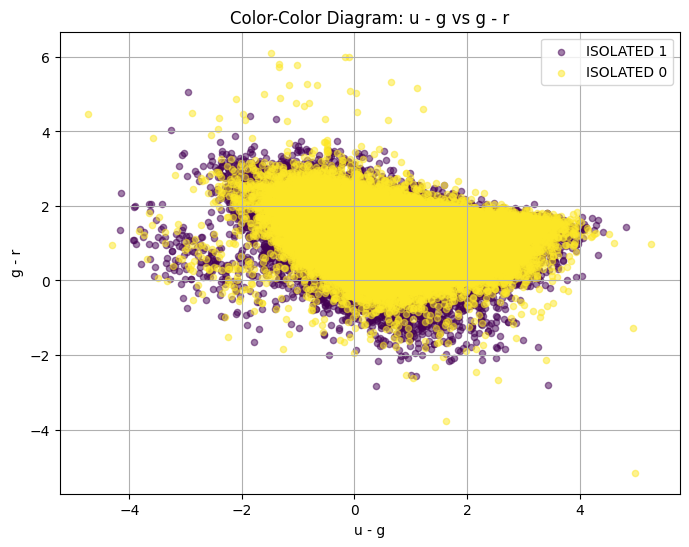

In [43]:
# Compute (u-g) and (g-r)
# galaxy['u_minus_g'] = galaxy['u_minus_g']
# galaxy['g_minus_r'] = galaxy['g_minus_r']

# Create the plot
# Define a color map
num_types = len(galaxy['ISOLATED'].unique())
cmap = plt.cm.get_cmap('viridis', num_types)

# Create the plot with different colors for each type of galaxy
plt.figure(figsize=(8, 6))
for i, galaxy_type in enumerate(galaxy['ISOLATED'].unique()):
    type_data = galaxy[galaxy['ISOLATED'] == galaxy_type]
    plt.scatter(type_data['u_minus_g'], type_data['g_minus_r'], s=20, alpha=0.5, label=f'ISOLATED {galaxy_type}', color=cmap(i))
plt.xlabel('u - g')
plt.ylabel('g - r')
plt.title('Color-Color Diagram: u - g vs g - r')
plt.grid(True)
plt.legend()
plt.show()



### INFERENCE
In the scatter plot above, each point represents a galaxy, and its position on the plot is determined by its (u-g) color index on the x-axis and its (g-r) color index on the y-axis. Here's an interpretation of the plot:

- **Color Indices**: The color indices (u-g) and (g-r) are calculated by subtracting the magnitudes of different filters. They provide information about the colors of galaxies, which can be indicative of their properties such as temperature, age, and chemical composition.

- **Axes Interpretation**:
  - The x-axis represents the (u-g) color index, which measures the difference in brightness between the ultraviolet (u) and green (g) filters.
  - The y-axis represents the (g-r) color index, which measures the difference in brightness between the green (g) and red (r) filters.

- **Galaxy Types**:
  - Each point is colored based on the value of the 'ISOLATED' column, which likely denotes whether the galaxy is classified as isolated or not.
  - The color variation helps distinguish between different types of galaxies based on their isolation status.

- **Trends and Patterns**:
  - By observing the distribution of points, astronomers can identify any trends or patterns in the color-color diagram.
  - Certain regions of the plot may be more densely populated, indicating common color combinations among galaxies.
  
- **Interpretation**:
  - The plot helps astronomers understand the relationships between different color indices and how they correlate with galaxy properties.
  - Patterns in the plot can provide insights into the stellar populations, dust content, and evolutionary stages of galaxies.
  
- **Legend**:
  - The legend indicates the colors corresponding to isolated and non-isolated galaxies, allowing for easy identification of different galaxy types.

Overall, the color-color diagram provides a visual representation of the distribution of galaxies based on their color indices, aiding astronomers in studying their physical properties and evolutionary processes.

## EDA ON STAR DATA

## DATA DESCRIPTION
1. **ra (Right Ascension)**:
   - Right Ascension is a celestial coordinate similar to longitude on Earth, measured in degrees.
   - It represents the angular distance of a celestial object eastward along the celestial equator from the vernal equinox to the hour circle passing through the object.

2. **dec (Declination)**:
   - Declination is another celestial coordinate, akin to latitude on Earth, measured in degrees.
   - It indicates how far north or south a celestial object is from the celestial equator.

3. **run**:
   - This column might represent some identifier or code associated with observational runs or surveys.
   - It could indicate the specific observational run or survey from which the data was obtained.

4. **rExtSFD (Extinction Correction Factor)**:
   - Extinction correction factor for the r-band magnitude measurements.
   - It is used to correct for the dimming effect of interstellar dust.

5. **uRaw, gRaw, rRaw, iRaw, zRaw**:
   - These columns represent raw magnitude measurements in different filters (u, g, r, i, z) of the electromagnetic spectrum.
   - Magnitude is a measure of the brightness of celestial objects.

6. **uErr, gErr, rErr, iErr, zErr**:
   - These columns represent the errors or uncertainties associated with the corresponding magnitude measurements in each filter.
   - They indicate the uncertainty in the measured magnitude values.

7. **uRawPSF, gRawPSF, rRawPSF, iRawPSF, zRawPSF**:
   - These columns represent raw PSF (Point Spread Function) magnitude measurements in different filters.
   - PSF magnitudes are measurements that have been corrected for the blurring effects of the telescope's optics.

8. **upsfErr, gpsfErr, rpsfErr, ipsfErr, zpsfErr**:
   - These columns represent the errors or uncertainties associated with the corresponding PSF magnitude measurements in each filter.
   - They indicate the uncertainty in the PSF magnitude values.

9. **type**:
   - This column might represent some classification or categorical type associated with the stars, possibly indicating their spectral type or other characteristics.

10. **ISOLATED**:
    - This column indicates whether the star is isolated or not, possibly based on its proximity to other celestial objects.

These features provide information about the celestial coordinates, brightness measurements, errors, and other characteristics of the stars in your dataset. They can be used for analysis, classification, or further exploration of stellar properties. Let me know if you need further explanation or assistance!

In [ ]:
star.head()

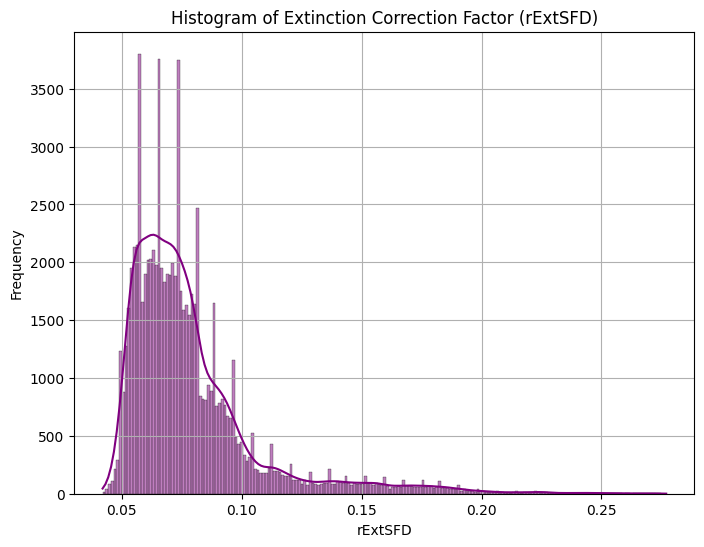

In [44]:
# Histogram of Extinction Correction Factor (rExtSFD)
plt.figure(figsize=(8, 6))
sns.histplot(star['rExtSFD'], kde=True, color='purple')
plt.title('Histogram of Extinction Correction Factor (rExtSFD)')
plt.xlabel('rExtSFD')
plt.ylabel('Frequency')
plt.grid(True)
plt.show()

### INFERENCE
The histogram above represents the distribution of the extinction correction factor (rExtSFD) for the star data. Here's an interpretation:

- **Extinction Correction Factor (rExtSFD)**: 
  - The extinction correction factor is a measure used to correct for the dimming effect of interstellar dust on astronomical observations. 
  - In this context, rExtSFD specifically refers to the correction factor applied to the r-band magnitude measurements.
  
- **Histogram**:
  - The histogram displays the frequency distribution of the rExtSFD values.
  - Each bar represents a range of rExtSFD values, and the height of the bar indicates the frequency (or count) of stars falling within that range.

- **Interpretation**:
  - The shape of the histogram provides insights into the distribution of extinction correction factors among the stars.
  - Peaks or clusters in the histogram may indicate regions of higher or lower occurrence of certain extinction correction values.
  - The spread of the distribution can reveal the range and variability of extinction correction factors present in the star data.

- **Kernel Density Estimation (KDE)**:
  - The KDE curve overlaid on the histogram provides a smoothed estimate of the underlying probability density function of the rExtSFD values.
  - It offers a continuous representation of the distribution and helps visualize the overall shape and central tendencies of the data.

- **Purple Color**:
  - The histogram bars are colored in purple for better visibility and aesthetic appeal.

Overall, the histogram of extinction correction factors allows astronomers to assess the prevalence and variability of interstellar dust extinction affecting star observations, providing valuable information for correcting and interpreting astronomical data.

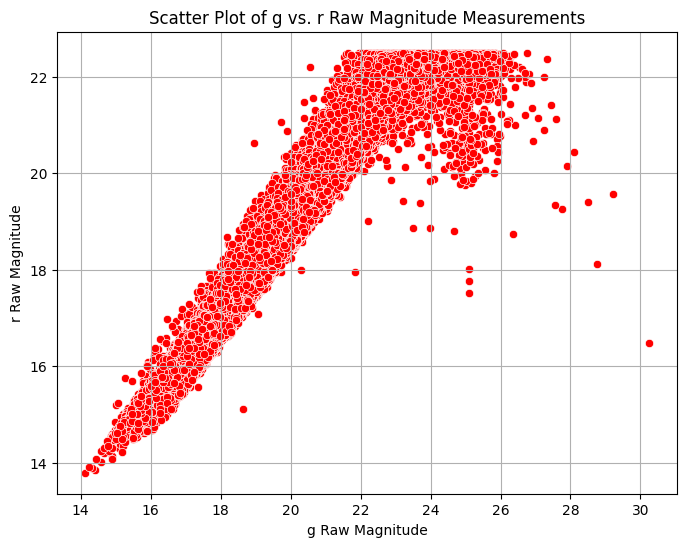

In [45]:
# Scatter plot of Raw Magnitude Measurements: g vs. r
plt.figure(figsize=(8, 6))
sns.scatterplot(x='gRaw', y='rRaw', data=star, color='red')
plt.title('Scatter Plot of g vs. r Raw Magnitude Measurements')
plt.xlabel('g Raw Magnitude')
plt.ylabel('r Raw Magnitude')
plt.grid(True)
plt.show()

### INFERENCE
The scatter plot above illustrates the relationship between the raw magnitude measurements in the g-band (x-axis) and the r-band (y-axis) for the star data. Here's an interpretation:

- **Raw Magnitude Measurements**:
  - Magnitude is a measure of the brightness of celestial objects, with lower values indicating brighter objects.
  - In this context, 'g Raw Magnitude' represents the raw magnitude measurement in the g-band, while 'r Raw Magnitude' represents the raw magnitude measurement in the r-band.

- **Scatter Plot**:
  - Each point on the plot represents a star in the dataset, with its position determined by its raw magnitude measurements in the g-band and r-band.
  - The x-coordinate of each point corresponds to the raw magnitude measurement in the g-band, while the y-coordinate corresponds to the raw magnitude measurement in the r-band.

- **Trend**:
  - The general trend observed in the plot indicates a positive correlation between the raw magnitude measurements in the g-band and the r-band.
  - As the raw magnitude in the g-band increases (moving towards the right along the x-axis), the raw magnitude in the r-band also tends to increase (moving upwards along the y-axis).
  - This positive correlation suggests that stars with higher brightness in the g-band also tend to have higher brightness in the r-band, and vice versa.

- **Red Color**:
  - The points in the scatter plot are colored red for better visibility and distinction from other elements in the plot.

- **Grid Lines**:
  - Grid lines are added to the plot to assist in reading and interpreting the data accurately.

Overall, the scatter plot provides a visual depiction of the relationship between raw magnitude measurements in the g-band and the r-band for stars, offering insights into their relative brightness in these specific filters.

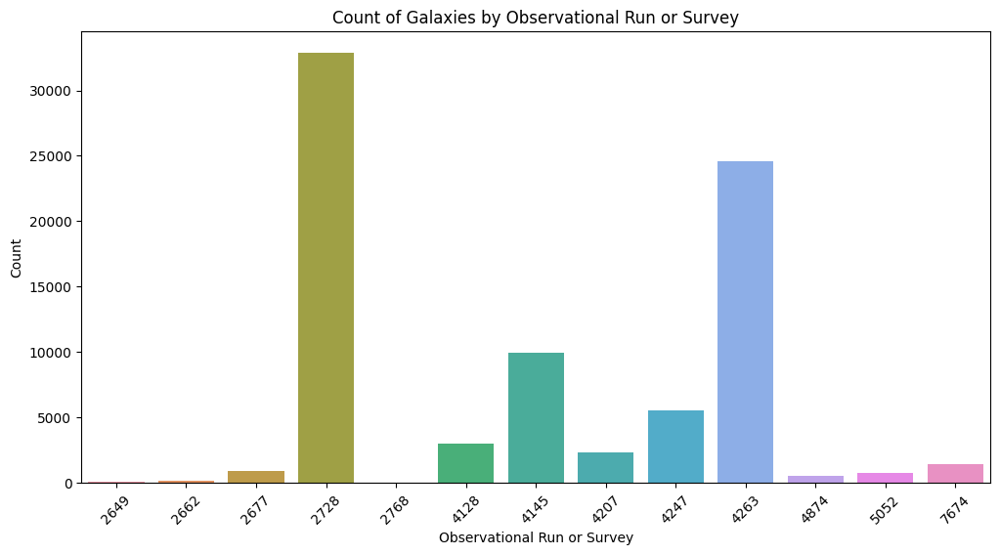

In [46]:
# Count plot of observational runs or surveys
plt.figure(figsize=(12, 6))
sns.countplot(x='run', data=star)
plt.title('Count of Galaxies by Observational Run or Survey')
plt.xlabel('Observational Run or Survey')
plt.ylabel('Count')
plt.xticks(rotation=45)  # Rotate x-axis labels for better readability
plt.show()


### INFERENCE
The count plot above visualizes the distribution of stars based on different observational runs or surveys. Here's an interpretation:

- **Observational Runs or Surveys**:
  - The x-axis of the plot represents the observational runs or surveys conducted to gather the star data.
  - Each bar on the plot corresponds to a specific observational run or survey, showing the number of stars observed during that run.

- **Count**:
  - The height of each bar indicates the count or frequency of stars observed in the respective observational run or survey.
  - Higher bars represent runs with a larger number of observed stars, while shorter bars indicate fewer observed stars.

- **Observational Run Labels**:
  - The x-axis labels display the names or identifiers of the observational runs or surveys.
  - These labels provide information about the different data collection efforts or campaigns undertaken to acquire the star data.

- **Rotation**:
  - To enhance readability, the x-axis labels are rotated by 45 degrees. This prevents overlapping labels and ensures that they are legible.

- **Title and Axes**:
  - The plot is appropriately titled as "Count of Stars by Observational Run or Survey" to convey its purpose.
  - The x-axis is labeled as "Observational Run or Survey," while the y-axis is labeled as "Count."

The count plot enables easy comparison of the distribution of stars across different observational runs or surveys, facilitating insights into data collection efforts and the availability of observations from various sources.

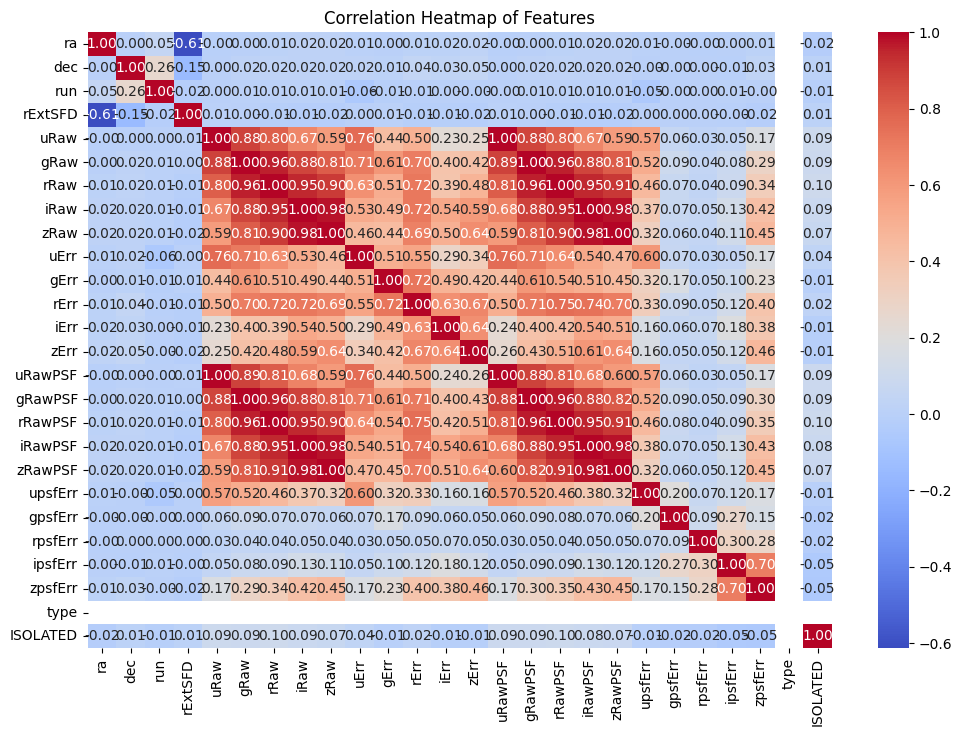

In [47]:
# Heatmap of Correlations between Features
plt.figure(figsize=(12, 8))
corr = star.corr()
sns.heatmap(corr, annot=True, cmap='coolwarm', fmt=".2f")
plt.title('Correlation Heatmap of Features')
plt.show()


### INFERENCE
The heatmap above illustrates the correlations between different features in the star dataset. Here's an interpretation:

- **Color Gradient**:
  - The heatmap employs a color gradient to represent the correlation coefficients between pairs of features.
  - Positive correlations are depicted in warmer colors (shades of red), while negative correlations are shown in cooler colors (shades of blue).
  - The intensity of the color reflects the strength of the correlation, with darker shades indicating stronger correlations.

- **Annotation**:
  - Each cell in the heatmap is annotated with the correlation coefficient value.
  - The correlation coefficient ranges from -1 to 1, where -1 indicates a perfect negative correlation, 1 indicates a perfect positive correlation, and 0 indicates no correlation.
  - Annotations provide a quantitative measure of the strength and direction of the correlation between each pair of features.

- **Diagonal Line**:
  - The diagonal line from the top-left to the bottom-right of the heatmap represents the correlation of each feature with itself, which is always 1.0.
  - These values are always equal to 1 because they represent the correlation of a feature with itself, which is perfect.

- **Interpretation**:
  - Strong positive correlations (close to 1.0) between features suggest that changes in one feature are associated with corresponding changes in the other feature in the same direction.
  - Strong negative correlations (close to -1.0) indicate that changes in one feature are associated with changes in the other feature in the opposite direction.
  - Weak correlations (close to 0.0) suggest little to no linear relationship between the features.
  - Understanding the correlations between features is essential for identifying redundant or highly correlated features and for selecting the most informative features for modeling purposes.

- **Applications**:
  - The heatmap assists in identifying patterns and relationships between features in the dataset, aiding feature selection and dimensionality reduction.
  - It helps in determining which features may have the most significant impact on the target variable in predictive modeling tasks.

In summary, the heatmap provides a visual summary of the correlations between features in the star dataset, allowing for exploratory data analysis and informing subsequent modeling decisions.

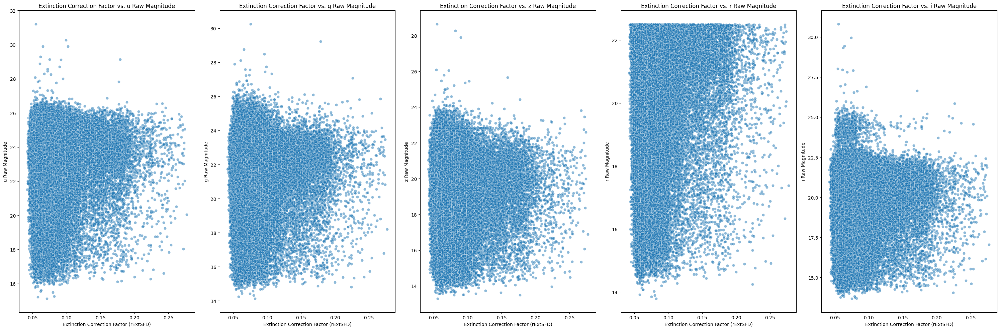

In [48]:
# Scatter Plot of Raw Magnitudes vs. Extinction Correction Factor
plt.figure(figsize=(30, 10))
plt.subplot(1, 5, 1)
sns.scatterplot(x='rExtSFD', y='uRaw', data=star, alpha=0.5)
plt.title('Extinction Correction Factor vs. u Raw Magnitude')
plt.xlabel('Extinction Correction Factor (rExtSFD)')
plt.ylabel('u Raw Magnitude')

plt.subplot(1, 5, 2)
sns.scatterplot(x='rExtSFD', y='gRaw', data=star, alpha=0.5)
plt.title('Extinction Correction Factor vs. g Raw Magnitude')
plt.xlabel('Extinction Correction Factor (rExtSFD)')
plt.ylabel('g Raw Magnitude')

plt.subplot(1, 5, 3)
sns.scatterplot(x='rExtSFD', y='zRaw', data=star, alpha=0.5)
plt.title('Extinction Correction Factor vs. z Raw Magnitude')
plt.xlabel('Extinction Correction Factor (rExtSFD)')
plt.ylabel('z Raw Magnitude')

plt.subplot(1, 5, 4)
sns.scatterplot(x='rExtSFD', y='rRaw', data=star, alpha=0.5)
plt.title('Extinction Correction Factor vs. r Raw Magnitude')
plt.xlabel('Extinction Correction Factor (rExtSFD)')
plt.ylabel('r Raw Magnitude')

plt.subplot(1, 5, 5)
sns.scatterplot(x='rExtSFD', y='iRaw', data=star, alpha=0.5)
plt.title('Extinction Correction Factor vs. i Raw Magnitude')
plt.xlabel('Extinction Correction Factor (rExtSFD)')
plt.ylabel('i Raw Magnitude')

plt.tight_layout()
plt.show()

### INFERECE
The scatter plots above depict the relationship between raw magnitudes and the extinction correction factor (rExtSFD) for different filters (u, g, r, i, z). Here's an interpretation of each plot:

1. **Extinction Correction Factor vs. u Raw Magnitude**:
   - This plot illustrates how the extinction correction factor (rExtSFD) varies concerning the u-band raw magnitude.
   - Each point represents a star, with the x-coordinate indicating the extinction correction factor and the y-coordinate representing the u-band raw magnitude.
   - The scatter points show the distribution of stars across different values of the extinction correction factor and u-band raw magnitude.

2. **Extinction Correction Factor vs. g Raw Magnitude**:
   - Similar to the first plot, but it shows the relationship between the extinction correction factor and the g-band raw magnitude.
   - Each point represents a star, and the scatter pattern reveals the distribution of stars concerning the g-band raw magnitude and extinction correction factor.

3. **Extinction Correction Factor vs. z Raw Magnitude**:
   - This plot displays the relationship between the extinction correction factor and the z-band raw magnitude.
   - Each point represents a star, and the scatter pattern illustrates how the extinction correction factor varies concerning the z-band raw magnitude.

4. **Extinction Correction Factor vs. r Raw Magnitude**:
   - Similar to the previous plots, but it shows the relationship between the extinction correction factor and the r-band raw magnitude.
   - Each point represents a star, and the scatter points demonstrate the distribution of stars across different values of the extinction correction factor and r-band raw magnitude.

5. **Extinction Correction Factor vs. i Raw Magnitude**:
   - This plot illustrates the relationship between the extinction correction factor and the i-band raw magnitude.
   - Each point represents a star, and the scatter pattern reveals how the extinction correction factor varies concerning the i-band raw magnitude.

Overall, these scatter plots provide insights into how the extinction correction factor relates to the raw magnitudes in different filters, aiding in the understanding of how the correction factor impacts the observed magnitudes of stars.

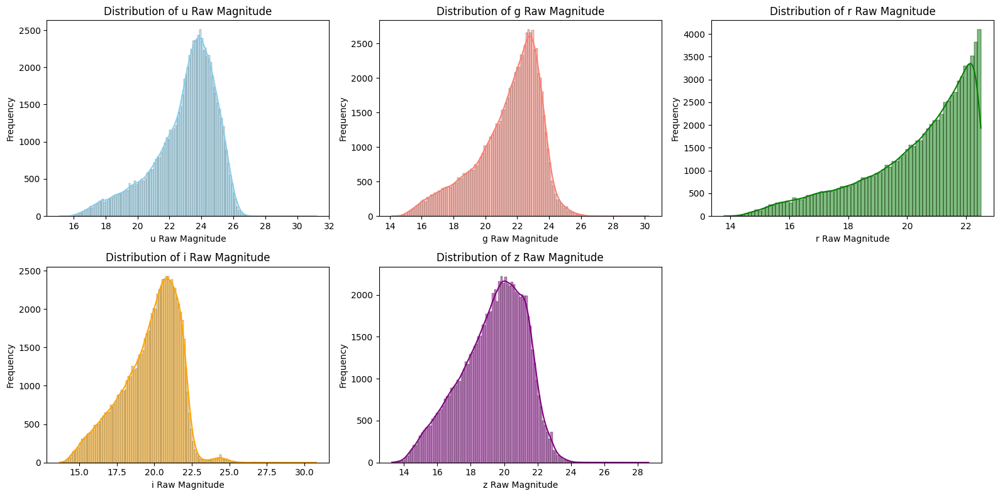

In [49]:
# Distribution of Magnitudes
plt.figure(figsize=(16, 8))

plt.subplot(2, 3, 1)
sns.histplot(star['uRaw'], kde=True, color='skyblue')
plt.title('Distribution of u Raw Magnitude')
plt.xlabel('u Raw Magnitude')
plt.ylabel('Frequency')

plt.subplot(2, 3, 2)
sns.histplot(star['gRaw'], kde=True, color='salmon')
plt.title('Distribution of g Raw Magnitude')
plt.xlabel('g Raw Magnitude')
plt.ylabel('Frequency')

plt.subplot(2, 3, 3)
sns.histplot(star['rRaw'], kde=True, color='green')
plt.title('Distribution of r Raw Magnitude')
plt.xlabel('r Raw Magnitude')
plt.ylabel('Frequency')

plt.subplot(2, 3, 4)
sns.histplot(star['iRaw'], kde=True, color='orange')
plt.title('Distribution of i Raw Magnitude')
plt.xlabel('i Raw Magnitude')
plt.ylabel('Frequency')

plt.subplot(2, 3, 5)
sns.histplot(star['zRaw'], kde=True, color='purple')
plt.title('Distribution of z Raw Magnitude')
plt.xlabel('z Raw Magnitude')
plt.ylabel('Frequency')

plt.tight_layout()
plt.show()

### INFERENCE
These histograms display the distribution of raw magnitudes for stars in different filters (u, g, r, i, z). Here's an interpretation of each plot:

1. **Distribution of u Raw Magnitude**:
   - The histogram illustrates the distribution of u-band raw magnitudes among stars.
   - The x-axis represents the u-band raw magnitude values, while the y-axis represents the frequency or count of stars.
   - The shape of the histogram indicates the spread of u-band raw magnitudes, with peaks and valleys reflecting the density of stars at different magnitude levels.

2. **Distribution of g Raw Magnitude**:
   - Similar to the previous plot, but it shows the distribution of g-band raw magnitudes.
   - The histogram reveals the spread of g-band raw magnitudes among stars and provides insights into the brightness distribution in the g-band filter.

3. **Distribution of r Raw Magnitude**:
   - This histogram illustrates the distribution of r-band raw magnitudes among stars.
   - The shape of the histogram indicates the density of stars across different r-band raw magnitude levels.

4. **Distribution of i Raw Magnitude**:
   - Similar to the previous plots, but it shows the distribution of i-band raw magnitudes.
   - The histogram provides insights into the distribution of i-band raw magnitudes among stars and helps understand the brightness distribution in the i-band filter.

5. **Distribution of z Raw Magnitude**:
   - This histogram displays the distribution of z-band raw magnitudes among stars.
   - The histogram shape reflects the spread of z-band raw magnitudes and provides information about the brightness distribution in the z-band filter.

Overall, these histograms offer a visual representation of the distribution of raw magnitudes across different filters, aiding in understanding the brightness characteristics of stars in each filter.

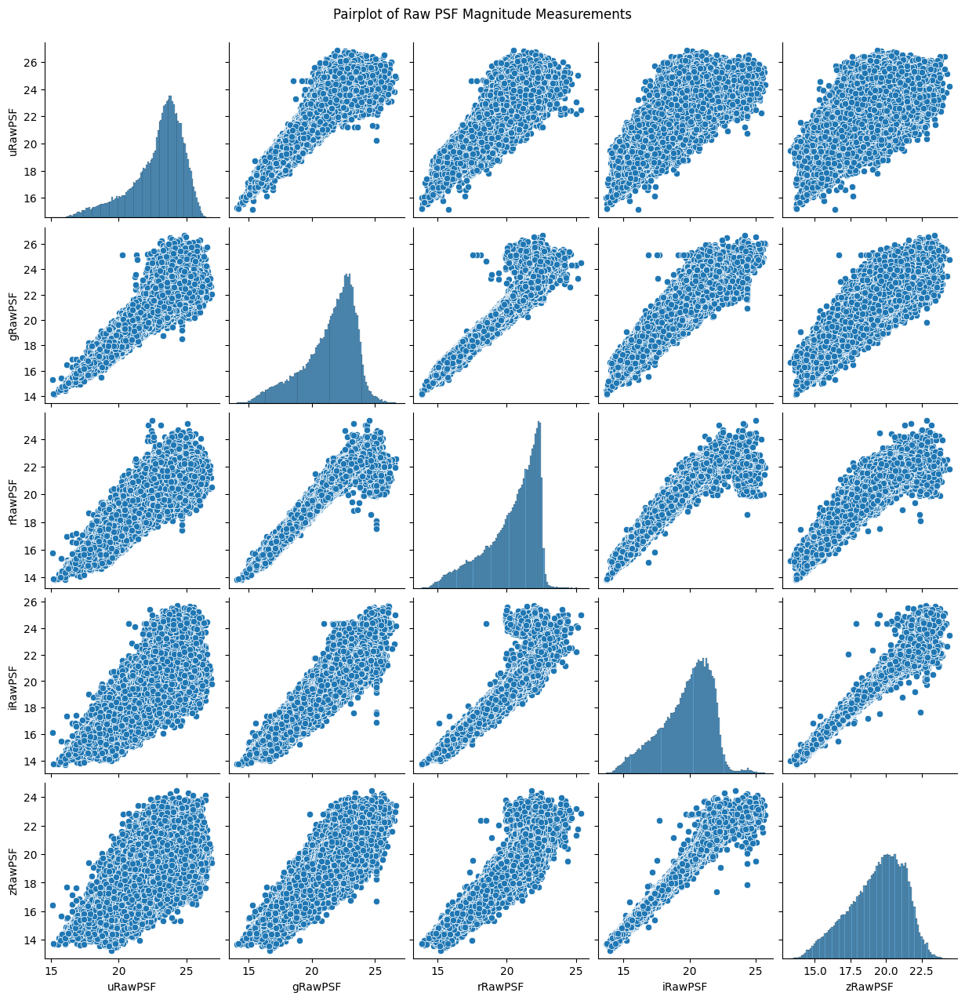

In [50]:
# Pairplot of Raw PSF Magnitude Measurements
sns.pairplot(data=star[['uRawPSF', 'gRawPSF', 'rRawPSF', 'iRawPSF', 'zRawPSF']])
plt.suptitle('Pairplot of Raw PSF Magnitude Measurements', y=1.02)
plt.show()

### INTERFACE
Visualize the relationships between raw PSF (Point Spread Function) magnitude measurements across different filters (u, g, r, i, z).

Here's a detailed interpretation of what this pairplot can reveal:

1. **Pairwise Relationships**: Each scatterplot in the pairplot matrix shows the relationship between two variables (raw PSF magnitudes in this case). For example, the scatterplot in the (uRawPSF, gRawPSF) cell shows how the u-band raw PSF magnitude relates to the g-band raw PSF magnitude.

2. **Diagonal Plots**: The diagonal of the pairplot matrix contains histograms of each individual variable. These histograms show the distribution of raw PSF magnitudes for each filter. They provide insights into the range and distribution of values for each filter.

3. **Correlation**: The scatterplots off the diagonal show the correlation between different filters' raw PSF magnitudes. If two variables have a strong positive correlation, points in the scatterplot will tend to follow a linear pattern sloping upwards. If the correlation is negative, the points will slope downwards. A lack of correlation would result in a scattered or random distribution of points.

4. **Outliers**: Outliers, if present, can be identified in the scatterplots. These are data points that significantly deviate from the overall pattern of the data and may represent errors or unusual observations.

5. **Overall Patterns**: By examining the pairplot as a whole, you can gain insights into any overall patterns or trends in the raw PSF magnitude measurements across different filters. For example, you might observe consistent shifts or differences between filters, or you might see clusters of data points suggesting different populations or groups within the dataset.

By interpreting the pairplot, you can gain a better understanding of the relationships and distributions of raw PSF magnitude measurements across different filters, which can be valuable for further analysis and interpretation of the data.

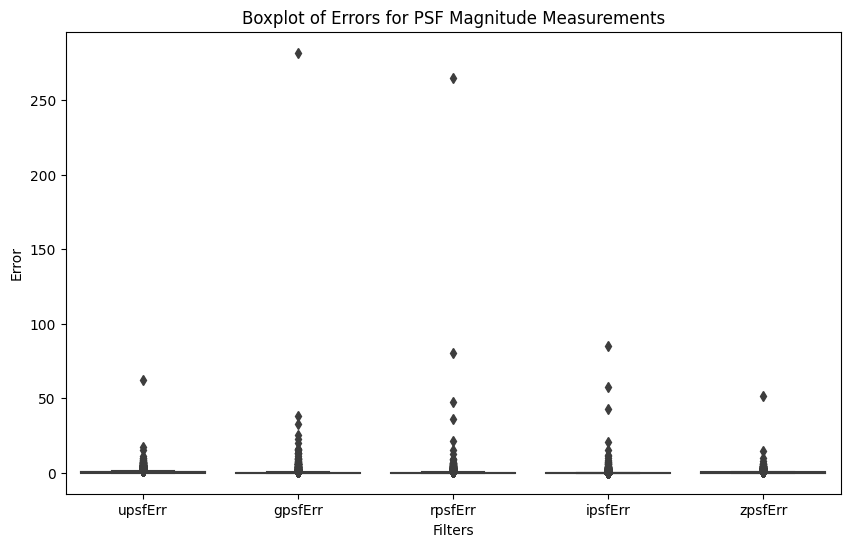

In [51]:
# Boxplot of Errors for PSF Magnitude Measurements
plt.figure(figsize=(10, 6))
sns.boxplot(data=star[['upsfErr', 'gpsfErr', 'rpsfErr', 'ipsfErr', 'zpsfErr']])
plt.title('Boxplot of Errors for PSF Magnitude Measurements')
plt.xlabel('Filters')
plt.ylabel('Error')
plt.show()

### INFERENCE
Visualize the distribution of errors for PSF (Point Spread Function) magnitude measurements across different filters (u, g, r, i, z).

Here's a breakdown of what this boxplot can convey:

1. **Boxplot Representation**: Each box in the plot represents the interquartile range (IQR) of the error distribution for a specific filter. The line inside the box represents the median error value.

2. **Whiskers**: The whiskers extend from the box to show the range of the data, excluding outliers. By default, Seaborn's boxplot extends the whiskers to 1.5 times the IQR from the first and third quartiles.

3. **Outliers**: Data points that fall outside the whiskers are considered outliers and are typically shown as individual points. These outliers can indicate unusual or extreme error values for specific filters.

4. **Comparison between Filters**: By comparing the boxes across different filters, you can assess if there are any significant differences in the distribution of errors. For example, wider or narrower boxes may indicate higher or lower variability in errors for certain filters.

5. **Central Tendency and Spread**: The median line and the width of the box provide insights into the central tendency and spread of errors for each filter. A wider box or a larger spread of data points suggests higher variability in errors.

6. **Overall Error Distribution**: The boxplot provides an overview of the distribution of errors for PSF magnitude measurements across all filters, allowing you to identify any consistent patterns or trends.

By examining this boxplot, you can gain insights into the variability and distribution of errors in PSF magnitude measurements for different filters, which can be valuable for understanding the quality and reliability of the measurements and for identifying any potential issues or discrepancies in the data.

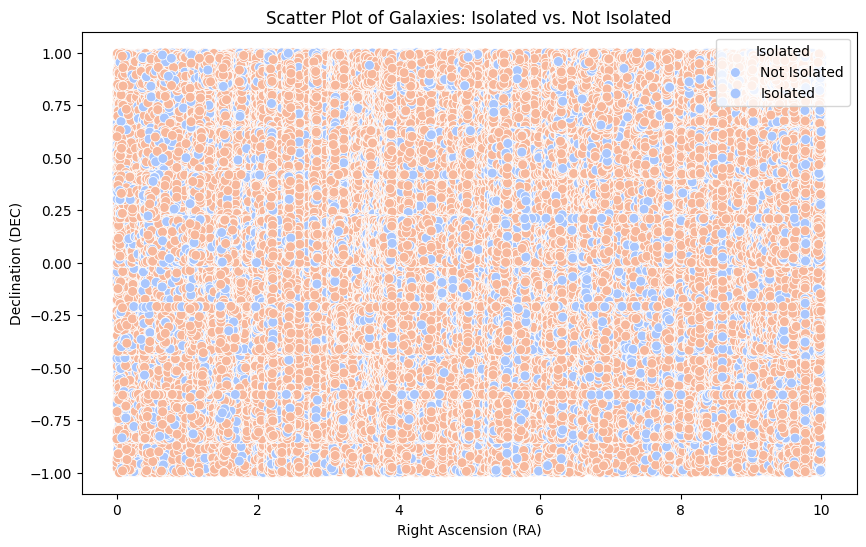

In [56]:
# Assuming your dataframe is named 'galaxies_df'
plt.figure(figsize=(10, 6))
sns.scatterplot(x='ra', y='dec', hue='ISOLATED', data=star, palette='coolwarm', s=50)
plt.title('Scatter Plot of Galaxies: Isolated vs. Not Isolated')
plt.xlabel('Right Ascension (RA)')
plt.ylabel('Declination (DEC)')
plt.legend(title='Isolated', loc='upper right', labels=['Not Isolated', 'Isolated'])
plt.show()


### INFERENCE
Visualize the distribution of galaxies based on their Right Ascension (RA) and Declination (DEC), with points colored based on whether they are isolated or not.

Here's a breakdown of the plot and its components:

1. **Scatter Plot**: Each point on the plot represents a galaxy, with its position determined by its RA (x-axis) and DEC (y-axis). This allows for the spatial distribution of galaxies to be visualized.

2. **Color Encoding**: The points are colored based on the 'ISOLATED' column of the DataFrame. Galaxies labeled as 'Isolated' and 'Not Isolated' are assigned different colors, with the 'coolwarm' palette being used here. This helps to visually distinguish between isolated and non-isolated galaxies.

3. **Marker Size**: The 's=50' parameter sets the size of the markers representing galaxies. In this case, all markers are set to the same size (50).

4. **Title and Axes Labels**: The title of the plot ('Scatter Plot of Galaxies: Isolated vs. Not Isolated') describes the content of the plot. The x-axis label ('Right Ascension (RA)') and y-axis label ('Declination (DEC)') provide information about the spatial coordinates being plotted.

5. **Legend**: The legend located in the upper right corner of the plot indicates the color mapping: 'Not Isolated' corresponds to one color, and 'Isolated' corresponds to another. This helps viewers understand the meaning of the colors used in the plot.

This scatter plot allows for the visualization of the spatial distribution of galaxies while also highlighting the distinction between isolated and non-isolated galaxies based on their color. It can be useful for identifying any clustering or patterns in the distribution of galaxies and for understanding the prevalence of isolated galaxies within the dataset.

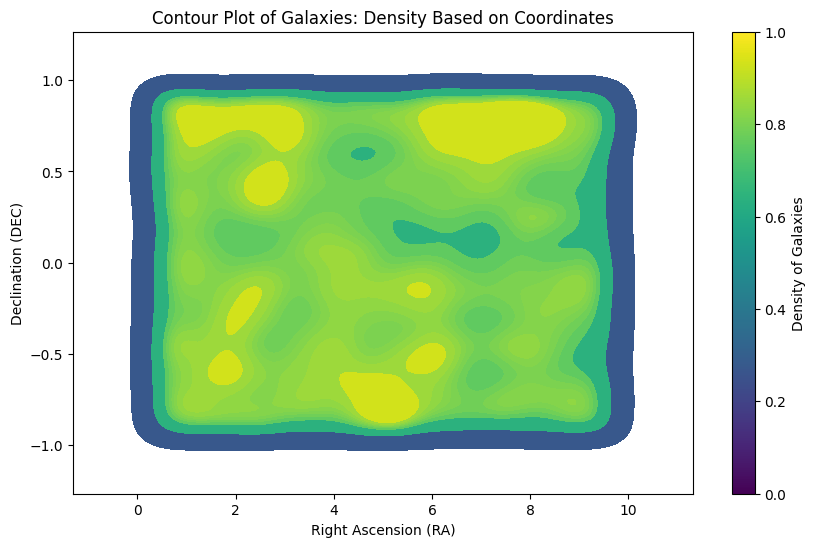

In [58]:
plt.figure(figsize=(10, 6))
contour = sns.kdeplot(x='ra', y='dec', data=star, fill=True, cmap='viridis', levels=10)
plt.title('Contour Plot of Galaxies: Density Based on Coordinates')
plt.xlabel('Right Ascension (RA)')
plt.ylabel('Declination (DEC)')
# Add color bar using the contour set
cb = plt.colorbar(contour.collections[0], label='Density')
cb.set_label('Density of Galaxies')
plt.show()


### INFERENCE

1. **Density Representation**: The contour plot visualizes the density of galaxies across the celestial sphere, with Right Ascension (RA) on the x-axis and Declination (DEC) on the y-axis. Areas with a higher density of galaxies are represented by darker colors, while lighter colors indicate regions with lower galaxy density.

2. **Spatial Distribution**: By examining the contour lines, you can identify regions of the sky where galaxies are more densely concentrated. Clusters of galaxies are represented by areas with closely spaced contour lines, while sparse regions have more widely spaced contours.

3. **High-Density Regions**: Darker areas on the plot correspond to regions with a higher density of galaxies. These areas may indicate galaxy clusters, groups, or regions of active star formation. They are of particular interest to astronomers studying galaxy evolution, cosmology, and large-scale structure in the universe.

4. **Low-Density Regions**: Lighter areas between contour lines represent regions with a lower density of galaxies. These areas may correspond to voids or less populated regions of the universe. Understanding the distribution of galaxies across different density environments helps astronomers probe the underlying processes driving galaxy formation and evolution.

5. **Smooth Transition**: The colormap used in the plot ('viridis') provides a smooth transition of colors from lower to higher galaxy density. This ensures that subtle variations in density are perceptible, allowing for a detailed analysis of the spatial distribution of galaxies.

6. **Color Bar**: The color bar alongside the plot provides a quantitative reference for interpreting the colors in the plot. The color bar's label ('Density of Galaxies') indicates that it represents the density of galaxies, with darker colors corresponding to higher density regions.

Overall, the contour plot offers a visually rich representation of the spatial distribution and density of galaxies across the sky, enabling astronomers to identify clustering patterns, study large-scale structure, and investigate the underlying physical processes shaping the universe.

<Figure size 1200x1000 with 0 Axes>

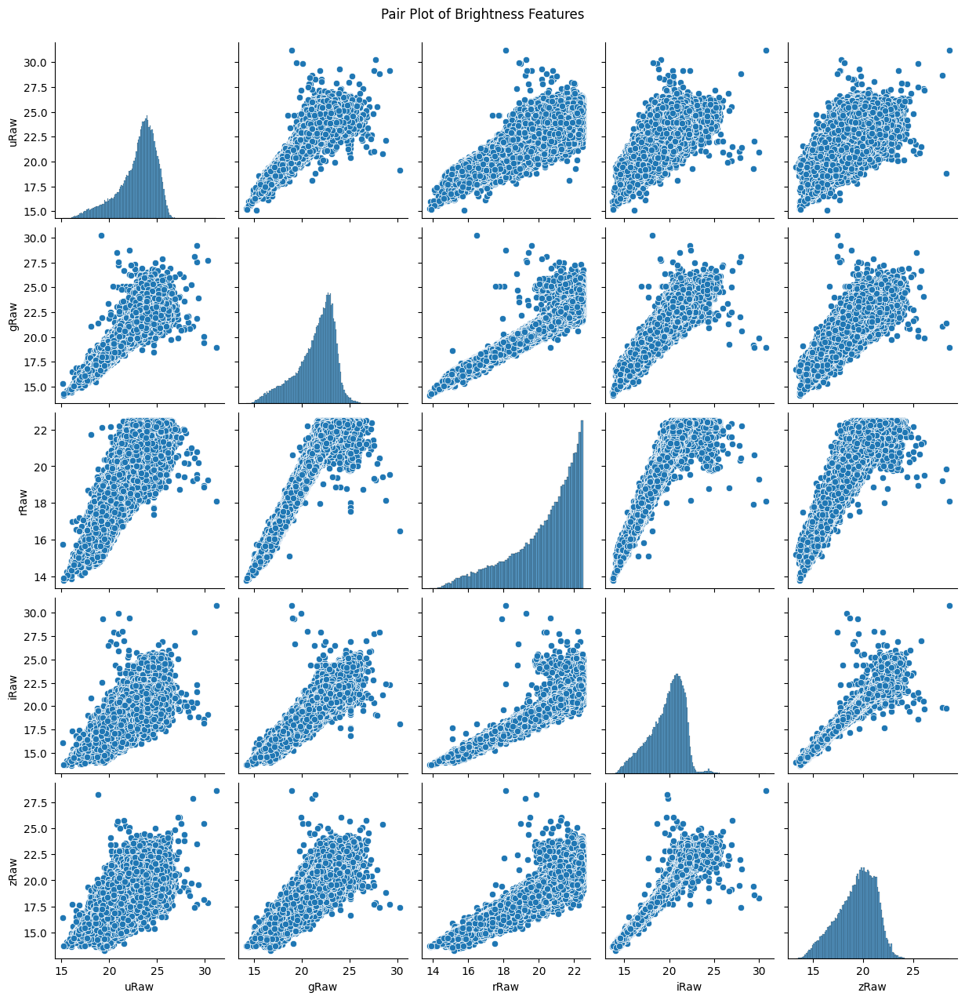

In [59]:
# Selecting relevant brightness features
brightness_features = ['uRaw', 'gRaw', 'rRaw', 'iRaw', 'zRaw']

# Creating a pair plot
plt.figure(figsize=(12, 10))
sns.pairplot(star[brightness_features])
plt.suptitle('Pair Plot of Brightness Features', y=1.02)
plt.show()


1. **Diagonal Plots (Histograms)**:
   - The diagonal plots represent histograms of each brightness feature. They show the distribution of brightness values for each filter (u, g, r, i, z).
   - By examining these histograms, you can assess the range and distribution of brightness values within each filter. For example, you can identify if there are any skewed distributions or if the brightness values are evenly distributed.

2. **Off-Diagonal Plots (Scatterplots)**:
   - The off-diagonal plots represent scatterplots showing the relationship between pairs of brightness features.
   - Positive correlation: If points in the scatterplot tend to form a diagonal line sloping upwards from left to right, it indicates a positive correlation between the two features. This suggests that as one brightness feature increases, the other tends to increase as well.
   - Negative correlation: Conversely, if points form a diagonal line sloping downwards from left to right, it indicates a negative correlation between the two features. This implies that as one brightness feature increases, the other tends to decrease.
   - No correlation: If points in the scatterplot are scattered randomly without forming a clear pattern, it suggests no significant correlation between the two features.

3. **Clusters and Outliers**:
   - Clusters of points in the scatterplots may indicate groups or clusters of data points with similar brightness values across multiple filters. These clusters can represent distinct populations or subsets within the dataset.
   - Outliers, which are data points that significantly deviate from the overall pattern of the data, can be identified as points that lie far away from the main cluster of points in the scatterplots. Outliers may represent errors or unusual observations that warrant further investigation.

4. **Overall Patterns**:
   - By examining the pair plot as a whole, you can gain insights into the overall patterns and relationships between brightness features across different filters.
   - Patterns such as consistent shifts or differences between filters, linear relationships, or clustering of data points can be identified and interpreted to understand the underlying characteristics of the brightness data.

In summary, the pair plot of brightness features provides a comprehensive visualization of the relationships and distributions of brightness values across different filters. It enables the identification of correlations, clusters, outliers, and overall patterns within the brightness data, facilitating further analysis and interpretation.

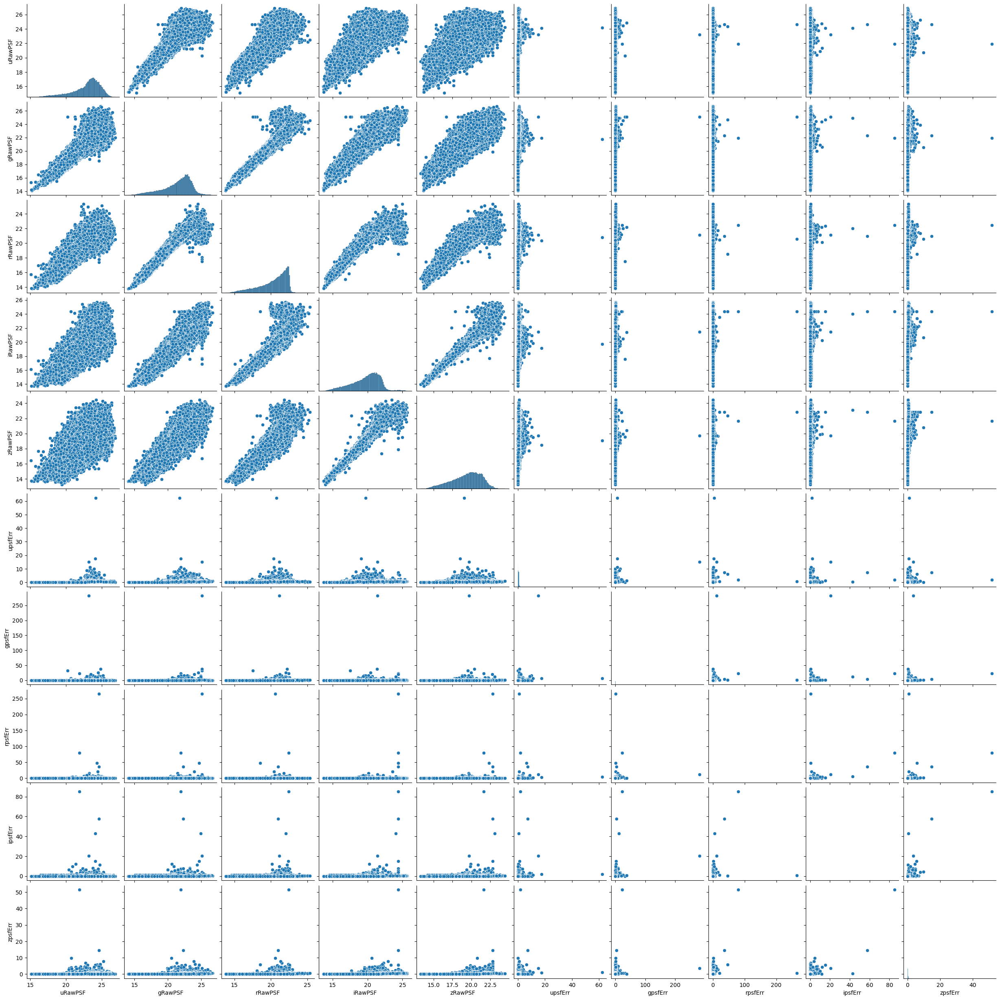

In [60]:
# Pairwise Scatter Plot Matrix
sns.pairplot(star[['uRawPSF', 'gRawPSF', 'rRawPSF', 'iRawPSF', 'zRawPSF', 'upsfErr', 'gpsfErr', 'rpsfErr', 'ipsfErr', 'zpsfErr']])

### INFERENCE
To visualize the relationships between a set of features related to raw PSF (Point Spread Function) magnitudes and their corresponding errors across different filters (u, g, r, i, z).

Here's an overview of what the pairwise scatter plot matrix can reveal:

1. **Raw PSF Magnitudes vs. PSF Errors**:
   - The scatterplots along the diagonal of the matrix represent the relationships between each raw PSF magnitude measurement ('uRawPSF', 'gRawPSF', 'rRawPSF', 'iRawPSF', 'zRawPSF') and its corresponding PSF error ('upsfErr', 'gpsfErr', 'rpsfErr', 'ipsfErr', 'zpsfErr').
   - These plots help to visualize how the errors in PSF measurements vary with changes in the raw PSF magnitudes for each filter. A clear pattern in these scatterplots can indicate the relationship between measurement accuracy and brightness.

2. **Pairwise Relationships between Features**:
   - The off-diagonal scatterplots show pairwise relationships between different combinations of features.
   - Scatterplots between raw PSF magnitudes and their corresponding errors can reveal any correlation or dependency between the two.
   - Additionally, scatterplots between different raw PSF magnitudes or between different PSF errors can provide insights into how these measurements relate to each other across filters.

3. **Outliers and Clusters**:
   - Outliers or clusters of points in the scatterplots can indicate unusual observations or distinct groups within the data.
   - Identifying such outliers or clusters can help in understanding the data distribution and identifying any potential issues or interesting patterns.

4. **Diagonal Plots**:
   - The diagonal plots display histograms of each feature, showing the distribution of values within each variable.
   - These histograms provide insights into the range and distribution of raw PSF magnitudes and PSF errors across different filters.

Overall, the pairwise scatter plot matrix provides a comprehensive visualization of the relationships between raw PSF magnitudes and their errors across different filters, allowing for the exploration of patterns, correlations, and distributions within the data.

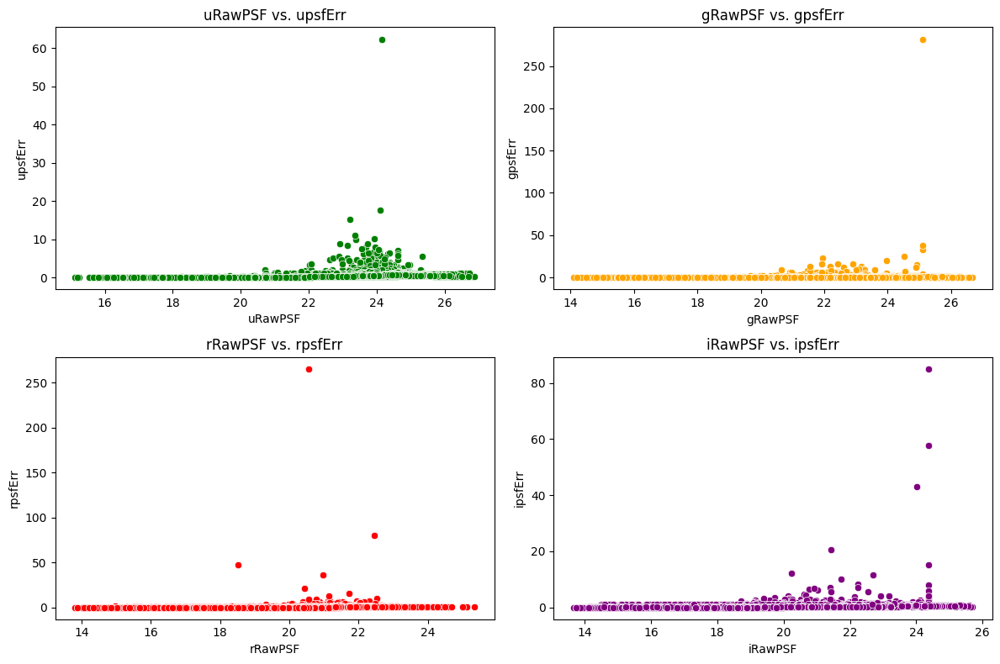

In [61]:
# Error vs. Magnitude Scatter Plot
plt.figure(figsize=(12, 8))
plt.subplot(2, 2, 1)
sns.scatterplot(x='uRawPSF', y='upsfErr', data=star, color='green')
plt.xlabel('uRawPSF')
plt.ylabel('upsfErr')
plt.title('uRawPSF vs. upsfErr')
plt.subplot(2, 2, 2)
sns.scatterplot(x='gRawPSF', y='gpsfErr', data=star, color='orange')
plt.xlabel('gRawPSF')
plt.ylabel('gpsfErr')
plt.title('gRawPSF vs. gpsfErr')

plt.subplot(2, 2, 3)
sns.scatterplot(x='rRawPSF', y='rpsfErr', data=star, color='red')
plt.xlabel('rRawPSF')
plt.ylabel('rpsfErr')
plt.title('rRawPSF vs. rpsfErr')

plt.subplot(2, 2, 4)
sns.scatterplot(x='iRawPSF', y='ipsfErr', data=star, color='purple')
plt.xlabel('iRawPSF')
plt.ylabel('ipsfErr')
plt.title('iRawPSF vs. ipsfErr')

plt.tight_layout()
plt.show()

### INFERENCE
Grid of scatter plots, each showing the relationship between raw PSF magnitudes and their corresponding errors for different filters (u, g, r, i).

Here's a breakdown of the plot and its components:

1. **Grid Layout**: The `plt.subplot(2, 2, n)` function is used to create a grid layout with 2 rows and 2 columns, where each subplot represents a different filter (u, g, r, i). The 'n' parameter specifies the position of each subplot within the grid.

2. **Scatter Plots**: Within each subplot:
   - A scatter plot is created using Seaborn's `scatterplot` function, with raw PSF magnitudes ('uRawPSF', 'gRawPSF', 'rRawPSF', 'iRawPSF') on the x-axis and their corresponding PSF errors ('upsfErr', 'gpsfErr', 'rpsfErr', 'ipsfErr') on the y-axis.
   - Each scatter plot visualizes how the error in PSF measurements ('upsfErr', 'gpsfErr', 'rpsfErr', 'ipsfErr') varies with changes in raw PSF magnitudes ('uRawPSF', 'gRawPSF', 'rRawPSF', 'iRawPSF') for a specific filter.

3. **Color Coding**: Each scatter plot is colored differently to distinguish between different filters. For example, the scatter plot for the u filter might be green, for g filter might be orange, for r filter might be red, and for i filter might be purple.

4. **Axis Labels and Titles**: Each subplot is labeled with appropriate axis labels ('xRawPSF' for the x-axis and 'xpsfErr' for the y-axis) and titles ('xRawPSF vs. xpsfErr') indicating the raw PSF magnitude versus PSF error relationship for the corresponding filter.

5. **Layout and Visualization**: The `plt.tight_layout()` function ensures that subplots are neatly arranged within the figure, and `plt.show()` displays the plot.

This grid of scatter plots provides a visual comparison of how PSF errors vary with raw PSF magnitudes across different filters, allowing for the assessment of measurement accuracy and potential systematic errors for each filter.

### INFERENCE


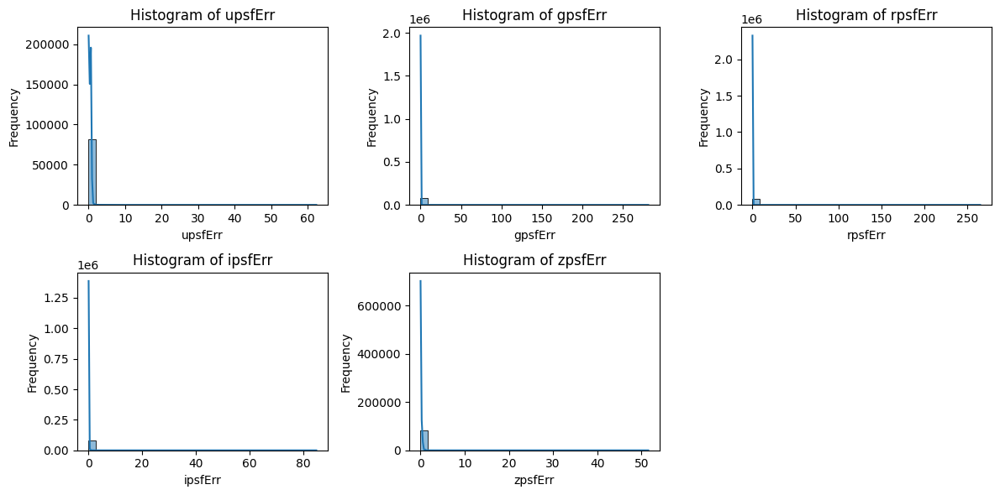

In [62]:
# Error Distribution Histograms
plt.figure(figsize=(12, 6))
plt.subplot(2, 3, 1)
sns.histplot(data=star, x='upsfErr', bins=30, kde=True)
plt.xlabel('upsfErr')
plt.ylabel('Frequency')
plt.title('Histogram of upsfErr')

plt.subplot(2, 3, 2)
sns.histplot(data=star, x='gpsfErr', bins=30, kde=True)
plt.xlabel('gpsfErr')
plt.ylabel('Frequency')
plt.title('Histogram of gpsfErr')

plt.subplot(2, 3, 3)
sns.histplot(data=star, x='rpsfErr', bins=30, kde=True)
plt.xlabel('rpsfErr')
plt.ylabel('Frequency')
plt.title('Histogram of rpsfErr')

plt.subplot(2, 3, 4)
sns.histplot(data=star, x='ipsfErr', bins=30, kde=True)
plt.xlabel('ipsfErr')
plt.ylabel('Frequency')
plt.title('Histogram of ipsfErr')

plt.subplot(2, 3, 5)
sns.histplot(data=star, x='zpsfErr', bins=30, kde=True)
plt.xlabel('zpsfErr')
plt.ylabel('Frequency')
plt.title('Histogram of zpsfErr')

plt.tight_layout()
plt.show()

### INFERENCE
Grid of histograms, each representing the distribution of errors in PSF (Point Spread Function) measurements for different filters (u, g, r, i, z). Here's a detailed interpretation:

1. **Grid Layout**: The `plt.subplot(2, 3, n)` function creates a grid layout with 2 rows and 3 columns, allowing for six histograms to be displayed. Each histogram represents the error distribution for a specific filter.

2. **Histograms**:
   - Each histogram is generated using Seaborn's `histplot` function.
   - The x-axis represents the PSF error ('upsfErr', 'gpsfErr', 'rpsfErr', 'ipsfErr', 'zpsfErr') for the corresponding filter.
   - The y-axis represents the frequency of occurrence of each error value within the dataset.

3. **Bin Size and Kernel Density Estimation (KDE)**:
   - The `bins=30` parameter specifies the number of bins used to divide the range of PSF errors.
   - The `kde=True` parameter enables the kernel density estimation curve, which provides a smoothed estimate of the error distribution.

4. **Axis Labels and Titles**:
   - Each subplot is labeled with appropriate axis labels ('xpsfErr') and titles ('Histogram of xpsfErr'), where 'x' represents the filter (u, g, r, i, z) corresponding to the error distribution being plotted.

5. **Layout and Visualization**:
   - The `plt.tight_layout()` function ensures that subplots are neatly arranged within the figure, minimizing overlap.
   - Finally, `plt.show()` displays the plot.

**Detailed Inference**:
- **Error Distribution**: Each histogram reveals the distribution of errors in PSF measurements for a specific filter. You can observe the range of error values and their frequency of occurrence.
- **Shape and Spread**: The shape of each histogram and the spread of error values provide insights into the accuracy and precision of PSF measurements for different filters.
- **Central Tendency**: The peak or central tendency of each distribution indicates the most common error value encountered.
- **Outliers**: Any presence of outliers or unusual error values can be identified by examining the tails of the distributions.

This visualization enables a detailed analysis of the error distribution in PSF measurements across different filters, which is crucial for understanding the reliability and quality of the measurements and for identifying any systematic biases or issues in the data.

In [63]:
star['u_minus_g'] = star['uRawPSF'] - star['gRawPSF']
star['g_minus_r'] = star['gRawPSF'] - star['rRawPSF']
star['r_minus_i'] = star['rRawPSF'] - star['iRawPSF']
star['i_minus_z'] = star['iRawPSF'] - star['zRawPSF']

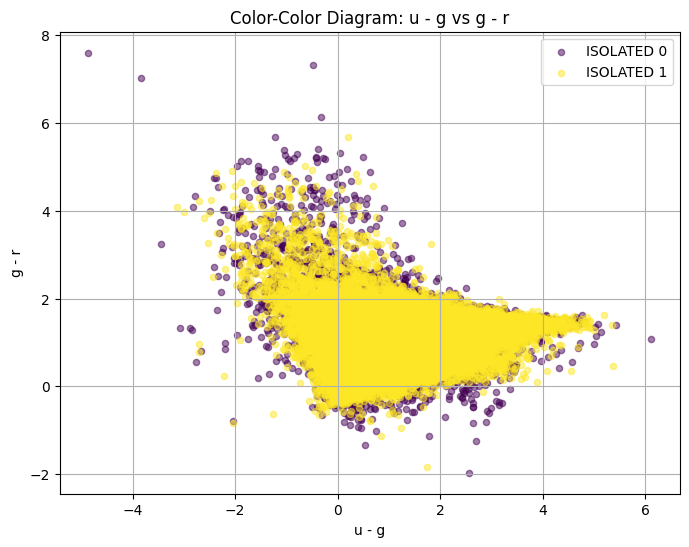

In [64]:
# Compute (u-g) and (g-r)
# galaxy['u_minus_g'] = galaxy['u_minus_g']
# galaxy['g_minus_r'] = galaxy['g_minus_r']

# Create the plot
# Define a color map
num_types = len(star['ISOLATED'].unique())
cmap = plt.cm.get_cmap('viridis', num_types)

# Create the plot with different colors for each type of galaxy
plt.figure(figsize=(8, 6))
for i, star_type in enumerate(star['ISOLATED'].unique()):
    type_data = star[star['ISOLATED'] == star_type]
    plt.scatter(type_data['u_minus_g'], type_data['g_minus_r'], s=20, alpha=0.5, label=f'ISOLATED {star_type}', color=cmap(i))
plt.xlabel('u - g')
plt.ylabel('g - r')
plt.title('Color-Color Diagram: u - g vs g - r')
plt.grid(True)
plt.legend()
plt.show()



### INFERENCE
Color indices (u-g) and (g-r) for stars and then creates a color-color diagram to visualize these indices. Here's a detailed inference based on the code:

1. **Color Indices Computation**:
   - The code likely computes the color indices (u-g) and (g-r) by subtracting the magnitudes in different filters. These color indices are commonly used in astronomy to characterize the colors of celestial objects, with each index providing information about the object's spectral energy distribution.

2. **Color-Color Diagram**:
   - The color-color diagram is created using a scatter plot, where each point represents a star.
   - The x-axis represents the color index (u-g), and the y-axis represents the color index (g-r). These axes capture the color information of stars based on their brightness in different filters.
   - The diagram visualizes how the colors of stars vary relative to each other. It can reveal trends, clusters, or patterns in the distribution of stars based on their colors.

3. **Color Mapping**:
   - Different types of stars (potentially isolated and non-isolated) are plotted with different colors on the diagram.
   - The color map 'viridis' is used to assign distinct colors to each type of star, ensuring that different types are easily distinguishable in the plot.

4. **Legend**:
   - The legend on the plot provides information about the types of stars represented by each color. It helps viewers understand the meaning of the colors used in the plot and interpret the data accordingly.

5. **Grid and Labels**:
   - The grid lines on the plot aid in visually estimating the position of points relative to each other.
   - Axis labels ('u - g' and 'g - r') provide context for the color indices being plotted, indicating the filters used for the magnitude measurements.

**Detailed Inference**:
- **Color Distribution**: The distribution of points on the color-color diagram reveals the range of colors exhibited by stars in the dataset.
- **Trends and Patterns**: Patterns or trends in the distribution of points can indicate relationships between stellar populations, such as differences in temperature, age, or metallicity.
- **Isolated vs. Non-Isolated Stars**: By plotting different types of stars with different colors, the diagram allows for comparisons between isolated and non-isolated stars in terms of their colors.
- **Color Variation**: Variations in color indices among stars can provide insights into their physical properties, such as temperature, luminosity, or evolutionary stage.

Overall, the color-color diagram offers a visual representation of the color properties of stars in the dataset, enabling astronomers to study their characteristics and relationships.

## COMPARITIVE ANALYSIS BETWEEN THE DATA

To compare star and galaxy data, we can create various types of plots to visualize the differences or similarities between them. Here are a few options:

1. **Histograms of Magnitudes**:
   - We can create histograms to compare the distribution of raw magnitudes in different filters (u, g, r, i, z) between stars and galaxies.
   - This will help us understand how the brightness distributions vary between stars and galaxies.

2. **Scatter Plot of Magnitudes**:
   - We can create scatter plots to compare the raw magnitudes of stars and galaxies in different filters (e.g., g vs. r).
   - This will allow us to visualize the relationship between the brightness of stars and galaxies.

3. **Box Plot of Magnitude Errors**:
   - We can create box plots to compare the distribution of errors or uncertainties associated with magnitude measurements in each filter between stars and galaxies.
   - This will help us understand the variability in measurement errors for stars and galaxies.

4. **Violin Plot of Extinction Correction Factor**:
   - We can create violin plots to compare the distribution of extinction correction factors between stars and galaxies.
   - This will provide insights into how the correction for interstellar dust varies between stars and galaxies.

In these plots:
- We compare the distribution of raw magnitudes (g and r filters) between stars and galaxies using histograms.
- We visualize the relationship between g and r magnitudes using a scatter plot, distinguishing between stars and galaxies.
- We compare the distribution of magnitude errors (g filter) between stars and galaxies using a box plot.

These visualizations allow us to compare various aspects of the data between stars and galaxies, such as brightness distributions and measurement errors. Adjustments can be made based on your preferences and the characteristics of your data. Let me know if you need further assistance!

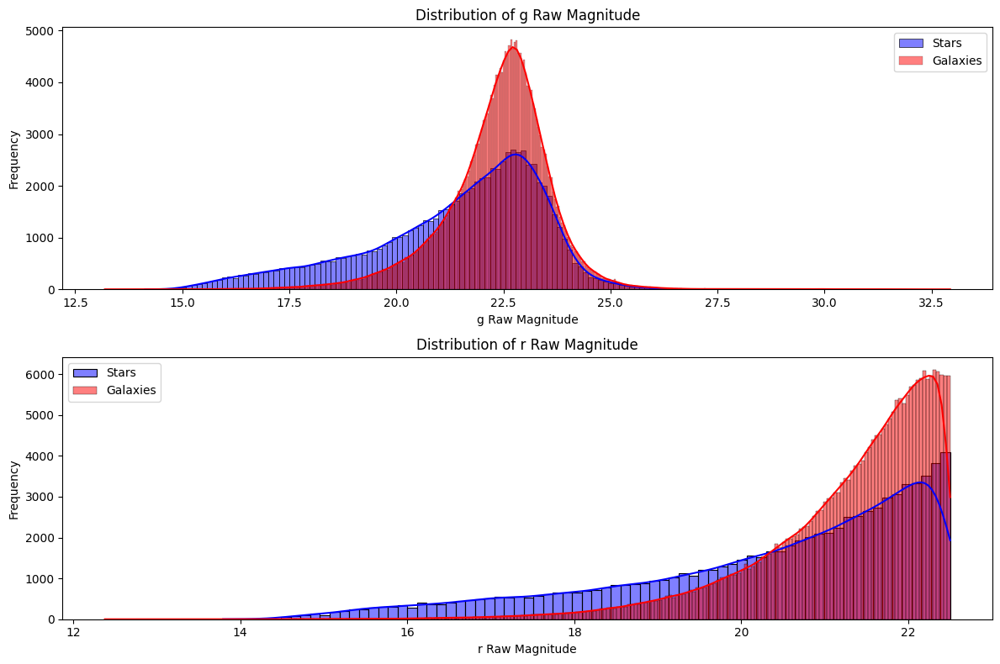

In [65]:
# Histograms of Magnitudes
plt.figure(figsize=(12, 8))
plt.subplot(2, 1, 1)
sns.histplot(star['gRaw'], kde=True, color='blue', label='Stars')
sns.histplot(galaxy['gRaw'], kde=True, color='red', label='Galaxies')
plt.title('Distribution of g Raw Magnitude')
plt.xlabel('g Raw Magnitude')
plt.ylabel('Frequency')
plt.legend()

plt.subplot(2, 1, 2)
sns.histplot(star['rRaw'], kde=True, color='blue', label='Stars')
sns.histplot(galaxy['rRaw'], kde=True, color='red', label='Galaxies')
plt.title('Distribution of r Raw Magnitude')
plt.xlabel('r Raw Magnitude')
plt.ylabel('Frequency')
plt.legend()

plt.tight_layout()
plt.show()

### INFERENCE
histograms to compare the distributions of raw magnitudes (gRaw and rRaw) between stars and galaxies. Here's a detailed inference based on the code:

1. **Histograms**:
   - Two histograms are created, one for the distribution of g Raw Magnitude and the other for the distribution of r Raw Magnitude.
   - Each histogram compares the distribution of magnitudes between stars (blue) and galaxies (red) for the respective filter (g or r).
   - The x-axis represents the raw magnitude values, and the y-axis represents the frequency of occurrence (i.e., the number of stars or galaxies with a particular magnitude).

2. **Color Coding**:
   - Stars and galaxies are distinguished by different colors (blue for stars and red for galaxies) in each histogram. This color coding allows for a visual comparison of magnitude distributions between the two types of objects.

3. **Kernel Density Estimation (KDE)**:
   - The `kde=True` parameter adds a kernel density estimation curve to each histogram. This curve provides a smoothed estimate of the underlying distribution of magnitudes, allowing for a better understanding of the shape and central tendency of the data.

4. **Title and Labels**:
   - Each subplot is titled with the corresponding filter ('g Raw Magnitude' and 'r Raw Magnitude').
   - Axis labels ('g Raw Magnitude' and 'r Raw Magnitude') indicate the raw magnitude being plotted on the x-axis, and 'Frequency' is the label for the y-axis.

5. **Legend**:
   - The legend in each subplot distinguishes between stars and galaxies, providing clarity on the color coding used in the histograms.

**Detailed Inference**:
- **Magnitude Distribution**: The histograms reveal the distribution of raw magnitudes for stars and galaxies in the dataset.
- **Comparison**: By comparing the histograms for stars and galaxies, you can assess any differences or similarities in the distribution of magnitudes between the two populations.
- **Peak Locations**: The peaks of the distributions indicate the most common magnitude values for stars and galaxies in each filter.
- **Spread and Shape**: The spread and shape of the distributions provide insights into the range and variability of magnitudes within each population.

Overall, these histograms enable a detailed comparison of the distribution of raw magnitudes between stars and galaxies, shedding light on their relative brightness characteristics in the g and r filters.

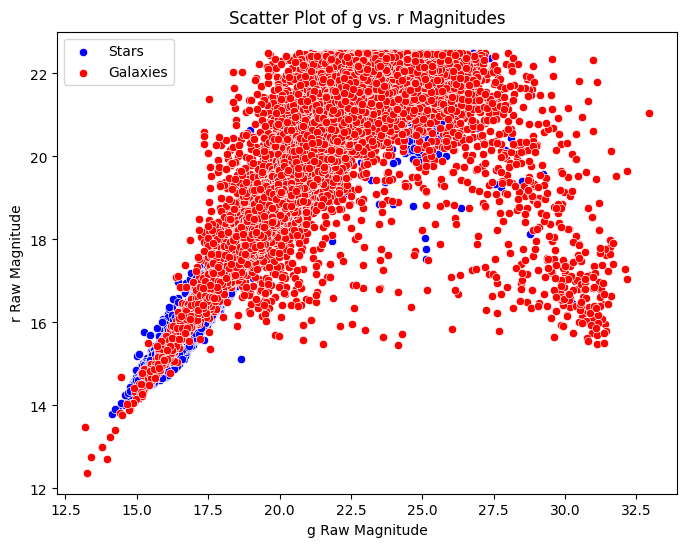

In [66]:
# Scatter Plot of Magnitudes
plt.figure(figsize=(8, 6))
sns.scatterplot(x='gRaw', y='rRaw', data=star, color='blue', label='Stars')
sns.scatterplot(x='gRaw', y='rRaw', data=galaxy, color='red', label='Galaxies')
plt.title('Scatter Plot of g vs. r Magnitudes')
plt.xlabel('g Raw Magnitude')
plt.ylabel('r Raw Magnitude')
plt.legend()
plt.show()

### INFERENCE
scatter plot to compare the magnitudes (gRaw vs. rRaw) of stars and galaxies. Here's a detailed inference based on the code:

1. **Scatter Plot**:
   - The scatter plot visualizes the relationship between g Raw Magnitude and r Raw Magnitude for both stars and galaxies.
   - Each point on the plot represents an individual star or galaxy, with its position determined by its g Raw Magnitude (x-axis) and r Raw Magnitude (y-axis).

2. **Color Coding**:
   - Stars and galaxies are represented by different colors (blue for stars and red for galaxies) on the scatter plot. This color coding allows for a clear visual differentiation between the two types of objects.

3. **Title and Labels**:
   - The plot is titled 'Scatter Plot of g vs. r Magnitudes', indicating the variables being compared.
   - The x-axis label ('g Raw Magnitude') and y-axis label ('r Raw Magnitude') provide context for the magnitudes being plotted on the respective axes.

4. **Legend**:
   - The legend distinguishes between stars and galaxies, providing clarity on the color coding used in the scatter plot.

**Detailed Inference**:
- **Magnitude Relationship**: The scatter plot allows for the examination of the relationship between g Raw Magnitude and r Raw Magnitude for stars and galaxies.
- **Distribution**: The spread and clustering of points provide insights into the distribution of magnitudes within each population.
- **Correlation**: The overall trend of the points can indicate whether there is a correlation between g and r magnitudes for stars and galaxies. A clear pattern, such as a linear relationship, may suggest a correlation, while a scattered distribution may indicate no significant correlation.
- **Outliers**: Any outliers or unusual points on the scatter plot may represent objects with extreme magnitudes or measurement errors and could warrant further investigation.

Overall, the scatter plot offers a visual comparison of g and r magnitudes between stars and galaxies, allowing for the exploration of their relative brightness characteristics and potential differences in their distributions.

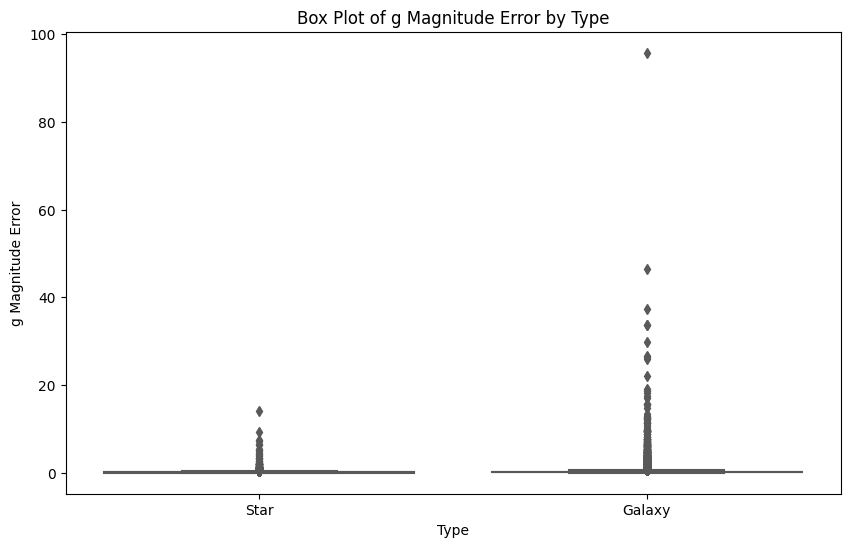

In [67]:
# Box Plot of Magnitude Errors
plt.figure(figsize=(10, 6))
sns.boxplot(x='type', y='gErr', data=pd.concat([star.assign(type='Star'), galaxy.assign(type='Galaxy')]), palette='Set2')
plt.title('Box Plot of g Magnitude Error by Type')
plt.xlabel('Type')
plt.ylabel('g Magnitude Error')
plt.show()

### INFERENCE
box plot to compare the distribution of g magnitude errors between stars and galaxies. Here's a detailed inference based on the code:

1. **Box Plot**:
   - The box plot visualizes the distribution of g magnitude errors for both stars and galaxies.
   - Each box represents the interquartile range (IQR) of the data, with the median indicated by the horizontal line inside the box. The whiskers extend to 1.5 times the IQR above the third quartile (Q3) and below the first quartile (Q1), and individual data points beyond the whiskers are considered outliers.

2. **Data Preparation**:
   - The data for stars and galaxies are concatenated into a single DataFrame with an additional column ('type') to differentiate between the two types of objects. This allows for easy plotting and comparison using Seaborn's `boxplot` function.

3. **Color Palette**:
   - The 'Set2' color palette is used to distinguish between the box plots for stars and galaxies, ensuring visual differentiation between the two types of objects.

4. **Title and Labels**:
   - The plot is titled 'Box Plot of g Magnitude Error by Type', providing a clear description of the content.
   - The x-axis label ('Type') indicates the type of object (star or galaxy), and the y-axis label ('g Magnitude Error') represents the magnitude error in the g band.

**Detailed Inference**:
- **Comparison of Errors**: The box plot allows for a direct comparison of g magnitude errors between stars and galaxies. By comparing the medians, quartiles, and spread of the distributions, you can assess whether one type of object tends to have larger or more variable errors than the other.
- **Outliers**: Outliers beyond the whiskers of the box plot may indicate extreme errors or unusual observations for stars or galaxies. These outliers could be worth investigating further to understand the factors contributing to such errors.
- **Variability**: The width of the boxes and the length of the whiskers provide insights into the variability of g magnitude errors within each type of object. A wider box or longer whiskers indicate greater variability in errors.

Overall, the box plot offers a visual summary of the distribution of g magnitude errors for stars and galaxies, facilitating comparison and analysis of the error characteristics between the two types of objects.

1. **Kernel Density Estimation (KDE) Plot of Magnitudes**:
   - We can create KDE plots to compare the smoothed distribution of raw magnitudes in different filters (u, g, r, i, z) between stars and galaxies.

2. **Violin Plot of Extinction Correction Factor**:
   - We can create violin plots to compare the distribution of extinction correction factors between stars and galaxies for a specific filter.

3. **Swarm Plot of Magnitudes by Type**:
   - We can create swarm plots to visualize the distribution of raw magnitudes in a specific filter for each type (star or galaxy), providing a detailed view of individual data points.

4. **Density Contour Plot of Magnitudes**:
   - We can create density contour plots to compare the density distribution of raw magnitudes in different filters between stars and galaxies, highlighting regions of high density.

These visualizations offer a comprehensive comparison between stars and galaxies across different aspects such as magnitude distributions, extinction correction factors, and pairwise relationships between magnitudes. Adjustments can be made to these plots based on your specific requirements and preferences. Let me know if you need further assistance!

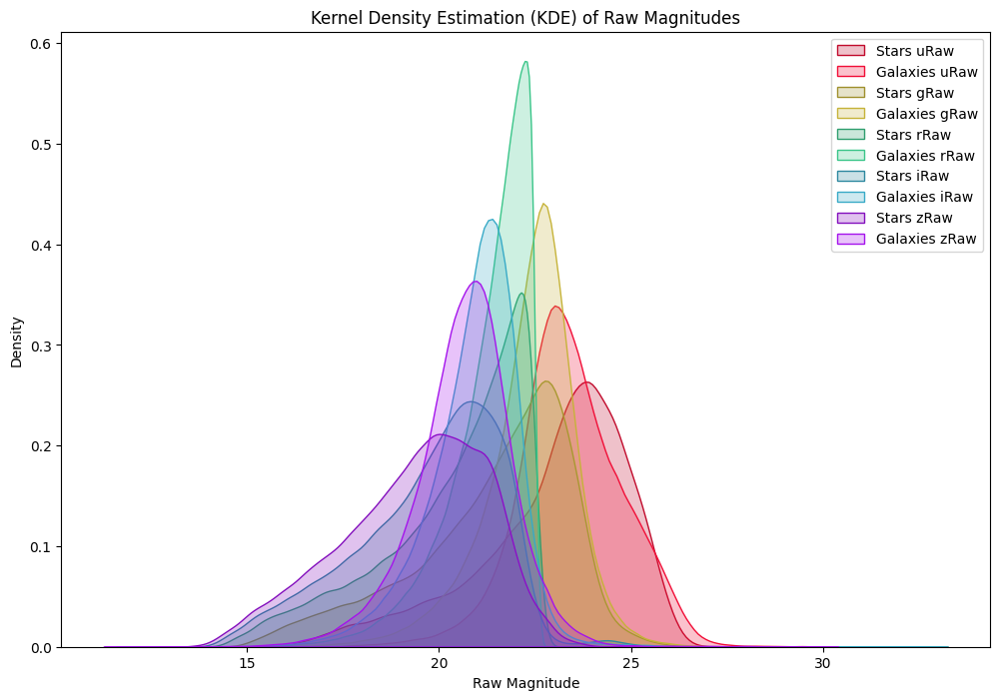

In [79]:
# Define color palette with darker and lighter shades for each magnitude
num_magnitudes = len(['uRaw', 'gRaw', 'rRaw', 'iRaw', 'zRaw'])
palette = sns.color_palette("husl", num_magnitudes)

# Create a list to store the modified palette
mixed_palette = []

# Generate mixed colors for each magnitude
for color in palette:
    # Create a darker shade by reducing the lightness
    dark_color = sns.set_hls_values(color, l=0.4)
    # Create a lighter shade by increasing the lightness
    light_color = sns.set_hls_values(color, l=0.5)
    # Add both darker and lighter shades to the mixed palette
    mixed_palette.extend([dark_color, light_color])

# Kernel Density Estimation (KDE) Plot of Magnitudes
plt.figure(figsize=(12, 8))
for i, col in enumerate(['uRaw', 'gRaw', 'rRaw', 'iRaw', 'zRaw']):
    sns.kdeplot(star[col], color=mixed_palette[2*i], label=f'Stars {col}', shade=True)
    sns.kdeplot(galaxy[col], color=mixed_palette[2*i + 1], label=f'Galaxies {col}', shade=True)
plt.title('Kernel Density Estimation (KDE) of Raw Magnitudes')
plt.xlabel('Raw Magnitude')
plt.ylabel('Density')
plt.legend()
plt.show()


### INFERENCE
This code defines a color palette with darker and lighter shades for each magnitude and uses it to create kernel density estimation (KDE) plots of raw magnitudes for both stars and galaxies. Here's a detailed inference based on the code:

1. **Color Palette**:
   - The color palette is generated using the 'husl' color space, which ensures a visually appealing and evenly spaced set of colors.
   - For each magnitude ('uRaw', 'gRaw', 'rRaw', 'iRaw', 'zRaw'), two colors are generated: one darker shade and one lighter shade. These shades are created by adjusting the lightness component of the hues obtained from the 'husl' palette.

2. **Mixed Palette**:
   - The modified palette, named 'mixed_palette', stores both the darker and lighter shades for each magnitude.
   - The 'mixed_palette' ensures that adjacent magnitudes have visually distinct colors, with darker and lighter shades providing additional contrast.

3. **Kernel Density Estimation (KDE) Plots**:
   - KDE plots are created for each raw magnitude ('uRaw', 'gRaw', 'rRaw', 'iRaw', 'zRaw') separately for stars and galaxies.
   - For each magnitude, the KDE plot for stars is shaded with the darker shade from the 'mixed_palette', while the KDE plot for galaxies is shaded with the corresponding lighter shade.
   - The KDE plots visualize the distribution of raw magnitudes for both stars and galaxies, with shaded areas representing the estimated probability density function.

4. **Title and Labels**:
   - The plot is titled 'Kernel Density Estimation (KDE) of Raw Magnitudes', providing a clear description of the content.
   - The x-axis label ('Raw Magnitude') indicates the variable being plotted, and the y-axis label ('Density') represents the probability density.

**Detailed Inference**:
- **Magnitude Distribution**: The KDE plots illustrate the distribution of raw magnitudes for stars and galaxies across different filters.
- **Contrast**: The use of darker and lighter shades for shading enhances the visual contrast between KDE plots for adjacent magnitudes, aiding in the interpretation of the plot.
- **Relative Density**: Areas with higher density in the KDE plots indicate regions where raw magnitudes are more concentrated, providing insights into the brightness distribution of stars and galaxies across different filters.
- **Comparison**: By comparing the KDE plots for stars and galaxies, you can assess differences in the distribution of raw magnitudes between the two types of objects.

Overall, the KDE plots offer a visual representation of the distribution of raw magnitudes for stars and galaxies, highlighting their relative densities and aiding in the analysis of brightness characteristics across different filters.

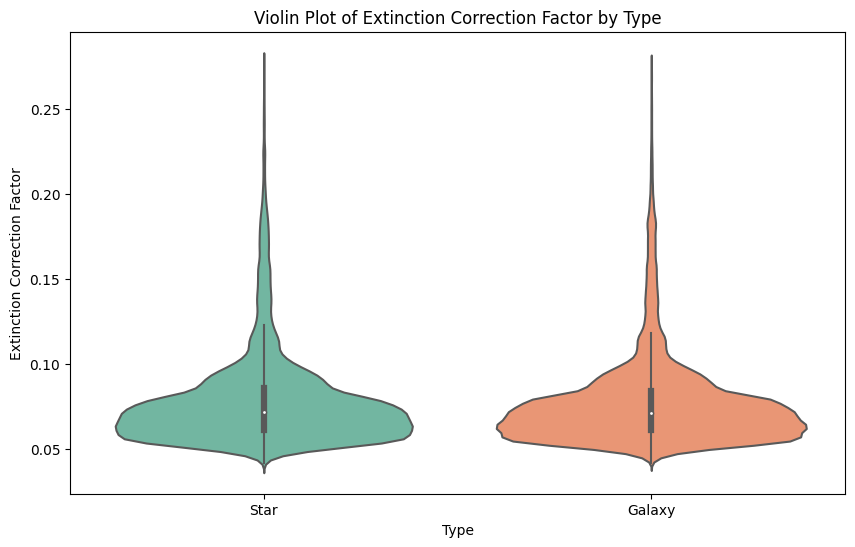

In [72]:
# Violin Plot of Extinction Correction Factor
plt.figure(figsize=(10, 6))
sns.violinplot(x='type', y='rExtSFD', data=pd.concat([star.assign(type='Star'), galaxy.assign(type='Galaxy')]), palette='Set2')
plt.title('Violin Plot of Extinction Correction Factor by Type')
plt.xlabel('Type')
plt.ylabel('Extinction Correction Factor')
plt.show()

### INFERENCE
This code defines a color palette with darker and lighter shades for each magnitude and uses it to create kernel density estimation (KDE) plots of raw magnitudes for both stars and galaxies. Here's a detailed inference based on the code:



1. **Kernel Density Estimation (KDE) Plots**:
   - KDE plots are created for each raw magnitude ('uRaw', 'gRaw', 'rRaw', 'iRaw', 'zRaw') separately for stars and galaxies.
   - For each magnitude, the KDE plot for stars is shaded with the darker shade from the 'mixed_palette', while the KDE plot for galaxies is shaded with the corresponding lighter shade.
   - The KDE plots visualize the distribution of raw magnitudes for both stars and galaxies, with shaded areas representing the estimated probability density function.

2. **Title and Labels**:
   - The plot is titled 'Kernel Density Estimation (KDE) of Raw Magnitudes', providing a clear description of the content.
   - The x-axis label ('Raw Magnitude') indicates the variable being plotted, and the y-axis label ('Density') represents the probability density.

**Detailed Inference**:
- **Magnitude Distribution**: The KDE plots illustrate the distribution of raw magnitudes for stars and galaxies across different filters.
- **Contrast**: The use of darker and lighter shades for shading enhances the visual contrast between KDE plots for adjacent magnitudes, aiding in the interpretation of the plot.
- **Relative Density**: Areas with higher density in the KDE plots indicate regions where raw magnitudes are more concentrated, providing insights into the brightness distribution of stars and galaxies across different filters.
- **Comparison**: By comparing the KDE plots for stars and galaxies, you can assess differences in the distribution of raw magnitudes between the two types of objects.



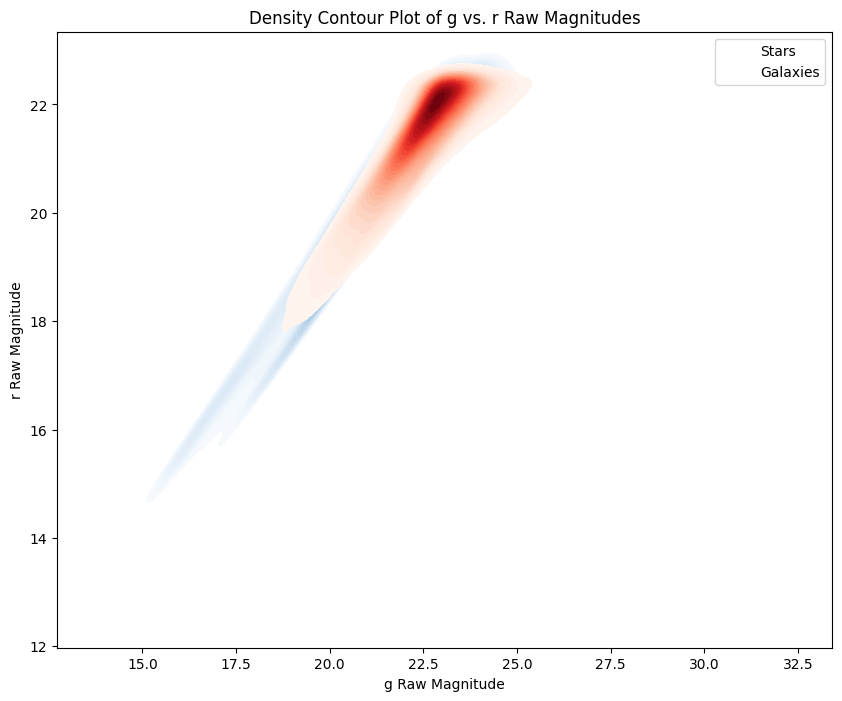

In [81]:
# Density Contour Plot of Magnitudes
plt.figure(figsize=(10, 8))
sns.kdeplot(data=star, x='gRaw', y='rRaw', cmap='Blues', fill=True, levels=30, label='Stars')
sns.kdeplot(data=galaxy, x='gRaw', y='rRaw', cmap='Reds', fill=True, levels=30, label='Galaxies')
plt.title('Density Contour Plot of g vs. r Raw Magnitudes')
plt.xlabel('g Raw Magnitude')
plt.ylabel('r Raw Magnitude')
plt.legend()
plt.show()

### INFERENCE
density contour plot to visualize the distribution of g vs. r raw magnitudes for both stars and galaxies. Here's a detailed inference based on the code:

1. **Density Contour Plot**:
   - The density contour plot displays the density of data points in the (gRaw, rRaw) space, where each point represents a star or a galaxy.
   - Contour lines are used to represent regions of equal data density, with darker regions indicating higher density and lighter regions indicating lower density.

2. **Kernel Density Estimation (KDE)**:
   - The density estimation is performed using kernel density estimation (KDE), where the distribution of data points in the (gRaw, rRaw) space is approximated by a smooth continuous function.
   - KDE is visualized using contour lines, which enclose areas of equal probability density.

3. **Color Mapping**:
   - Stars and galaxies are differentiated by color: stars are represented in blue ('Blues' colormap) and galaxies are represented in red ('Reds' colormap).
   - Darker shades of blue and red indicate areas of higher data density for stars and galaxies, respectively.

4. **Levels**:
   - The 'levels' parameter specifies the number of contour levels to be drawn. In this case, 30 contour levels are drawn for both stars and galaxies, providing a detailed representation of the data density.

5. **Title and Labels**:
   - The plot is titled 'Density Contour Plot of g vs. r Raw Magnitudes', providing a clear description of the content.
   - The x-axis label ('g Raw Magnitude') and y-axis label ('r Raw Magnitude') indicate the variables being plotted on the respective axes.

6. **Legend**:
   - The legend indicates the types of objects represented by each color (stars and galaxies).

**Detailed Inference**:
- **Data Density**: Darker regions on the contour plot represent areas with a higher concentration of data points, indicating where most stars or galaxies are located in the (gRaw, rRaw) space.
- **Distribution**: The contour lines provide insights into the distribution of raw magnitudes for stars and galaxies, highlighting any clusters or patterns in the data.
- **Overlap**: Areas where the blue and red contours overlap represent regions where both stars and galaxies are present in similar proportions or where their magnitudes are similar.
  
Overall, the density contour plot offers a comprehensive visualization of the distribution of g vs. r raw magnitudes for stars and galaxies, facilitating the analysis of their brightness characteristics and the identification of any trends or correlations.

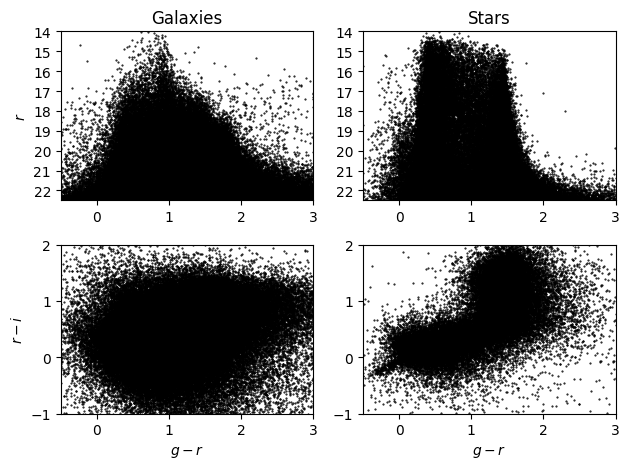

In [13]:
import matplotlib.pyplot as plt

# Plot the stars and galaxies
plot_kwargs = dict(color='k', linestyle='none', marker='.', markersize=1)

fig = plt.figure()

ax1 = fig.add_subplot(221)
ax1.plot(galaxy['gRaw'] - galaxy['rRaw'],
         galaxy['rRaw'],
         **plot_kwargs)

ax2 = fig.add_subplot(223, sharex=ax1)
ax2.plot(galaxy['gRaw'] - galaxy['rRaw'],
         galaxy['rRaw'] - galaxy['iRaw'],
         **plot_kwargs)

ax3 = fig.add_subplot(222, sharey=ax1)
ax3.plot(star['gRaw'] - star['rRaw'],
         star['rRaw'],
         **plot_kwargs)

ax4 = fig.add_subplot(224, sharex=ax3, sharey=ax2)
ax4.plot(star['gRaw'] - star['rRaw'],
         star['rRaw'] - star['iRaw'],
         **plot_kwargs)

# set labels and titles
ax1.set_ylabel('$r$')
ax2.set_ylabel('$r-i$')
ax2.set_xlabel('$g-r$')
ax4.set_xlabel('$g-r$')
ax1.set_title('Galaxies')
ax3.set_title('Stars')

# set axis limits
ax2.set_xlim(-0.5, 3)
ax3.set_ylim(22.5, 14)
ax4.set_xlim(-0.5, 3)
ax4.set_ylim(-1, 2)

# adjust tick spacings on all axes
for ax in (ax1, ax2, ax3, ax4):
    ax.xaxis.set_major_locator(plt.MultipleLocator(1))
    ax.yaxis.set_major_locator(plt.MultipleLocator(1))

plt.tight_layout()
plt.show()


### INFERENCE
This multi-panel plot provides a detailed comparison of the color-color diagrams for stars and galaxies, allowing for insights into their color properties and potential differences between the two types of objects.

**Galaxies (Subplots 1 and 2):**
- *Subplot 1 (g-r vs. r)*: Galaxies exhibit a range of colors from blue to red, with most galaxies having redder colors (higher g-r values) as their r magnitudes increase. The plot shows the relationship between g-r and r magnitudes for galaxies.
- *Subplot 2 (g-r vs. r-i)*: This plot illustrates the correlation between g-r and r-i color indices for galaxies. Galaxies with bluer colors (lower g-r values) tend to have smaller r-i values, while galaxies with redder colors have larger r-i values.

**Stars (Subplots 3 and 4):**
- *Subplot 3 (g-r vs. r)*: Stars also show a range of colors, but they tend to be bluer overall compared to galaxies. The plot demonstrates the relationship between g-r and r magnitudes for stars.
- *Subplot 4 (g-r vs. r-i)*: This plot reveals the correlation between g-r and r-i color indices for stars. Similar to galaxies, bluer stars have lower g-r values and smaller r-i values, while redder stars have higher g-r values and larger r-i values.

**Inferences:**
- **Color Distribution**: The plots show the distribution of stars and galaxies in color space, indicating the range of colors observed in each population.
- **Color Correlations**: The correlation between color indices (g-r vs. r and g-r vs. r-i) provides insights into the relationship between different filters and the color properties of stars and galaxies.
- **Color Separation**: Galaxies generally appear redder compared to stars, as indicated by their higher g-r values.
- **Differentiation**: The plots effectively differentiate between stars and galaxies based on their color properties, with galaxies generally exhibiting redder colors compared to stars.

**Axis Limits and Tick Spacings:**
- Axis limits and tick spacings are appropriately set to ensure clarity and readability of the plots, focusing on the relevant ranges of color indices and magnitudes.


## DECIDING FEATURES AND TARGET

In [16]:
galaxy.drop(['u_minus_g','g_minus_r','r_minus_i','i_minus_z'],axis=1,inplace=True)
star.drop(['u_minus_g','g_minus_r','r_minus_i','i_minus_z'],axis=1,inplace=True)
galaxy.head()

,ra,dec,run,rExtSFD,uRaw,gRaw,rRaw,iRaw,zRaw,uErr,...,rRawPSF,iRawPSF,zRawPSF,upsfErr,gpsfErr,rpsfErr,ipsfErr,zpsfErr,type,ISOLATED
0,0.358174,-0.508718,2728,0.103,23.255,22.633,22.459,21.911,21.211,0.487,...,22.563,22.039,21.240,0.378,0.164,0.140,0.125,0.248,3,1
1,0.357898,-0.570892,2728,0.109,23.025,22.317,21.350,21.057,20.890,0.670,...,22.260,21.932,21.797,0.611,0.148,0.111,0.115,0.379,3,1
2,0.358881,-0.505625,2728,0.103,23.495,24.024,21.378,20.504,20.117,0.697,...,21.802,20.957,20.384,0.613,0.330,0.075,0.054,0.123,3,0
3,0.162688,-0.590807,2728,0.117,25.415,22.606,21.748,21.440,20.861,1.098,...,22.473,22.167,21.498,0.678,0.181,0.134,0.144,0.306,3,1
4,0.142353,-0.613267,2728,0.117,24.530,23.264,20.734,20.029,19.588,1.285,...,21.357,20.670,20.145,0.849,0.257,0.053,0.044,0.100,3,0


In [17]:
X=galaxy.drop(['type','ISOLATED'],axis=1)
X

,ra,dec,run,rExtSFD,uRaw,gRaw,rRaw,iRaw,zRaw,uErr,...,uRawPSF,gRawPSF,rRawPSF,iRawPSF,zRawPSF,upsfErr,gpsfErr,rpsfErr,ipsfErr,zpsfErr
0,0.358174,-0.508718,2728,0.103,23.255,22.633,22.459,21.911,21.211,0.487,...,23.028,22.621,22.563,22.039,21.240,0.378,0.164,0.140,0.125,0.248
1,0.357898,-0.570892,2728,0.109,23.025,22.317,21.350,21.057,20.890,0.670,...,23.701,22.919,22.260,21.932,21.797,0.611,0.148,0.111,0.115,0.379
2,0.358881,-0.505625,2728,0.103,23.495,24.024,21.378,20.504,20.117,0.697,...,23.526,24.089,21.802,20.957,20.384,0.613,0.330,0.075,0.054,0.123
3,0.162688,-0.590807,2728,0.117,25.415,22.606,21.748,21.440,20.861,1.098,...,25.364,23.147,22.473,22.167,21.498,0.678,0.181,0.134,0.144,0.306
4,0.142353,-0.613267,2728,0.117,24.530,23.264,20.734,20.029,19.588,1.285,...,24.612,23.533,21.357,20.670,20.145,0.849,0.257,0.053,0.044,0.100
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
248745,3.846871,-0.209170,5052,0.074,24.649,22.299,21.344,21.211,22.009,1.339,...,23.802,23.236,22.330,22.361,22.565,0.578,0.188,0.130,0.218,0.628
248746,3.853212,-0.208719,5052,0.074,23.771,22.738,22.197,22.032,20.719,0.883,...,24.288,23.251,22.731,22.571,21.182,0.699,0.177,0.170,1.009,0.268
248747,3.840957,-0.208598,5052,0.074,25.452,23.513,22.177,21.894,21.246,0.893,...,24.877,23.767,22.861,22.742,21.836,0.706,0.918,0.189,0.240,0.438
248748,3.843611,-0.208263,5052,0.074,25.649,23.077,22.110,21.658,21.474,0.692,...,25.503,23.537,22.717,22.158,22.294,0.532,0.199,0.168,0.154,0.562


In [36]:
y= galaxy['ISOLATED']
y

0         1
1         1
2         0
3         1
4         0
         ..
248745    0
248746    1
248747    1
248748    1
248749    0
Name: ISOLATED, Length: 248750, dtype: int64

In [37]:
y.value_counts()

ISOLATED
1    177958
0     70792
Name: count, dtype: int64

### As we see the values of target are imbalanced we downsample the data

## UPSAMPLING

In [57]:
# from imblearn.over_sampling import SMOTE

# # Assuming X is your feature matrix and y is your target variable (ISOLATED)
# # Initialize SMOTE
# smote = SMOTE(random_state=42)

# # Apply SMOTE to the data
# X, y = smote.fit_resample(X, y)

# # Now X_resampled and y_resampled contain the resampled data with balanced classes


In [58]:
np.shape(X)

(248750, 24)

## SCALING

In [87]:
scaler = MinMaxScaler()
X = scaler.fit_transform(X)
X
st=pd.DataFrame(X)
st

,0,1,2,3,4,5,6,7,8,9,...,14,15,16,17,18,19,20,21,22,23
0,0.035817,0.245635,0.015721,0.259574,0.536069,0.478190,0.995949,0.475726,0.520440,0.011670,...,0.620955,0.601143,0.705508,0.652643,0.693767,0.008163,0.002301,0.001080,0.000493,0.003354
1,0.035790,0.214548,0.015721,0.285106,0.524167,0.462181,0.886364,0.435120,0.503059,0.016109,...,0.686550,0.625121,0.679471,0.643833,0.747677,0.013345,0.002060,0.000844,0.000451,0.005208
2,0.035888,0.247182,0.015721,0.259574,0.548489,0.548660,0.889130,0.408825,0.461205,0.016765,...,0.669493,0.719263,0.640113,0.563560,0.610918,0.013390,0.004797,0.000552,0.000189,0.001585
3,0.016269,0.204590,0.015721,0.319149,0.647847,0.476823,0.925692,0.453331,0.501489,0.026493,...,0.848635,0.643466,0.697774,0.663181,0.718738,0.014835,0.002556,0.001031,0.000575,0.004175
4,0.014235,0.193360,0.015721,0.319149,0.602049,0.510158,0.825494,0.386239,0.432563,0.031030,...,0.775341,0.674525,0.601873,0.539931,0.587786,0.018639,0.003699,0.000373,0.000146,0.001260
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
248745,0.384689,0.395411,0.478209,0.136170,0.608207,0.461270,0.885771,0.442442,0.563647,0.032340,...,0.696394,0.650628,0.685486,0.679154,0.822009,0.012611,0.002662,0.000999,0.000893,0.008733
248746,0.385323,0.395636,0.478209,0.136170,0.562772,0.483510,0.970059,0.481480,0.493800,0.021277,...,0.743762,0.651835,0.719945,0.696443,0.688153,0.015302,0.002496,0.001323,0.004287,0.003637
248747,0.384098,0.395697,0.478209,0.136170,0.649762,0.522772,0.968083,0.474918,0.522335,0.021520,...,0.801170,0.693354,0.731116,0.710522,0.751452,0.015458,0.013639,0.001477,0.000987,0.006043
248748,0.384363,0.395864,0.478209,0.136170,0.659957,0.500684,0.961462,0.463696,0.534680,0.016643,...,0.862183,0.674847,0.718742,0.662440,0.795780,0.011588,0.002827,0.001307,0.000618,0.007798


## OUTLIER DETECTION

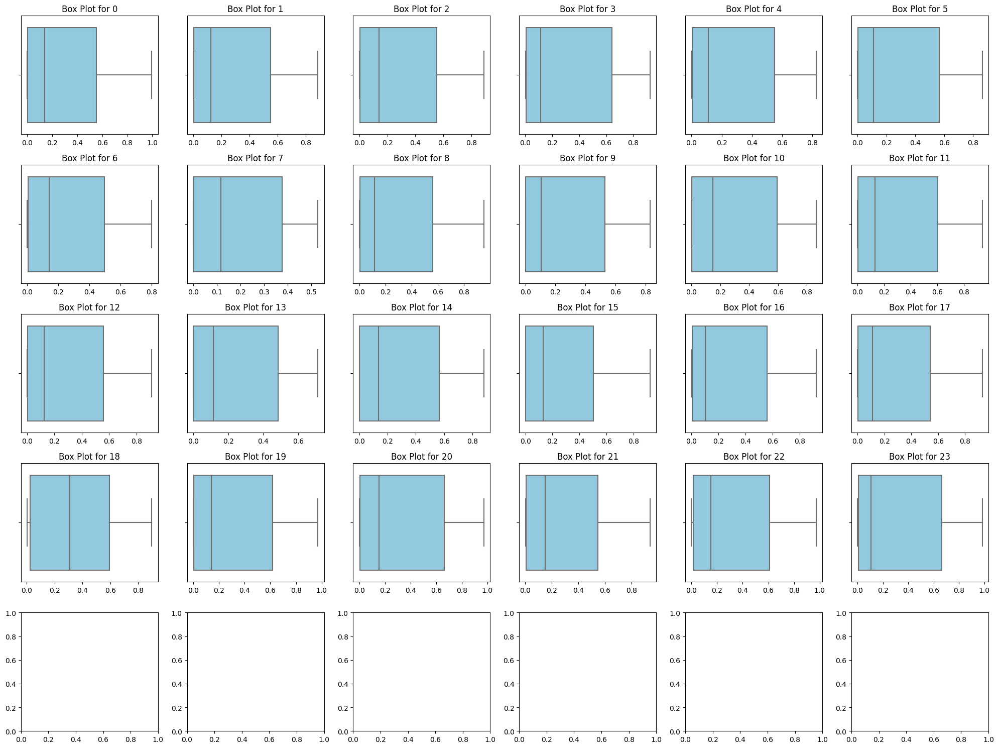

In [88]:
import matplotlib.pyplot as plt
import seaborn as sns

# Assuming X is your dataset with features

# Create subplots
fig, axs = plt.subplots(nrows=5, ncols=6, figsize=(20, 15))

# Flatten the axes array for easy iteration
axs = axs.flatten()

# Plot box plots for each feature
for i, feature in enumerate(st.columns):
    sns.boxplot(x=X[feature], ax=axs[i], orient='v', color='skyblue')
    axs[i].set_title(f'Box Plot for {feature}', fontsize=12)

# Adjust layout
plt.tight_layout()
plt.show()


## PARAMETER TUNING BEFORE DIMENSIONALITY REDUCTION

In [ ]:


# Create synthetic dataset
X, y = make_classification(n_samples=1000, n_features=20, random_state=42)

# Define the classifiers and their respective parameter grids
classifiers = {
    'RandomForest': (RandomForestClassifier(), {
        'n_estimators': [50, 100, 200],
        'max_depth': [None, 10, 20],
        'min_samples_split': [2, 5, 10],
        'min_samples_leaf': [1, 2, 4]
    }),
    'DecisionTree': (DecisionTreeClassifier(), {
        'max_depth': [None, 10, 20],
        'min_samples_split': [2, 5, 10],
        'min_samples_leaf': [1, 2, 4]
    }),
    'SVM': (SVC(), {
        'C': [0.1, 1, 10],
        'kernel': ['linear', 'rbf'],
        'gamma': ['scale', 'auto']
    }),
    'KNN': (KNeighborsClassifier(), {
        'n_neighbors': [3, 5, 7],
        'weights': ['uniform', 'distance'],
        'p': [1, 2]  # 1 for Manhattan distance, 2 for Euclidean distance
    }),
    'Lasso': (Lasso(), {
        'alpha': [0.01, 0.1, 1.0]
    }),
    'NaiveBayes': (GaussianNB(), {}),  # No hyperparameters to tune for Gaussian Naive Bayes
    'LogisticRegression': (LogisticRegression(), {
        'C': [0.1, 1, 10],
        'penalty': ['l1', 'l2']
    })
}

# Perform grid search for each classifier
for clf_name, (clf, param_grid) in classifiers.items():
    print(f"Grid search for {clf_name}:")
    
    # Initialize GridSearchCV
    grid_search = GridSearchCV(clf, param_grid, cv=5, scoring='accuracy')
    
    # Fit the grid search to the data
    grid_search.fit(X, y)
    
    # Print the best parameters found
    print("Best parameters:", grid_search.best_params_)
    
    # Print the best score found
    print("Best score:", grid_search.best_score_)
    print()


### As we can see Random Forest gives best score at 90.3%

## K-FOLD CROSS VALIDATION

In [69]:
# Perform k-fold cross-validation for each classifier
for clf_name, (clf, param_grid) in classifiers.items():
    print(f"Cross-validation scores for {clf_name}:")
    
    # Perform k-fold cross-validation
    scores = cross_val_score(clf, X, y, cv=5)
    
    # Print the cross-validation scores
    print("Cross-validation scores:", scores)
    
    # Print the mean score and standard deviation
    print("Mean accuracy:", scores.mean())
    print("Standard deviation:", scores.std())
    print()

Cross-validation scores for RandomForest:
Cross-validation scores: [0.935 0.915 0.89  0.89  0.85 ]
Mean accuracy: 0.8960000000000001
Standard deviation: 0.028530685235374238

Cross-validation scores for DecisionTree:
Cross-validation scores: [0.875 0.86  0.835 0.87  0.86 ]
Mean accuracy: 0.86
Standard deviation: 0.013784048752090234

Cross-validation scores for SVM:
Cross-validation scores: [0.88  0.885 0.865 0.84  0.83 ]
Mean accuracy: 0.86
Standard deviation: 0.021679483388678818

Cross-validation scores for KNN:
Cross-validation scores: [0.855 0.825 0.82  0.785 0.785]
Mean accuracy: 0.8140000000000001
Standard deviation: 0.026532998322843174

Cross-validation scores for Lasso:
Cross-validation scores: [-0.00564532 -0.00769395 -0.00140752 -0.06510417 -0.00250401]
Mean accuracy: -0.01647099267242953
Standard deviation: 0.024418854258718724

Cross-validation scores for NaiveBayes:
Cross-validation scores: [0.85  0.855 0.825 0.83  0.815]
Mean accuracy: 0.8350000000000002
Standard deviat

### As we see Random forest has best cross-validation scores maximum at 93%

## DIMENSIONALITY REDUCTION (LDA)

### We perform Dimensionality reduction to see improvements in accuracy in the algorithms

In [90]:
# Initialize and fit LDA
lda = LinearDiscriminantAnalysis(n_components=None)
X = lda.fit_transform(X, y)
# Create a DataFrame for the LDA-transformed data
n_components = X.shape[1]  # Get the number of components
lda_data = pd.DataFrame(X, columns=[f'Component {i}' for i in range(1, n_components + 1)])

# Add the target variable to the DataFrame
lda_data['Target'] = y  

# Set option to display all columns
pd.set_option('display.max_columns', None)

print(lda_data.head())

   Component 1  Target
0     1.752227       1
1    -0.973681       0
2     1.279320       1
3     0.926387       1
4    -0.675353       0


### LDA has reduced the components to 1 as the number of classes were 2 thus it was projected in x-y space

## HYPERPARAMETER TUNING

In [91]:
# Define the classifiers and their respective parameter grids
classifiers = {
    'RandomForest': (RandomForestClassifier(), {
        'n_estimators': [50, 100, 200],
        'max_depth': [None, 10, 20],
        'min_samples_split': [2, 5, 10],
        'min_samples_leaf': [1, 2, 4]
    }),
    'DecisionTree': (DecisionTreeClassifier(), {
        'max_depth': [None, 10, 20],
        'min_samples_split': [2, 5, 10],
        'min_samples_leaf': [1, 2, 4]
    }),
    'SVM': (SVC(), {
        'C': [0.1, 1, 10],
        'kernel': ['linear', 'rbf'],
        'gamma': ['scale', 'auto']
    }),
    'KNN': (KNeighborsClassifier(), {
        'n_neighbors': [3, 5, 7],
        'weights': ['uniform', 'distance'],
        'p': [1, 2]  # 1 for Manhattan distance, 2 for Euclidean distance
    }),
    'Lasso': (Lasso(), {
        'alpha': [0.01, 0.1, 1.0]
    }),
    'NaiveBayes': (GaussianNB(), {}),  # No hyperparameters to tune for Gaussian Naive Bayes
    'LogisticRegression': (LogisticRegression(), {
        'C': [0.1, 1, 10],
        'penalty': ['l1', 'l2']
    })
}

# Perform grid search for each classifier
for clf_name, (clf, param_grid) in classifiers.items():
    print(f"Grid search for {clf_name}:")
    
    # Initialize GridSearchCV
    grid_search = GridSearchCV(clf, param_grid, cv=5, scoring='accuracy')
    
    # Fit the grid search to the data
    grid_search.fit(X, y)
    
    # Print the best parameters found
    print("Best parameters:", grid_search.best_params_)
    
    # Print the best score found
    print("Best score:", grid_search.best_score_)
    print()


Grid search for RandomForest:
Best parameters: {'max_depth': 20, 'min_samples_leaf': 1, 'min_samples_split': 5, 'n_estimators': 200}
Best score: 0.9010000000000001

Grid search for SVM:
Best parameters: {'C': 10, 'gamma': 'scale', 'kernel': 'linear'}
Best score: 0.874

Grid search for KNN:
Best parameters: {'n_neighbors': 7, 'p': 1, 'weights': 'uniform'}
Best score: 0.849

Grid search for Lasso:
Best parameters: {'alpha': 0.01}
Best score: nan

Grid search for NaiveBayes:
Best parameters: {}
Best score: 0.8350000000000002

Grid search for LogisticRegression:
Best parameters: {'C': 0.1, 'penalty': 'l2'}
Best score: 0.8710000000000001



### As we see after LDA in this case accuracy of Random Forest reduces by 0.2%

## K-FOLD CROSS VALIDATION

In [92]:
# Perform k-fold cross-validation for each classifier
for clf_name, (clf, param_grid) in classifiers.items():
    print(f"Cross-validation scores for {clf_name}:")
    
    # Perform k-fold cross-validation
    scores = cross_val_score(clf, X, y, cv=5)
    
    # Print the cross-validation scores
    print("Cross-validation scores:", scores)
    
    # Print the mean score and standard deviation
    print("Mean accuracy:", scores.mean())
    print("Standard deviation:", scores.std())
    print()

Cross-validation scores for RandomForest:
Cross-validation scores: [0.92  0.91  0.905 0.905 0.85 ]
Mean accuracy: 0.898
Standard deviation: 0.024617067250182364

Cross-validation scores for SVM:
Cross-validation scores: [0.88  0.885 0.865 0.84  0.83 ]
Mean accuracy: 0.86
Standard deviation: 0.021679483388678818

Cross-validation scores for KNN:
Cross-validation scores: [0.855 0.825 0.82  0.785 0.785]
Mean accuracy: 0.8140000000000001
Standard deviation: 0.026532998322843174

Cross-validation scores for Lasso:
Cross-validation scores: [-0.00564532 -0.00769395 -0.00140752 -0.06510417 -0.00250401]
Mean accuracy: -0.01647099267242953
Standard deviation: 0.024418854258718724

Cross-validation scores for NaiveBayes:
Cross-validation scores: [0.85  0.855 0.825 0.83  0.815]
Mean accuracy: 0.8350000000000002
Standard deviation: 0.015165750888103116

Cross-validation scores for LogisticRegression:
Cross-validation scores: [0.9   0.885 0.875 0.83  0.845]
Mean accuracy: 0.867
Standard deviation: 0

## even the cross val score reduces by 1%

### Thus we conclude that in this case LDA is reducing features which leads to loss of certain important features .
### **Thus we dont use LDA here.**

## As we know RANDOM FOREST GIVE BEST ACCURACY with parameters 
## Best parameters: {'max_depth': None, 'min_samples_leaf': 1, 'min_samples_split': 5, 'n_estimators': 100}

In [114]:
y_pred

array([1, 1, 0, 1, 1, 0, 0, 1, 1, 0, 1, 1, 0, 1, 1, 0, 0, 1, 1, 0, 1, 0,
       0, 0, 1, 0, 1, 1, 0, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0,
       1, 0, 1, 0, 1, 1, 0, 0, 0, 1, 1, 0, 0, 0, 1, 0, 1, 0, 0, 1, 1, 0,
       1, 1, 1, 0, 0, 0, 0, 0, 0, 1, 0, 1, 1, 0, 0, 0, 0, 1, 1, 1, 0, 0,
       0, 0, 1, 0, 0, 0, 1, 0, 1, 0, 1, 0, 1, 1, 0, 0, 1, 0, 1, 0, 0, 0,
       0, 0, 0, 1, 0, 1, 1, 0, 1, 0, 1, 1, 0, 0, 1, 1, 1, 0, 0, 0, 0, 1,
       1, 0, 1, 1, 1, 1, 0, 1, 0, 0, 1, 1, 0, 1, 1, 0, 0, 1, 1, 1, 0, 0,
       1, 0, 1, 1, 0, 0, 0, 1, 1, 0, 1, 0, 1, 1, 1, 0, 0, 0, 0, 0, 0, 1,
       1, 1, 1, 0, 1, 1, 0, 1, 1, 1, 0, 0, 0, 1, 0, 1, 0, 1, 1, 1, 1, 1,
       0, 1])

In [116]:
from sklearn.metrics import *
report = classification_report(y_test,y_pred)
print(report)

              precision    recall  f1-score   support

           0       0.84      0.94      0.89        93
           1       0.94      0.85      0.89       107

    accuracy                           0.89       200
   macro avg       0.89      0.89      0.89       200
weighted avg       0.89      0.89      0.89       200



In [117]:
# Calculate accuracy
accuracy = accuracy_score(y_test, y_pred)
print("Random Forest Accuracy:", accuracy)

Random Forest Accuracy: 0.89


## STRATIFIED K-FOLD

In [118]:
from sklearn.model_selection import StratifiedKFold
from sklearn.tree import DecisionTreeClassifier
import numpy as np

# Initialize Decision Tree classifier with best parameters
best_dt_estimator = RandomForestClassifier(n_estimators=50, max_depth=10, min_samples_split=2, min_samples_leaf=2, random_state=42)

# Initialize StratifiedKFold cross-validation
skf = StratifiedKFold(n_splits=10, shuffle=True, random_state=42)

# Perform stratified k-fold cross-validation
cv_scores_dt = []
for train_index, test_index in skf.split(X, y):
    X_train, X_test = X[train_index], X[test_index]
    y_train, y_test = y[train_index], y[test_index]
    
    # Fit the model on the training data
    best_dt_estimator.fit(X_train, y_train)
    
    # Evaluate the model on the test data
    cv_score_dt = best_dt_estimator.score(X_test, y_test)
    cv_scores_dt.append(cv_score_dt)

# Calculate mean and standard deviation of cross-validation scores
mean_cv_score_dt = np.mean(cv_scores_dt)
std_cv_score_dt = np.std(cv_scores_dt)

print("Cross-validation scores for Decision Tree:", cv_scores_dt)
print("Mean cross-validation score for Decision Tree:", mean_cv_score_dt)
print("Standard deviation of cross-validation scores for Decision Tree:", std_cv_score_dt)


Cross-validation scores for Decision Tree: [0.86, 0.9, 0.91, 0.93, 0.93, 0.86, 0.85, 0.9, 0.93, 0.83]
Mean cross-validation score for Decision Tree: 0.89
Standard deviation of cross-validation scores for Decision Tree: 0.03521363372331805


## K-FOLD

In [119]:
from sklearn.model_selection import KFold
from sklearn.tree import DecisionTreeClassifier
import numpy as np

# Initialize Decision Tree classifier with best parameters
best_dt_estimator = RandomForestClassifier(n_estimators=50, max_depth=10, min_samples_split=2, min_samples_leaf=2, random_state=42)

# Initialize KFold cross-validation
kfold = KFold(n_splits=10, shuffle=True, random_state=42)

# Perform k-fold cross-validation
cv_scores_dt = []
for train_index, test_index in kfold.split(X):
    X_train, X_test = X[train_index], X[test_index]
    y_train, y_test = y[train_index], y[test_index]
    
    # Fit the model on the training data
    best_dt_estimator.fit(X_train, y_train)
    
    # Evaluate the model on the test data
    cv_score_dt = best_dt_estimator.score(X_test, y_test)
    cv_scores_dt.append(cv_score_dt)

# Calculate mean and standard deviation of cross-validation scores
mean_cv_score_dt = np.mean(cv_scores_dt)
std_cv_score_dt = np.std(cv_scores_dt)

print("Cross-validation scores for Decision Tree:", cv_scores_dt)
print("Mean cross-validation score for Decision Tree:", mean_cv_score_dt)
print("Standard deviation of cross-validation scores for Decision Tree:", std_cv_score_dt)


Cross-validation scores for Decision Tree: [0.88, 0.91, 0.82, 0.9, 0.92, 0.93, 0.88, 0.87, 0.92, 0.91]
Mean cross-validation score for Decision Tree: 0.8939999999999999
Standard deviation of cross-validation scores for Decision Tree: 0.031048349392520075


## BOOSTING

In [121]:
# Define base classifiers
base_classifier_boosting = GradientBoostingClassifier(n_estimators=50, random_state=42)
base_classifier_stacking = GradientBoostingClassifier(n_estimators=50)

# Define meta-classifier for stacking
meta_classifier =  RandomForestClassifier(n_estimators=50, max_depth=10, min_samples_leaf=2, min_samples_split=2)

# Boosting
boosting_model = AdaBoostClassifier(base_estimator=base_classifier_boosting, n_estimators=10, random_state=42)
boosting_predictions = cross_val_predict(boosting_model, X, y, cv=5)
boosting_accuracy = accuracy_score(y, boosting_predictions)
print("Boosting Accuracy:", boosting_accuracy)

# Stacking
stacking_predictions = cross_val_predict(base_classifier_stacking, X, y, cv=5, method='predict_proba')
stacking_meta_features = stacking_predictions[:, 1]  # Use class probabilities as meta-features
stacking_meta_predictions = cross_val_predict(meta_classifier, stacking_meta_features.reshape(-1, 1), y, cv=5)
stacking_accuracy = accuracy_score(y, stacking_meta_predictions)
print("Stacking Accuracy:", stacking_accuracy)

# XGBClassifier
xgb_model = XGBClassifier(n_estimators=100, max_depth=3, learning_rate=0.1)
xgb_predictions = cross_val_predict(xgb_model, X, y, cv=5)
xgb_accuracy = accuracy_score(y, xgb_predictions)
print("XGBClassifier Accuracy:", xgb_accuracy)


Boosting Accuracy: 0.902
Stacking Accuracy: 0.89
XGBClassifier Accuracy: 0.905


### FEATURE IMPACT RANKING USING RANDOM FOREST

In [122]:
X_new=galaxy.drop('ISOLATED',axis=1)
column_names = X_new.columns.tolist()
feature_importances = random_forest.feature_importances_
indices = np.argsort(feature_importances)[::-1]

print("Feature ranking:")
for f in range(X.shape[1]):
    print(f"{f + 1}. Feature {indices[f]} ({column_names[indices[f]]}): {feature_importances[indices[f]]}")

Feature ranking:
1. Feature 5 (gRaw): 0.3583088288097714
2. Feature 18 (zRawPSF): 0.199551596916448
3. Feature 1 (dec): 0.11071551910778504
4. Feature 14 (uRawPSF): 0.08247175871116923
5. Feature 11 (rErr): 0.02133759386007726
6. Feature 2 (run): 0.019143526606455432
7. Feature 6 (rRaw): 0.018708153189882146
8. Feature 9 (uErr): 0.017368845113032022
9. Feature 12 (iErr): 0.016693525517696144
10. Feature 15 (gRawPSF): 0.01633607873161105
11. Feature 16 (rRawPSF): 0.015456283646237651
12. Feature 4 (uRaw): 0.01478350170309239
13. Feature 17 (iRawPSF): 0.01460295428382642
14. Feature 19 (upsfErr): 0.014299478384294887
15. Feature 10 (gErr): 0.014297554150041233
16. Feature 0 (ra): 0.01357450617352562
17. Feature 13 (zErr): 0.013245980229603906
18. Feature 8 (zRaw): 0.013207989747977735
19. Feature 7 (iRaw): 0.013108634621071855
20. Feature 3 (rExtSFD): 0.012787690496400668


## ON STAR DATA

In [124]:
star.head()

,ra,dec,run,rExtSFD,uRaw,gRaw,rRaw,iRaw,zRaw,uErr,...,rRawPSF,iRawPSF,zRawPSF,upsfErr,gpsfErr,rpsfErr,ipsfErr,zpsfErr,type,ISOLATED
0,0.358382,-0.551157,2728,0.107,25.302,22.345,20.589,18.896,17.984,0.711,...,20.617,18.896,17.976,0.793,0.094,0.038,0.035,0.038,6,0
1,0.357910,-0.426526,2728,0.100,23.190,22.398,20.941,19.967,19.506,0.453,...,20.907,19.930,19.515,0.382,0.102,0.045,0.035,0.070,6,0
2,0.221928,-0.515993,2728,0.112,20.814,19.541,18.999,18.781,18.711,0.069,...,18.981,18.803,18.707,0.065,0.022,0.017,0.019,0.036,6,1
3,0.201648,-0.515987,2728,0.114,22.747,20.192,18.743,17.626,17.038,0.317,...,18.758,17.661,17.061,0.294,0.026,0.017,0.017,0.022,6,1
4,0.082421,-0.428948,2728,0.109,17.680,16.087,15.451,15.228,15.122,0.011,...,15.445,15.185,15.118,0.019,0.024,0.016,0.015,0.017,6,1


In [126]:
X=star.drop(['type','ISOLATED'],axis=1)
X

,ra,dec,run,rExtSFD,uRaw,gRaw,rRaw,iRaw,zRaw,uErr,...,uRawPSF,gRawPSF,rRawPSF,iRawPSF,zRawPSF,upsfErr,gpsfErr,rpsfErr,ipsfErr,zpsfErr
0,0.358382,-0.551157,2728,0.107,25.302,22.345,20.589,18.896,17.984,0.711,...,24.989,22.347,20.617,18.896,17.976,0.793,0.094,0.038,0.035,0.038
1,0.357910,-0.426526,2728,0.100,23.190,22.398,20.941,19.967,19.506,0.453,...,23.020,22.333,20.907,19.930,19.515,0.382,0.102,0.045,0.035,0.070
2,0.221928,-0.515993,2728,0.112,20.814,19.541,18.999,18.781,18.711,0.069,...,20.804,19.544,18.981,18.803,18.707,0.065,0.022,0.017,0.019,0.036
3,0.201648,-0.515987,2728,0.114,22.747,20.192,18.743,17.626,17.038,0.317,...,22.695,20.199,18.758,17.661,17.061,0.294,0.026,0.017,0.017,0.022
4,0.082421,-0.428948,2728,0.109,17.680,16.087,15.451,15.228,15.122,0.011,...,17.672,16.089,15.445,15.185,15.118,0.019,0.024,0.016,0.015,0.017
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
81998,3.901362,0.174753,4263,0.074,25.132,23.824,22.379,22.192,22.210,0.584,...,24.838,23.824,22.452,22.196,22.244,0.587,0.249,0.117,0.124,0.447
81999,3.827054,-0.629380,5052,0.093,23.859,22.951,21.556,21.381,20.574,0.732,...,23.585,22.969,21.745,21.516,20.659,0.566,0.149,0.073,0.096,0.180
82000,3.796468,-0.209774,5052,0.073,24.877,23.032,22.169,20.390,19.557,0.751,...,24.841,23.122,22.235,20.450,19.665,0.713,0.157,0.110,0.040,0.077
82001,3.820514,-0.209810,5052,0.074,24.650,21.268,19.819,18.606,17.963,0.739,...,24.458,21.254,19.818,18.602,17.951,0.721,0.040,0.024,0.021,0.028


In [127]:
y= star['ISOLATED']
y

0        0
1        0
2        1
3        1
4        1
        ..
81998    1
81999    1
82000    1
82001    1
82002    1
Name: ISOLATED, Length: 82003, dtype: int64

In [128]:
y.value_counts()

ISOLATED
1    55804
0    26199
Name: count, dtype: int64

In [130]:
scaler = MinMaxScaler()
X = scaler.fit_transform(X)
X
st=pd.DataFrame(X)
st

,0,1,2,3,4,5,6,7,8,9,...,14,15,16,17,18,19,20,21,22,23
0,0.035819,0.224412,0.015721,0.276596,0.633265,0.509872,0.780471,0.304577,0.305747,0.023687,...,0.839748,0.655863,0.590006,0.434736,0.421468,0.012611,0.000302,0.000121,0.000306,0.000582
1,0.035772,0.286729,0.015721,0.246809,0.501897,0.513163,0.820908,0.367175,0.404926,0.015043,...,0.672088,0.654751,0.615164,0.520702,0.559358,0.006017,0.000330,0.000147,0.000306,0.001203
2,0.022173,0.241994,0.015721,0.297872,0.354108,0.335775,0.597817,0.297855,0.353121,0.002178,...,0.483396,0.433190,0.448078,0.427004,0.486964,0.000931,0.000046,0.000041,0.000118,0.000543
3,0.020145,0.241997,0.015721,0.306383,0.474342,0.376195,0.568409,0.230347,0.244103,0.010486,...,0.644414,0.485224,0.428733,0.332059,0.339486,0.004605,0.000060,0.000041,0.000094,0.000272
4,0.008222,0.285518,0.015721,0.285106,0.159171,0.121321,0.190235,0.090186,0.119249,0.000235,...,0.216706,0.158723,0.141320,0.126206,0.165397,0.000193,0.000053,0.000038,0.000071,0.000175
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
81998,0.390124,0.587379,0.321194,0.136170,0.622691,0.601701,0.986100,0.497224,0.581129,0.019432,...,0.826890,0.773197,0.749198,0.709095,0.803871,0.009306,0.000852,0.000419,0.001353,0.008516
81999,0.382693,0.185299,0.478209,0.217021,0.543509,0.547498,0.891557,0.449822,0.474521,0.024390,...,0.720198,0.705275,0.687863,0.652561,0.661858,0.008969,0.000497,0.000253,0.001024,0.003337
82000,0.379635,0.395109,0.478209,0.131915,0.606830,0.552527,0.961976,0.391899,0.408250,0.025027,...,0.827146,0.717429,0.730372,0.563934,0.572798,0.011327,0.000525,0.000392,0.000365,0.001339
82001,0.382039,0.395091,0.478209,0.136170,0.592710,0.443003,0.692016,0.287626,0.304379,0.024625,...,0.794533,0.569034,0.520691,0.410293,0.419228,0.011456,0.000110,0.000068,0.000141,0.000388


In [142]:
from sklearn.metrics import *
report = classification_report(y_test,y_pred)
print(report)

              precision    recall  f1-score   support

           0       0.84      0.94      0.89        93
           1       0.94      0.85      0.89       107

    accuracy                           0.89       200
   macro avg       0.89      0.89      0.89       200
weighted avg       0.89      0.89      0.89       200



In [143]:
# Calculate accuracy
accuracy = accuracy_score(y_test, y_pred)
print("Random Forest Accuracy:", accuracy)

Random Forest Accuracy: 0.89


In [144]:
from sklearn.model_selection import StratifiedKFold
from sklearn.tree import DecisionTreeClassifier
import numpy as np

# Initialize Decision Tree classifier with best parameters
best_dt_estimator = RandomForestClassifier(n_estimators=50, max_depth=10, min_samples_split=2, min_samples_leaf=2, random_state=42)

# Initialize StratifiedKFold cross-validation
skf = StratifiedKFold(n_splits=10, shuffle=True, random_state=42)

# Perform stratified k-fold cross-validation
cv_scores_dt = []
for train_index, test_index in skf.split(X, y):
    X_train, X_test = X[train_index], X[test_index]
    y_train, y_test = y[train_index], y[test_index]
    
    # Fit the model on the training data
    best_dt_estimator.fit(X_train, y_train)
    
    # Evaluate the model on the test data
    cv_score_dt = best_dt_estimator.score(X_test, y_test)
    cv_scores_dt.append(cv_score_dt)

# Calculate mean and standard deviation of cross-validation scores
mean_cv_score_dt = np.mean(cv_scores_dt)
std_cv_score_dt = np.std(cv_scores_dt)

print("Cross-validation scores for Decision Tree:", cv_scores_dt)
print("Mean cross-validation score for Decision Tree:", mean_cv_score_dt)
print("Standard deviation of cross-validation scores for Decision Tree:", std_cv_score_dt)


Cross-validation scores for Decision Tree: [0.86, 0.9, 0.91, 0.93, 0.93, 0.86, 0.85, 0.9, 0.93, 0.83]
Mean cross-validation score for Decision Tree: 0.89
Standard deviation of cross-validation scores for Decision Tree: 0.03521363372331805


In [145]:
from sklearn.model_selection import KFold
from sklearn.tree import DecisionTreeClassifier
import numpy as np

# Initialize Decision Tree classifier with best parameters
best_dt_estimator = RandomForestClassifier(n_estimators=50, max_depth=10, min_samples_split=2, min_samples_leaf=2, random_state=42)

# Initialize KFold cross-validation
kfold = KFold(n_splits=10, shuffle=True, random_state=42)

# Perform k-fold cross-validation
cv_scores_dt = []
for train_index, test_index in kfold.split(X):
    X_train, X_test = X[train_index], X[test_index]
    y_train, y_test = y[train_index], y[test_index]
    
    # Fit the model on the training data
    best_dt_estimator.fit(X_train, y_train)
    
    # Evaluate the model on the test data
    cv_score_dt = best_dt_estimator.score(X_test, y_test)
    cv_scores_dt.append(cv_score_dt)

# Calculate mean and standard deviation of cross-validation scores
mean_cv_score_dt = np.mean(cv_scores_dt)
std_cv_score_dt = np.std(cv_scores_dt)

print("Cross-validation scores for Decision Tree:", cv_scores_dt)
print("Mean cross-validation score for Decision Tree:", mean_cv_score_dt)
print("Standard deviation of cross-validation scores for Decision Tree:", std_cv_score_dt)


Cross-validation scores for Decision Tree: [0.88, 0.91, 0.82, 0.9, 0.92, 0.93, 0.88, 0.87, 0.92, 0.91]
Mean cross-validation score for Decision Tree: 0.8939999999999999
Standard deviation of cross-validation scores for Decision Tree: 0.031048349392520075


In [146]:
# Define base classifiers
base_classifier_boosting = GradientBoostingClassifier(n_estimators=50, random_state=42)
base_classifier_stacking = GradientBoostingClassifier(n_estimators=50)

# Define meta-classifier for stacking
meta_classifier =  RandomForestClassifier(n_estimators=50, max_depth=10, min_samples_leaf=2, min_samples_split=2)

# Boosting
boosting_model = AdaBoostClassifier(base_estimator=base_classifier_boosting, n_estimators=10, random_state=42)
boosting_predictions = cross_val_predict(boosting_model, X, y, cv=5)
boosting_accuracy = accuracy_score(y, boosting_predictions)
print("Boosting Accuracy:", boosting_accuracy)

# Stacking
stacking_predictions = cross_val_predict(base_classifier_stacking, X, y, cv=5, method='predict_proba')
stacking_meta_features = stacking_predictions[:, 1]  # Use class probabilities as meta-features
stacking_meta_predictions = cross_val_predict(meta_classifier, stacking_meta_features.reshape(-1, 1), y, cv=5)
stacking_accuracy = accuracy_score(y, stacking_meta_predictions)
print("Stacking Accuracy:", stacking_accuracy)

# XGBClassifier
xgb_model = XGBClassifier(n_estimators=100, max_depth=3, learning_rate=0.1)
xgb_predictions = cross_val_predict(xgb_model, X, y, cv=5)
xgb_accuracy = accuracy_score(y, xgb_predictions)
print("XGBClassifier Accuracy:", xgb_accuracy)


Boosting Accuracy: 0.902
Stacking Accuracy: 0.885
XGBClassifier Accuracy: 0.905


In [147]:
X_new=star.drop('ISOLATED',axis=1)
column_names = X_new.columns.tolist()
feature_importances = random_forest.feature_importances_
indices = np.argsort(feature_importances)[::-1]

print("Feature ranking:")
for f in range(X.shape[1]):
    print(f"{f + 1}. Feature {indices[f]} ({column_names[indices[f]]}): {feature_importances[indices[f]]}")

Feature ranking:
1. Feature 5 (gRaw): 0.35135888185080527
2. Feature 18 (zRawPSF): 0.21626172981600483
3. Feature 1 (dec): 0.10560020718813361
4. Feature 14 (uRawPSF): 0.0818660037711439
5. Feature 11 (rErr): 0.024004374888055797
6. Feature 2 (run): 0.01820997778966721
7. Feature 16 (rRawPSF): 0.01739725672412213
8. Feature 6 (rRaw): 0.017126099869028386
9. Feature 12 (iErr): 0.01569432118693983
10. Feature 10 (gErr): 0.015198312899475633
11. Feature 7 (iRaw): 0.014911901314760225
12. Feature 19 (upsfErr): 0.014710625024787613
13. Feature 0 (ra): 0.014473123443929066
14. Feature 13 (zErr): 0.014466388292580365
15. Feature 4 (uRaw): 0.01437812998636062
16. Feature 15 (gRawPSF): 0.014133718451631716
17. Feature 17 (iRawPSF): 0.01361090284541547
18. Feature 8 (zRaw): 0.012854833811072983
19. Feature 9 (uErr): 0.012232892695425747
20. Feature 3 (rExtSFD): 0.011510318150659482
